# Analyse des données des systèmes éducatifs

In [1]:
# Affichage avec la bibliothèque graphique intégrée à Notebook
%matplotlib inline

# Importer les librairies dont nous aurons besoin

import pandas as pd
import numpy as np
import os
import missingno as msno
import matplotlib.pyplot as plt
import seaborn as sns


### Description des jeux de données du projet

In [2]:
# Tous les fichiers du projet P2
files = [file for file in os.listdir('projet+python_dataset_Edstats_csv')]
# for file in files:
#      print(file)
print(f"le Nombre de fichiers dans le dossier du projet P2 est {len(files)}. Ils sont : {files}")



le Nombre de fichiers dans le dossier du projet P2 est 5. Ils sont : ['EdStatsCountry-Series.csv', 'EdStatsCountry.csv', 'EdStatsData.csv', 'EdStatsFootNote.csv', 'EdStatsSeries.csv']


In [3]:
# Affichage des colonnes de chaque fichier pour comprendre le contenu
for file in files:
    print(file)
    df_all_affichage = pd.read_csv("projet+python_dataset_Edstats_csv/"+file)
    print(df_all_affichage.columns)

# concatenate files dans le meme dataframe si besoin (pas d'iteret ici)
# all_files = pd.DataFrame() #(creation d'un dataframe vide) 
# for file in files:
#     df= pd.read_csv("projet+python_dataset_Edstats_csv/"+file)
#     all_files= pd.concat([all-files,df])
#all_files.to_csv("all_files.csv", index=False) 

EdStatsCountry-Series.csv
Index(['CountryCode', 'SeriesCode', 'DESCRIPTION', 'Unnamed: 3'], dtype='object')
EdStatsCountry.csv
Index(['Country Code', 'Short Name', 'Table Name', 'Long Name', '2-alpha code',
       'Currency Unit', 'Special Notes', 'Region', 'Income Group', 'WB-2 code',
       'National accounts base year', 'National accounts reference year',
       'SNA price valuation', 'Lending category', 'Other groups',
       'System of National Accounts', 'Alternative conversion factor',
       'PPP survey year', 'Balance of Payments Manual in use',
       'External debt Reporting status', 'System of trade',
       'Government Accounting concept', 'IMF data dissemination standard',
       'Latest population census', 'Latest household survey',
       'Source of most recent Income and expenditure data',
       'Vital registration complete', 'Latest agricultural census',
       'Latest industrial data', 'Latest trade data',
       'Latest water withdrawal data', 'Unnamed: 31'],
     

## Chargement et affichage des données du fichier EdStatsCountry

In [156]:
df_countries = pd.read_csv("EdStatsCountry.csv")
print(df_countries.shape)
df_countries.head()

(241, 32)


,Country Code,Short Name,Table Name,Long Name,2-alpha code,Currency Unit,Special Notes,Region,Income Group,WB-2 code,...,IMF data dissemination standard,Latest population census,Latest household survey,Source of most recent Income and expenditure data,Vital registration complete,Latest agricultural census,Latest industrial data,Latest trade data,Latest water withdrawal data,Unnamed: 31
0,ABW,Aruba,Aruba,Aruba,AW,Aruban florin,SNA data for 2000-2011 are updated from official government statistics; 1994-1999 from UN databases. Base year has changed from 1995 to 2000.,Latin America & Caribbean,High income: nonOECD,AW,...,NaN,2010,NaN,NaN,Yes,NaN,NaN,2012.0,NaN,NaN
1,AFG,Afghanistan,Afghanistan,Islamic State of Afghanistan,AF,Afghan afghani,Fiscal year end: March 20; reporting period for national accounts data: FY (from 2013 are CY). National accounts data are sourced from the IMF and differ from the Central Statistics Organization numbers due to exclusion of the opium economy.,South Asia,Low income,AF,...,General Data Dissemination System (GDDS),1979,"Multiple Indicator Cluster Survey (MICS), 2010/11","Integrated household survey (IHS), 2008",NaN,2013/14,NaN,2012.0,2000,NaN
2,AGO,Angola,Angola,People's Republic of Angola,AO,Angolan kwanza,"April 2013 database update: Based on IMF data, national accounts data were revised for 2000 onward; the base year changed to 2002.",Sub-Saharan Africa,Upper middle income,AO,...,General Data Dissemination System (GDDS),1970,"Malaria Indicator Survey (MIS), 2011","Integrated household survey (IHS), 2008",NaN,2015,NaN,NaN,2005,NaN
3,ALB,Albania,Albania,Republic of Albania,AL,Albanian lek,NaN,Europe & Central Asia,Upper middle income,AL,...,General Data Dissemination System (GDDS),2011,"Demographic and Health Survey (DHS), 2008/09","Living Standards Measurement Study Survey (LSMS), 2012",Yes,2012,2010.0,2012.0,2006,NaN
4,AND,Andorra,Andorra,Principality of Andorra,AD,Euro,NaN,Europe & Central Asia,High income: nonOECD,AD,...,NaN,2011. Population figures compiled from administrative registers.,NaN,NaN,Yes,NaN,NaN,2006.0,NaN,NaN


-------------------------------------------------------------------------------------------------------------------------------

###### Le fichier EdStatsCountry contient des informations géographiques sur les pays (noms et codes) et les regroupements des 7 régions par groupe de revenus ainsi que des données économiques globales et des dates de référence des dernières études.

-------------------------------------------------------------------------------------------------------------------------------

## Chargement et affichage des données du fichier EdStatsCountry-Series

In [5]:
df_Country_Series = pd.read_csv("EdStatsCountry-Series.csv")
print(df_Country_Series.shape)
df_Country_Series.head()


(613, 4)


,CountryCode,SeriesCode,DESCRIPTION,Unnamed: 3
0,ABW,SP.POP.TOTL,Data sources : United Nations World Population...,NaN
1,ABW,SP.POP.GROW,Data sources: United Nations World Population ...,NaN
2,AFG,SP.POP.GROW,Data sources: United Nations World Population ...,NaN
3,AFG,NY.GDP.PCAP.PP.CD,Estimates are based on regression.,NaN
4,AFG,SP.POP.TOTL,Data sources : United Nations World Population...,NaN




##### Le fichier EdStatsCountry-Series contient les références des sources de certains indicateurs par pays présents dans EdStatsCountry.csv.

-------------------------------------------------------------------------------------------------------------------------------

## Chargement et affichage des données du fichier EdStatsFootNote.csv :

In [158]:
df_Foot = pd.read_csv("EdStatsFootNote.csv")
print(df_Foot.shape)
df_Foot.head()


(643638, 5)


,CountryCode,SeriesCode,Year,DESCRIPTION,Unnamed: 4
0,ABW,SE.PRE.ENRL.FE,YR2001,Country estimation.,NaN
1,ABW,SE.TER.TCHR.FE,YR2005,Country estimation.,NaN
2,ABW,SE.PRE.TCHR.FE,YR2000,Country estimation.,NaN
3,ABW,SE.SEC.ENRL.GC,YR2004,Country estimation.,NaN
4,ABW,SE.PRE.TCHR,YR2006,Country estimation.,NaN


In [157]:
print(df_Foot.shape)

(643638, 5)


-------------------------------------------------------------------------------------------------------------------------------

##### Le fichier EdStatsFootNote.csv contient les années de références de mises à jour des indicateurs par pays.

-------------------------------------------------------------------------------------------------------------------------------

## Chargement et affichage des données du fichier EdStatsSeries

In [160]:
df_Series = pd.read_csv("EdStatsSeries.csv")
print(df_Series.shape)
df_Series.head()


(3665, 21)


,Series Code,Topic,Indicator Name,Short definition,Long definition,Unit of measure,Periodicity,Base Period,Other notes,Aggregation method,...,Notes from original source,General comments,Source,Statistical concept and methodology,Development relevance,Related source links,Other web links,Related indicators,License Type,Unnamed: 20
0,BAR.NOED.1519.FE.ZS,Attainment,Barro-Lee: Percentage of female population age 15-19 with no education,Percentage of female population age 15-19 with no education,Percentage of female population age 15-19 with no education,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,Robert J. Barro and Jong-Wha Lee: http://www.barrolee.com/,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,BAR.NOED.1519.ZS,Attainment,Barro-Lee: Percentage of population age 15-19 with no education,Percentage of population age 15-19 with no education,Percentage of population age 15-19 with no education,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,Robert J. Barro and Jong-Wha Lee: http://www.barrolee.com/,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,BAR.NOED.15UP.FE.ZS,Attainment,Barro-Lee: Percentage of female population age 15+ with no education,Percentage of female population age 15+ with no education,Percentage of female population age 15+ with no education,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,Robert J. Barro and Jong-Wha Lee: http://www.barrolee.com/,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,BAR.NOED.15UP.ZS,Attainment,Barro-Lee: Percentage of population age 15+ with no education,Percentage of population age 15+ with no education,Percentage of population age 15+ with no education,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,Robert J. Barro and Jong-Wha Lee: http://www.barrolee.com/,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,BAR.NOED.2024.FE.ZS,Attainment,Barro-Lee: Percentage of female population age 20-24 with no education,Percentage of female population age 20-24 with no education,Percentage of female population age 20-24 with no education,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,Robert J. Barro and Jong-Wha Lee: http://www.barrolee.com/,NaN,NaN,NaN,NaN,NaN,NaN,NaN


-------------------------------------------------------------------------------------------------------------------------------

##### Le fichier EdStatsSeries.csv contient les descriptions detaillees des indicateurs et ils sont classes dans 37 topics. Ce fichier est surement nteressant pour la comprehension de signification des indicateurs et nous aidera a selectionner les plus pertinents.

-------------------------------------------------------------------------------------------------------------------------------

## Chargement et affichage des données du fichier EdStatsData

In [161]:
dft = pd.read_csv("EdStatsData.csv")
print(dft.shape)
dft.head()


(886930, 70)


,Country Name,Country Code,Indicator Name,Indicator Code,1970,1971,1972,1973,1974,1975,...,2060,2065,2070,2075,2080,2085,2090,2095,2100,Unnamed: 69
0,Arab World,ARB,"Adjusted net enrolment rate, lower secondary, both sexes (%)",UIS.NERA.2,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Arab World,ARB,"Adjusted net enrolment rate, lower secondary, female (%)",UIS.NERA.2.F,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Arab World,ARB,"Adjusted net enrolment rate, lower secondary, gender parity index (GPI)",UIS.NERA.2.GPI,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Arab World,ARB,"Adjusted net enrolment rate, lower secondary, male (%)",UIS.NERA.2.M,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Arab World,ARB,"Adjusted net enrolment rate, primary, both sexes (%)",SE.PRM.TENR,54.822121,54.894138,56.209438,57.267109,57.991138,59.36554,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


-------------------------------------------------------------------------------------------------------------------------------

##### Le fichier EdStatsData.csv  donne l'évolution de plusieurs indicateurs  pour tous les pays du monde ainsi que des regions sur une période de 1970 à 2017 avec des prédictions pour les années 2020 - 2100. A analyser en detail. 

-------------------------------------------------------------------------------------------------------------------------------

### Nombre de lignes et de colonnes :

In [9]:
print(dft.shape)
rows = len(dft.axes[0])  
cols = len(dft.axes[1]) 
print("Nombre des lignes est: ", rows) 
print("Nombre de colonnes est: ", cols) 
print(f"Il y a {rows*cols} Valeures (renseignees ou pas)")

(886930, 70)
Nombre des lignes est:  886930
Nombre de colonnes est:  70
Il y a 62085100 Valeures (renseignees ou pas)


In [10]:
dft.describe(include="all")


,Country Name,Country Code,Indicator Name,Indicator Code,1970,1971,1972,1973,1974,1975,...,2060,2065,2070,2075,2080,2085,2090,2095,2100,Unnamed: 69
count,886930,886930,886930,886930,7.228800e+04,3.553700e+04,3.561900e+04,3.554500e+04,3.573000e+04,8.730600e+04,...,5.143600e+04,5.143600e+04,5.143600e+04,5.143600e+04,5.143600e+04,5.143600e+04,5.143600e+04,5.143600e+04,5.143600e+04,0.0
unique,242,242,3665,3665,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,Arab World,ARB,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,3665,3665,242,242,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,NaN,NaN,NaN,1.974772e+09,4.253638e+09,4.592365e+09,5.105006e+09,5.401493e+09,2.314288e+09,...,7.224868e+02,7.271290e+02,7.283779e+02,7.266484e+02,7.228327e+02,7.176899e+02,7.113072e+02,7.034274e+02,6.940296e+02,NaN
std,NaN,NaN,NaN,NaN,1.211687e+11,1.804814e+11,1.914083e+11,2.059170e+11,2.112150e+11,1.375059e+11,...,2.215845e+04,2.287990e+04,2.352338e+04,2.408149e+04,2.455897e+04,2.496587e+04,2.530183e+04,2.556069e+04,2.574189e+04,NaN
min,NaN,NaN,NaN,NaN,-1.435564e+00,-1.594625e+00,-3.056522e+00,-4.032582e+00,-4.213563e+00,-3.658569e+00,...,-1.630000e+00,-1.440000e+00,-1.260000e+00,-1.090000e+00,-9.200000e-01,-7.800000e-01,-6.500000e-01,-5.500000e-01,-4.500000e-01,NaN
25%,NaN,NaN,NaN,NaN,8.900000e-01,8.853210e+00,9.240920e+00,9.595200e+00,9.861595e+00,1.400000e+00,...,3.000000e-02,3.000000e-02,2.000000e-02,2.000000e-02,1.000000e-02,1.000000e-02,1.000000e-02,1.000000e-02,1.000000e-02,NaN
50%,NaN,NaN,NaN,NaN,6.317724e+00,6.316240e+01,6.655139e+01,6.969595e+01,7.087760e+01,9.677420e+00,...,2.300000e-01,2.300000e-01,2.300000e-01,2.300000e-01,2.300000e-01,2.300000e-01,2.300000e-01,2.300000e-01,2.200000e-01,NaN
75%,NaN,NaN,NaN,NaN,6.251250e+01,5.655200e+04,5.863650e+04,6.202900e+04,6.383675e+04,7.854163e+01,...,7.505000e+00,7.500000e+00,7.300000e+00,7.100000e+00,6.722500e+00,6.080000e+00,5.462500e+00,4.680000e+00,4.032500e+00,NaN


In [11]:
#obtenir le nom des colonnes avec la commande pandas df.columns et l'indice associé:

index_col={}
for idx,column in enumerate(dft.columns):
    index_col[column]=idx
    #print((idx,column))
    
print(index_col)  
print(index_col['1990'])
    
    
    

{'Country Name': 0, 'Country Code': 1, 'Indicator Name': 2, 'Indicator Code': 3, '1970': 4, '1971': 5, '1972': 6, '1973': 7, '1974': 8, '1975': 9, '1976': 10, '1977': 11, '1978': 12, '1979': 13, '1980': 14, '1981': 15, '1982': 16, '1983': 17, '1984': 18, '1985': 19, '1986': 20, '1987': 21, '1988': 22, '1989': 23, '1990': 24, '1991': 25, '1992': 26, '1993': 27, '1994': 28, '1995': 29, '1996': 30, '1997': 31, '1998': 32, '1999': 33, '2000': 34, '2001': 35, '2002': 36, '2003': 37, '2004': 38, '2005': 39, '2006': 40, '2007': 41, '2008': 42, '2009': 43, '2010': 44, '2011': 45, '2012': 46, '2013': 47, '2014': 48, '2015': 49, '2016': 50, '2017': 51, '2020': 52, '2025': 53, '2030': 54, '2035': 55, '2040': 56, '2045': 57, '2050': 58, '2055': 59, '2060': 60, '2065': 61, '2070': 62, '2075': 63, '2080': 64, '2085': 65, '2090': 66, '2095': 67, '2100': 68, 'Unnamed: 69': 69}
24


In [12]:

print(f" Il y a {(dft.isnull().sum()).sum()} valeurs manquantes de {rows*cols} totales\n")
dft.info()


 Il y a 53455179 valeurs manquantes de 62085100 totales

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 886930 entries, 0 to 886929
Data columns (total 70 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   Country Name    886930 non-null  object 
 1   Country Code    886930 non-null  object 
 2   Indicator Name  886930 non-null  object 
 3   Indicator Code  886930 non-null  object 
 4   1970            72288 non-null   float64
 5   1971            35537 non-null   float64
 6   1972            35619 non-null   float64
 7   1973            35545 non-null   float64
 8   1974            35730 non-null   float64
 9   1975            87306 non-null   float64
 10  1976            37483 non-null   float64
 11  1977            37574 non-null   float64
 12  1978            37576 non-null   float64
 13  1979            36809 non-null   float64
 14  1980            89122 non-null   float64
 15  1981            38777 non-null   float64
 16 

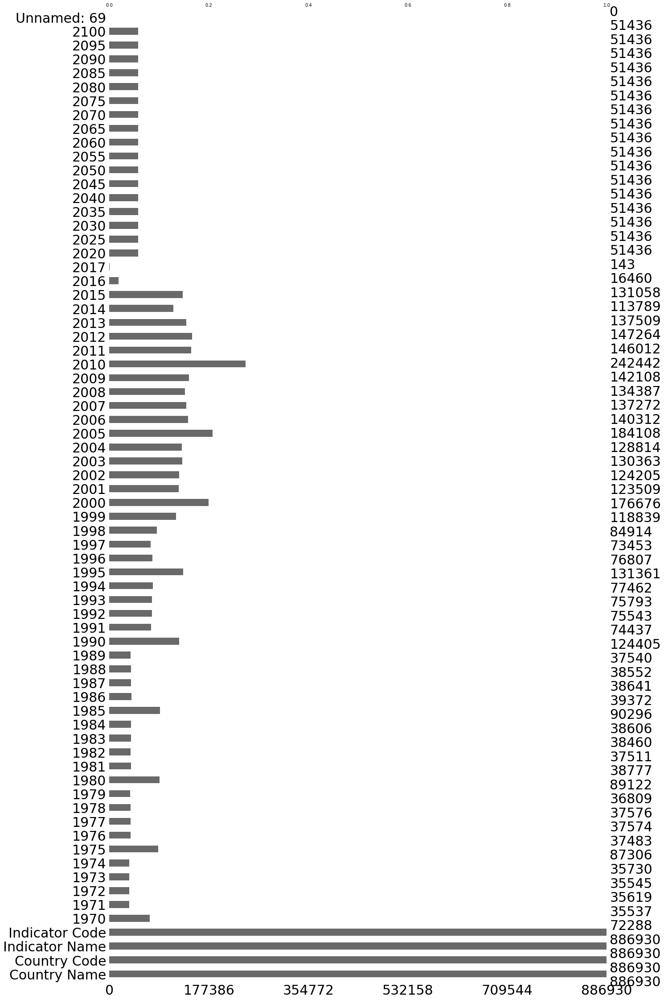

In [171]:
# Affichage graphique des infos du dataframe : visualisation des valeurs manquantes sur tout le df
#msno.bar(dft)
msno.bar(dft, figsize=(20,40), fontsize=30)
plt.savefig('msno_base', dpi=200, bbox_inches='tight') 

In [14]:
dft.describe(include="all")

,Country Name,Country Code,Indicator Name,Indicator Code,1970,1971,1972,1973,1974,1975,...,2060,2065,2070,2075,2080,2085,2090,2095,2100,Unnamed: 69
count,886930,886930,886930,886930,7.228800e+04,3.553700e+04,3.561900e+04,3.554500e+04,3.573000e+04,8.730600e+04,...,5.143600e+04,5.143600e+04,5.143600e+04,5.143600e+04,5.143600e+04,5.143600e+04,5.143600e+04,5.143600e+04,5.143600e+04,0.0
unique,242,242,3665,3665,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,Arab World,ARB,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,3665,3665,242,242,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,NaN,NaN,NaN,1.974772e+09,4.253638e+09,4.592365e+09,5.105006e+09,5.401493e+09,2.314288e+09,...,7.224868e+02,7.271290e+02,7.283779e+02,7.266484e+02,7.228327e+02,7.176899e+02,7.113072e+02,7.034274e+02,6.940296e+02,NaN
std,NaN,NaN,NaN,NaN,1.211687e+11,1.804814e+11,1.914083e+11,2.059170e+11,2.112150e+11,1.375059e+11,...,2.215845e+04,2.287990e+04,2.352338e+04,2.408149e+04,2.455897e+04,2.496587e+04,2.530183e+04,2.556069e+04,2.574189e+04,NaN
min,NaN,NaN,NaN,NaN,-1.435564e+00,-1.594625e+00,-3.056522e+00,-4.032582e+00,-4.213563e+00,-3.658569e+00,...,-1.630000e+00,-1.440000e+00,-1.260000e+00,-1.090000e+00,-9.200000e-01,-7.800000e-01,-6.500000e-01,-5.500000e-01,-4.500000e-01,NaN
25%,NaN,NaN,NaN,NaN,8.900000e-01,8.853210e+00,9.240920e+00,9.595200e+00,9.861595e+00,1.400000e+00,...,3.000000e-02,3.000000e-02,2.000000e-02,2.000000e-02,1.000000e-02,1.000000e-02,1.000000e-02,1.000000e-02,1.000000e-02,NaN
50%,NaN,NaN,NaN,NaN,6.317724e+00,6.316240e+01,6.655139e+01,6.969595e+01,7.087760e+01,9.677420e+00,...,2.300000e-01,2.300000e-01,2.300000e-01,2.300000e-01,2.300000e-01,2.300000e-01,2.300000e-01,2.300000e-01,2.200000e-01,NaN
75%,NaN,NaN,NaN,NaN,6.251250e+01,5.655200e+04,5.863650e+04,6.202900e+04,6.383675e+04,7.854163e+01,...,7.505000e+00,7.500000e+00,7.300000e+00,7.100000e+00,6.722500e+00,6.080000e+00,5.462500e+00,4.680000e+00,4.032500e+00,NaN


In [15]:
# Verifier s'il y a des doublons (% aux 2 colonnes Country Code et Indicator Code)
dft[dft.duplicated(['Country Code', 'Indicator Code'], keep=False)].shape[0]
print("pas de doublons dans le dataframe")

pas de doublons dans le dataframe


In [16]:
# drop la derniere colonne with unamed label with all nan values

# Drop columns that has all NaN values

dft.dropna(axis=1,how='all',inplace=True)    

print(dft.shape)
dft.head()




(886930, 69)


,Country Name,Country Code,Indicator Name,Indicator Code,1970,1971,1972,1973,1974,1975,...,2055,2060,2065,2070,2075,2080,2085,2090,2095,2100
0,Arab World,ARB,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Arab World,ARB,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2.F,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Arab World,ARB,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2.GPI,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Arab World,ARB,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2.M,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Arab World,ARB,"Adjusted net enrolment rate, primary, both sex...",SE.PRM.TENR,54.822121,54.894138,56.209438,57.267109,57.991138,59.36554,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## Filtrer les lignes (Country / Indicator) qui sont totalement vides taux de remplissage 0%(ou un taux de remplissage a definir plus tard)

In [17]:
# filtrer par ligne (valeurs manquantes)

# pourcentage de nan/ligne, _r pour row car on filtre les rows
nb_num_col=len(dft.columns)-4

dft_nan=((dft.isnull().sum(axis=1))/nb_num_col)*100
dft_r=dft.copy()   
dft_r['perc_nan_l']=dft_nan
dft_r.head()


#dft_c.describe()

# Combien de lignes sont 100% vides (529525!)

dft_r.loc[dft_r['perc_nan_l']==100]  

# Delete those rows



print("------------------------------------------------------------------------------------\n")
print(f"il y a {len(dft_r.loc[dft_r['perc_nan_l']==100])} lignes vides dans le fichier data a supprimer")

dft_r = dft_r[dft_r.perc_nan_l !=100]
print(f"Apres les avoir supprimees, il nous reste {len(dft_r)} lignes de {len(dft)} au depart\n") # j'attends de trouver 357 405 instead of 886930 at the begining ok
print("------------------------------------------------------------------------------------\n")

#dft_c.drop(dft_c.loc[dft_c['perc_nan_l']==100], axis=0)  # drop pb qd il y a nan values
#dfLeb.drop(dfLeb.iloc[:, 0:4], axis=1, inplace=True)

------------------------------------------------------------------------------------

il y a 529525 lignes vides dans le fichier data a supprimer
Apres les avoir supprimees, il nous reste 357405 lignes de 886930 au depart

------------------------------------------------------------------------------------



In [18]:
# methode plus simple

# selectionner colonnes numeric (les objets sont 100% remplis donc ca empeche de supprimer les lignes a taux de remplissage 0%)
dft_selec_num=dft.select_dtypes(include=['float64'])
dft_selec_num
dft_rnan_all = dft_selec_num[dft_selec_num.isnull().all(axis=1)]

#print(dft_rnan_all.index)
#print(dft.index)
#dft_rnan_all
#dft_resh_region=dft_resh_n[~dft_resh_n['Code'].isin(df_country['3char country code'])]

# drop index dft if inedx is in dft_rnan_all.index : dft_filtered_row

dft_f_r=dft[~dft.index.isin(dft_rnan_all.index)]
dft_f_r.shape




(357405, 69)

In [19]:
## Comparaison 2 dataframes: il sort les valeurs qui sont different donc s'il est empty c a d sont pareilles

print(dft_r.drop('perc_nan_l', axis=1).compare(dft_f_r))
dft_r.drop('perc_nan_l', axis=1, inplace=True)

Empty DataFrame
Columns: []
Index: []


In [20]:
#dft_r=dft_r.drop('perc_nan_l', axis=1)
dft_r.describe(include="all")

,Country Name,Country Code,Indicator Name,Indicator Code,1970,1971,1972,1973,1974,1975,...,2055,2060,2065,2070,2075,2080,2085,2090,2095,2100
count,357405,357405,357405,357405,7.228800e+04,3.553700e+04,3.561900e+04,3.554500e+04,3.573000e+04,8.730600e+04,...,5.143600e+04,5.143600e+04,5.143600e+04,5.143600e+04,5.143600e+04,5.143600e+04,5.143600e+04,5.143600e+04,5.143600e+04,5.143600e+04
unique,242,242,3665,3665,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,Colombia,COL,Population growth (annual %),SP.POP.GROW,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,2462,2462,240,240,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,NaN,NaN,NaN,1.974772e+09,4.253638e+09,4.592365e+09,5.105006e+09,5.401493e+09,2.314288e+09,...,7.145788e+02,7.224868e+02,7.271290e+02,7.283779e+02,7.266484e+02,7.228327e+02,7.176899e+02,7.113072e+02,7.034274e+02,6.940296e+02
std,NaN,NaN,NaN,NaN,1.211687e+11,1.804814e+11,1.914083e+11,2.059170e+11,2.112150e+11,1.375059e+11,...,2.136851e+04,2.215845e+04,2.287990e+04,2.352338e+04,2.408149e+04,2.455897e+04,2.496587e+04,2.530183e+04,2.556069e+04,2.574189e+04
min,NaN,NaN,NaN,NaN,-1.435564e+00,-1.594625e+00,-3.056522e+00,-4.032582e+00,-4.213563e+00,-3.658569e+00,...,-1.830000e+00,-1.630000e+00,-1.440000e+00,-1.260000e+00,-1.090000e+00,-9.200000e-01,-7.800000e-01,-6.500000e-01,-5.500000e-01,-4.500000e-01
25%,NaN,NaN,NaN,NaN,8.900000e-01,8.853210e+00,9.240920e+00,9.595200e+00,9.861595e+00,1.400000e+00,...,3.000000e-02,3.000000e-02,3.000000e-02,2.000000e-02,2.000000e-02,1.000000e-02,1.000000e-02,1.000000e-02,1.000000e-02,1.000000e-02
50%,NaN,NaN,NaN,NaN,6.317724e+00,6.316240e+01,6.655139e+01,6.969595e+01,7.087760e+01,9.677420e+00,...,2.300000e-01,2.300000e-01,2.300000e-01,2.300000e-01,2.300000e-01,2.300000e-01,2.300000e-01,2.300000e-01,2.300000e-01,2.200000e-01
75%,NaN,NaN,NaN,NaN,6.251250e+01,5.655200e+04,5.863650e+04,6.202900e+04,6.383675e+04,7.854163e+01,...,7.500000e+00,7.505000e+00,7.500000e+00,7.300000e+00,7.100000e+00,6.722500e+00,6.080000e+00,5.462500e+00,4.680000e+00,4.032500e+00


-----------------------------------------------------------------------------------------------------------

##### --- Apres suppression des 529525 lignes vides, le nombre de pays/regions reste 242 et des indicateurs 3665 

-----------------------------------------------------------------------------------------------------------

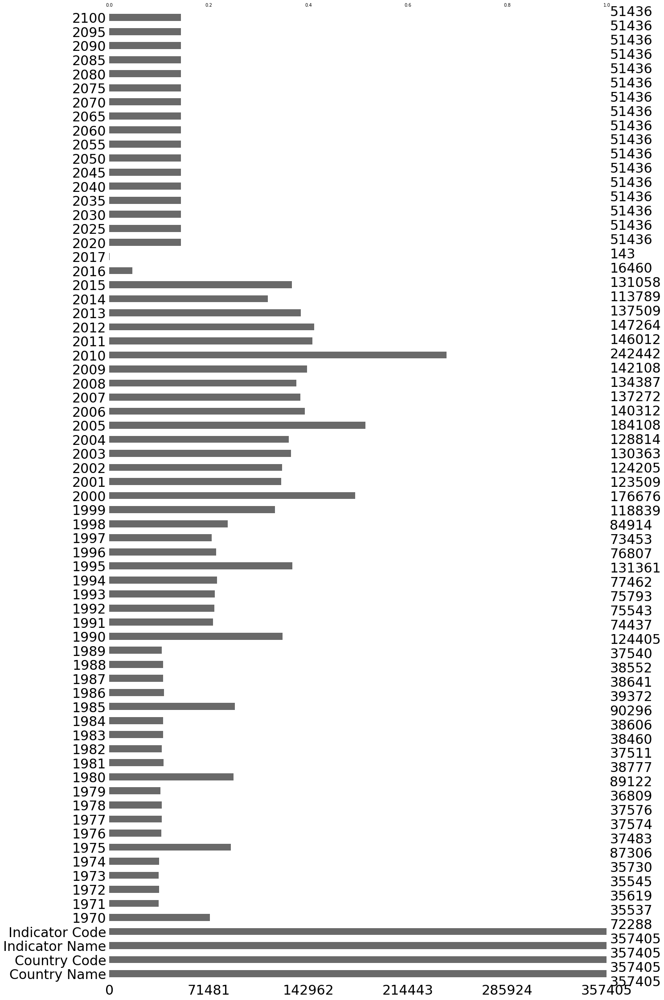

In [172]:
msno.bar(dft_r,  figsize=(20,40), fontsize=30)
plt.savefig('msno_f_nan_all_0', dpi=200, bbox_inches='tight') 

# Selection des indicateurs

## A- filtrage par taux de remplissage des indicateurs 

In [22]:
# tous les colonnes numerics 

col_num = dft_r.select_dtypes(include=['float64']).columns

# count indicateur pour tous les pays par annee

df_ind_count= dft_r.groupby('Indicator Code')[col_num].count()
df_ind_count

# somme sur toutes les annees:
df_ind_count['SUM']= df_ind_count[col_num].sum(axis=1)

# pourcentage de taux de remplissage/pays sur toutes les annees:
df_ind_count['fill_Perc_ind']=df_ind_count['SUM']*100/(len(col_num)*242)    # 242 pays

df_ind_fill=df_ind_count.sort_values(by='fill_Perc_ind', ascending=False).reset_index()
df_ind_fill_25=df_ind_fill[df_ind_fill['fill_Perc_ind']>14]
print(df_ind_fill_25.shape)

#print("------------------------------------\n")
df_ind_fill[['fill_Perc_ind']].describe().T


# 25% des ind sont rempli > 14%

#df_ind_fill.index

#df_ind_fill



(924, 68)


,count,mean,std,min,25%,50%,75%,max
fill_Perc_ind,3665.0,8.815544,12.493114,0.006357,0.184361,2.027972,14.291163,70.915448


-------------------------------------------------------------------------------------------------------------------------------

#### Seulement 25% des indicateurs ont un taux de remplissage > 14%. On fixe le seuil de taux de remplissage a garder a 14%. Ce qui nous donne 924 indicateurs du total 3665

-------------------------------------------------------------------------------------------------------------------------------

### B- Filtrer les indicateurs par topic dans df_Series qui contient les informations sur indicateurs

On cherche Les topics qui peuvent etre interessants pour la cible de la platforme d'enseignement en ligne pour des lyceens et des universitaires : 

- Population qui a l'age des lyceens et des universitaires (Topic : population)
- Le nombre d'etudiants inscrits aux lycees et aux universites: topic Enrollement (inscriptions), Secondary (up secondary seulement car dans secondary il y a low secondary qui correspond au college), Tertiary (Universitaire). Post secondaire inclus tertiary et vocational qui correspond au Lycee professionnelle et autres instituts donc ca nous interesse pas)
- Acces a l'electricite, a l'internet , ordinateurs (Topic : Infrastruture, Energy, Communications)
- Un pouvoir d'achat eleve (topic economic)


In [23]:
# reduire df_Series aux indicateurs precedemment selectionnes dans l'etape de filtrage A

df_ind= df_Series[df_Series['Series Code'].isin(df_ind_fill_25['Indicator Code'])]
print(df_ind.shape)
print(df_ind_fill_25.shape)
print(f"Attention, il y a {len(df_ind_fill_25)-len(df_ind)} indicateurs qui ne sont pas dans le fichier de description!")

(907, 21)
(924, 68)
Attention, il y a 17 indicateurs qui ne sont pas dans le fichier de description!


In [24]:
# creer une liste des indicateurs par topic 


df_ind.groupby('Topic')['Series Code'].apply(list)
print(len(df_ind['Topic'].unique()))
print(len(df_ind))


21
907


Il ya 21 topic avec 907 indicateurs:
Selectionner manuellement les indicateurs pertinents dans les topics :Population, Secondary, Tertiary, Infrastructure: communications, Economic Policy & Debt: Purchasing power parity . 

In [25]:
# grouper les indicateurs (Indicateurs code et longues definitions) par topic

group_topic_code=df_ind.groupby('Topic')['Series Code'].apply(list)

group_topic=df_ind.groupby('Topic')['Long definition'].apply(list)


In [26]:
# Topic population


pop=pd.DataFrame(group_topic_code['Population'])
pop_def=pd.DataFrame(group_topic['Population'])
group_topic_pop=pd.concat([pop,pop_def], axis=1)
pd.set_option('max_rows', None)
pd.set_option('max_colwidth', None)
group_topic_pop


### get indexes

,0,0
0,SP.POP.0305.FE.UN,"Population, ages 3-5, female is the total number of females age 3-5."
1,SP.POP.0305.MA.UN,"Population, ages 3-5, male is the total number of males age 3-5."
2,SP.POP.0305.TO.UN,"Population, ages 3-5, total is the total population age 3-5."
3,SP.POP.0406.FE.UN,"Population, ages 4-6, female is the total number of females age 4-6."
4,SP.POP.0406.MA.UN,"Population, ages 4-6, male is the total number of males age 4-6."
5,SP.POP.0406.TO.UN,"Population, ages 4-6, total is the total population age 4-6."
6,SP.POP.0509.FE.UN,"Population, ages 5-9, female is the total number of females age 5-9."
7,SP.POP.0509.MA.UN,"Population, ages 5-9, male is the total number of males age 5-9."
8,SP.POP.0509.TO.UN,"Population, ages 5-9, total is the total population age 5-9."
9,SP.POP.0510.FE.UN,"Population, ages 5-10, female is the total number of females age 5-10."


3 Indicateurs retenus du topic population (2 indicateurs et un 3eme pour normalisation):
- SP.SEC.UTOT.IN, 'Population of the age-group theoretically corresponding to upper secondary education as indicated by theoretical entrance age and duration' 
- SP.TER.TOTL.IN 'Population of the age-group theoretically corresponding to tertiary education as indicated by theoretical entrance age and duration'.
- SP.POP.TOTL : Total population pour la normalisation
- A savoir: La population de l'age 15-24 'SP.POP.1524.TO.UN' peut remplacer les 2 indicaterus retenus si haut mais ca peut etre moins pertinent pour l'analyse vue que ca ne tient pas en compte l'age et la duree de l'education qui peut etre differents d'un pays a l'autre.

In [27]:
# Topic Secondary

#group_topic.get(key = 'Secondary')

sec=pd.DataFrame(group_topic_code['Secondary'])
sec_def=pd.DataFrame(group_topic['Secondary'])
group_topic_sec=pd.concat([sec,sec_def], axis=1)
pd.set_option('max_rows', None)
pd.set_option('max_colwidth', None)
group_topic_sec

,0,0
0,SE.ENR.PRSC.FM.ZS,"Ratio of female gross enrolment ratio for primary and secondary to male gross enrolment ratio for primary and secondary. It is calculated by dividing the female value for the indicator by the male value for the indicator. A GPI equal to 1 indicates parity between females and males. In general, a value less than 1 indicates disparity in favor of males and a value greater than 1 indicates disparity in favor of females."
1,SE.ENR.SECO.FM.ZS,"Ratio of female gross enrolment ratio for secondary to male gross enrolment ratio for secondary. It is calculated by dividing the female value for the indicator by the male value for the indicator. A GPI equal to 1 indicates parity between females and males. In general, a value less than 1 indicates disparity in favor of males and a value greater than 1 indicates disparity in favor of females."
2,SE.SEC.AGES,"Age at which students would enter lower secondary education, assuming they had started at the official entrance age for the lowest level of education, had studied full-time throughout and had progressed through the system without repeating or skipping a grade."
3,SE.SEC.CMPT.LO.FE.ZS,"Total number of new female entrants in the last grade of lower secondary education, regardless of age, expressed as percentage of the total female population of the theoretical entrance age to the last grade of lower secondary. This indicator is also known as ""Gross intake rate to the last grade of lower secondary general education."" The ratio can exceed 100 percent due to over-aged and under-aged children who enter lower secondary school late/early and/or repeat grades. Data limitations preclude adjusting for students who drop out during the final year of lower secondary education. Thus this rate is a proxy that should be taken as an upper estimate of the actual lower secondary completion rate."
4,SE.SEC.CMPT.LO.MA.ZS,"Total number of new male entrants in the last grade of lower secondary education, regardless of age, expressed as percentage of the total male population of the theoretical entrance age to the last grade of lower secondary. This indicator is also known as ""Gross intake rate to the last grade of lower secondary general education."" The ratio can exceed 100 percent due to over-aged and under-aged children who enter lower secondary school late/early and/or repeat grades. Data limitations preclude adjusting for students who drop out during the final year of lower secondary education. Thus this rate is a proxy that should be taken as an upper estimate of the actual lower secondary completion rate."
5,SE.SEC.CMPT.LO.ZS,"Total number of new entrants in the last grade of lower secondary education, regardless of age, expressed as percentage of the total population of the theoretical entrance age to the last grade of lower secondary. This indicator is also known as ""Gross intake rate to the last grade of lower secondary general education."" The ratio can exceed 100 percent due to over-aged and under-aged children who enter lower secondary school late/early and/or repeat grades. Data limitations preclude adjusting for students who drop out during the final year of lower secondary education. Thus this rate is a proxy that should be taken as an upper estimate of the actual lower secondary completion rate."
6,SE.SEC.DURS,Number of grades (years) in secondary education (ISCED 2 and 3).
7,SE.SEC.DURS.UP,Number of grades (years) in upper secondary education.
8,SE.SEC.ENRL,Total number of students enrolled at public and private secondary education institutions regardless of age.
9,SE.SEC.ENRL.FE,Total number of female students enrolled at public and private secondary education institutions regardless of age.


Un indicateur retenu du topic Secondary :

- UIS.E.3 'Total number of students enrolled in public and private upper secondary education institutions regardless of age.'

- A savoir: SE.SEC.ENRR = % total secondary c-a-d low secondary qui correspond au college et up secondary qui correspond au niveau lycee. On en retient que celui correspond au niveau lycee
           vocational programmes correspond au Lycee professionnelle/technique, on ne le prend pas en consideration


In [28]:
# Topic Tertiary
univ=pd.DataFrame(group_topic_code['Tertiary'])
univ_def=pd.DataFrame(group_topic['Tertiary'])
group_topic_univ=pd.concat([univ,univ_def], axis=1)
pd.set_option('max_rows', None)
pd.set_option('max_colwidth', None)
group_topic_univ

,0,0
0,SE.ENR.TERT.FM.ZS,"Ratio of female gross enrolment ratio for tertiary to male gross enrolment ratio for tertiary. It is calculated by dividing the female value for the indicator by the male value for the indicator. A GPI equal to 1 indicates parity between females and males. In general, a value less than 1 indicates disparity in favor of males and a value greater than 1 indicates disparity in favor of females."
1,SE.SCH.LIFE,"Number of years a person of school entrance age can expect to spend within the specified level of education. For a child of a certain age a, the school life expectancy is calculated as the sum of the age specific enrolment rates for the levels of education specified. The part of the enrolment that is not distributed by age is divided by the school-age population for the level of education they are enrolled in, and multiplied by the duration of that level of education. The result is then added to the sum of the age-specific enrolment rates. A relatively high SLE indicates greater probability for children to spend more years in education and higher overall retention within the education system. It must be noted that the expected number of years does not necessarily coincide with the expected number of grades of education completed, because of repetition. Since school life expectancy is an average based on participation in different levels of education, the expected number of years of schooling may be pulled down by the magnitude of children who never go to school. Those children who are in school may benefit from many more years of education than the average."
2,SE.SCH.LIFE.FE,"Number of years a person of school entrance age can expect to spend within the specified level of education. For a child of a certain age a, the school life expectancy is calculated as the sum of the age specific enrolment rates for the levels of education specified. The part of the enrolment that is not distributed by age is divided by the school-age population for the level of education they are enrolled in, and multiplied by the duration of that level of education. The result is then added to the sum of the age-specific enrolment rates. A relatively high SLE indicates greater probability for children to spend more years in education and higher overall retention within the education system. It must be noted that the expected number of years does not necessarily coincide with the expected number of grades of education completed, because of repetition. Since school life expectancy is an average based on participation in different levels of education, the expected number of years of schooling may be pulled down by the magnitude of children who never go to school. Those children who are in school may benefit from many more years of education than the average."
3,SE.SCH.LIFE.MA,"Number of years a person of school entrance age can expect to spend within the specified level of education. For a child of a certain age a, the school life expectancy is calculated as the sum of the age specific enrolment rates for the levels of education specified. The part of the enrolment that is not distributed by age is divided by the school-age population for the level of education they are enrolled in, and multiplied by the duration of that level of education. The result is then added to the sum of the age-specific enrolment rates. A relatively high SLE indicates greater probability for children to spend more years in education and higher overall retention within the education system. It must be noted that the expected number of years does not necessarily coincide with the expected number of grades of education completed, because of repetition. Since school life expectancy is an average based on participation in different levels of education, the expected number of years of schooling may be pulled down by the magnitude of children who never go to school. Those children who are in school may benefit from many more years of education than the averag

Un seul indicateur est retenu du topic Tertiary :

'SE.TER.ENRL' The total number of students enrolled at public and private tertiary education institutions

- A savoir les indicateurs qui decrivent Post secondary inclus tertiary & vocational qui correspond au Lycee professionnelle et autres instituts donc on ne les retient pas

In [29]:
# Topic Infrastructure: Communications

com=pd.DataFrame(group_topic_code['Infrastructure: Communications'])
com_def=pd.DataFrame(group_topic['Infrastructure: Communications'])
group_topic_com=pd.concat([com,com_def], axis=1)
pd.set_option('max_rows', None)
pd.set_option('max_colwidth', None)
group_topic_com

,0,0
0,IT.CMP.PCMP.P2,Personal computers are self-contained computers designed to be used by a single individual.
1,IT.NET.USER.P2,"Internet users are individuals who have used the Internet (from any location) in the last 3 months. The Internet can be used via a computer, mobile phone, personal digital assistant, games machine, digital TV etc."


Les 2 indicateurs de la communications ont ete retenu:

- IT.CMP.PCMP.P2 personal computers /100 people 
- IT.NET.USER.P2 Internet users/100 people  are individuals who have used the Internet (from any location) in the last 3 months. The Internet can be used via a computer, mobile phone, personal digital assistant, games machine, digital TV etc


In [30]:
# Topic Economic Policy & Debt: Purchasing power parity
eco=pd.DataFrame(group_topic_code['Economic Policy & Debt: Purchasing power parity'])
eco_def=pd.DataFrame(group_topic['Economic Policy & Debt: Purchasing power parity'])
group_topic_eco=pd.concat([eco,eco_def], axis=1)
pd.set_option('max_rows', None)
pd.set_option('max_colwidth', None)
group_topic_eco

,0,0
0,NY.GDP.MKTP.PP.CD,PPP GDP is gross domestic product converted to international dollars using purchasing power parity rates. An international dollar has the same purchasing power over GDP as the U.S. dollar has in the United States. GDP is the sum of gross value added by all resident producers in the economy plus any product taxes and minus any subsidies not included in the value of the products. It is calculated without making deductions for depreciation of fabricated assets or for depletion and degradation of natural resources. Data are in current international dollars. For most economies PPP figures are extrapolated from the 2011 International Comparison Program (ICP) benchmark estimates or imputed using a statistical model based on the 2011 ICP. For 47 high- and upper middle-income economies conversion factors are provided by Eurostat and the Organisation for Economic Co-operation and Development (OECD).
1,NY.GDP.MKTP.PP.KD,PPP GDP is gross domestic product converted to international dollars using purchasing power parity rates. An international dollar has the same purchasing power over GDP as the U.S. dollar has in the United States. GDP is the sum of gross value added by all resident producers in the economy plus any product taxes and minus any subsidies not included in the value of the products. It is calculated without making deductions for depreciation of fabricated assets or for depletion and degradation of natural resources. Data are in constant 2011 international dollars.
2,NY.GDP.PCAP.PP.CD,GDP per capita based on purchasing power parity (PPP). PPP GDP is gross domestic product converted to international dollars using purchasing power parity rates. An international dollar has the same purchasing power over GDP as the U.S. dollar has in the United States. GDP at purchaser's prices is the sum of gross value added by all resident producers in the economy plus any product taxes and minus any subsidies not included in the value of the products. It is calculated without making deductions for depreciation of fabricated assets or for depletion and degradation of natural resources. Data are in current international dollars based on the 2011 ICP round.
3,NY.GDP.PCAP.PP.KD,GDP per capita based on purchasing power parity (PPP). PPP GDP is gross domestic product converted to international dollars using purchasing power parity rates. An international dollar has the same purchasing power over GDP as the U.S. dollar has in the United States. GDP at purchaser's prices is the sum of gross value added by all resident producers in the economy plus any product taxes and minus any subsidies not included in the value of the products. It is calculated without making deductions for depreciation of fabricated assets or for depletion and degradation of natural resources. Data are in constant 2011 international dollars.
4,NY.GNP.MKTP.PP.CD,PPP GNI (formerly PPP GNP) is gross national income (GNI) converted to international dollars using purchasing power parity rates. An international dollar has the same purchasing power over GNI as a U.S. dollar has in the United States. Gross national income is the sum of value added by all resident producers plus any product taxes (less subsidies) not included in the valuation of output plus net receipts of primary income (compensation of employees and property income) from abroad. Data are in current international dollars. For most economies PPP figures are extrapolated from the 2011 International Comparison Program (ICP) benchmark estimates or imputed using a statistical model based on the 2011 ICP. For 47 high- and upper middle-income economies conversion factors are provided by Eurostat and the Organisation for Economic Co-operation and Development (OECD).
5,NY.GNP.PCAP.PP.CD,GNI per capita based on purchasing power parity (PPP). PPP GNI is gross national income (GNI) converted to international dollars using purchasing power parity rates. An international dollar has the same purchasing power over 

Indicateur retenu du topic Economic Policy & Debt: Purchasing power parity:
NY.GDP.PCAP.PP.CD PIB par habitant, PPA ($ international actuel).

#### Bilan de selection des indicateurs :

- 7 Indicateurs ont ete selectionne + 8eme pour la normalisation

- Pour une etude plus etendue, nous pouvons aussi selectionner d'autres indicateurs dans d'autres topics. Avec une apercue de tous les indicateurs, on peut selestionner d'autres pour une etude plus etendue. les indicateurs du topic teacher (salaires et le nombre des etudiants/enseignant peut nous informer sur l'importance d'introduction d'une plateforme d'enseignement en ligne si manque d'enseignant ou salaire tres faible). Plusieurs indicateurs du topic attainment (taux de population qui a acheve ses etudes secondaires/universitaires) peuvent nous renseignement sur taux d'education dans ces pays 


In [31]:
# liste des indicateurs selectionnes 

list_ind_code=['IT.NET.USER.P2','IT.CMP.PCMP.P2','SP.SEC.UTOT.IN','SP.TER.TOTL.IN', 'UIS.E.3', 'NY.GDP.PCAP.PP.CD','SE.TER.ENRL', 'SP.POP.TOTL']
  

## Filtrage du dataframe avec les indicateurs selectionnes 

In [32]:
dft_r_ind = dft_r[dft_r['Indicator Code'].isin(list_ind_code)]      

print("------------------------------------------------------------------------------------------------")
print(f"Avec les indicateurs pertinents selectionnes, il reste {len(dft_r_ind)} " )
print("------------------------------------------------------------------------------------------------")
dft_r_ind.describe(include="all")

------------------------------------------------------------------------------------------------
Avec les indicateurs pertinents selectionnes, il reste 1814 
------------------------------------------------------------------------------------------------


,Country Name,Country Code,Indicator Name,Indicator Code,1970,1971,1972,1973,1974,1975,...,2055,2060,2065,2070,2075,2080,2085,2090,2095,2100
count,1814,1814,1814,1814,7.350000e+02,8.080000e+02,7.980000e+02,7.990000e+02,7.950000e+02,8.060000e+02,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
unique,242,242,8,8,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,Arab World,ARB,"Population, total",SP.POP.TOTL,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,8,8,240,240,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,NaN,NaN,NaN,3.856275e+07,3.589598e+07,3.711931e+07,3.783318e+07,3.877543e+07,3.898237e+07,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,NaN,NaN,NaN,NaN,2.306991e+08,2.252577e+08,2.315432e+08,2.362595e+08,2.416904e+08,2.447603e+08,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,NaN,NaN,NaN,NaN,0.000000e+00,0.000000e+00,0.000000e+00,1.480000e+02,1.100000e+02,0.000000e+00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25%,NaN,NaN,NaN,NaN,9.381150e+04,5.977575e+04,6.879150e+04,7.171800e+04,7.658700e+04,7.513350e+04,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50%,NaN,NaN,NaN,NaN,5.142040e+05,4.065965e+05,4.379975e+05,4.561640e+05,4.867440e+05,4.945600e+05,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75%,NaN,NaN,NaN,NaN,4.776018e+06,4.085352e+06,4.264936e+06,4.287323e+06,4.509724e+06,4.387527e+06,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [33]:
dft_r_ind.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1814 entries, 1204 to 885798
Data columns (total 69 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Country Name    1814 non-null   object 
 1   Country Code    1814 non-null   object 
 2   Indicator Name  1814 non-null   object 
 3   Indicator Code  1814 non-null   object 
 4   1970            735 non-null    float64
 5   1971            808 non-null    float64
 6   1972            798 non-null    float64
 7   1973            799 non-null    float64
 8   1974            795 non-null    float64
 9   1975            806 non-null    float64
 10  1976            805 non-null    float64
 11  1977            806 non-null    float64
 12  1978            807 non-null    float64
 13  1979            815 non-null    float64
 14  1980            815 non-null    float64
 15  1981            836 non-null    float64
 16  1982            821 non-null    float64
 17  1983            818 non-null

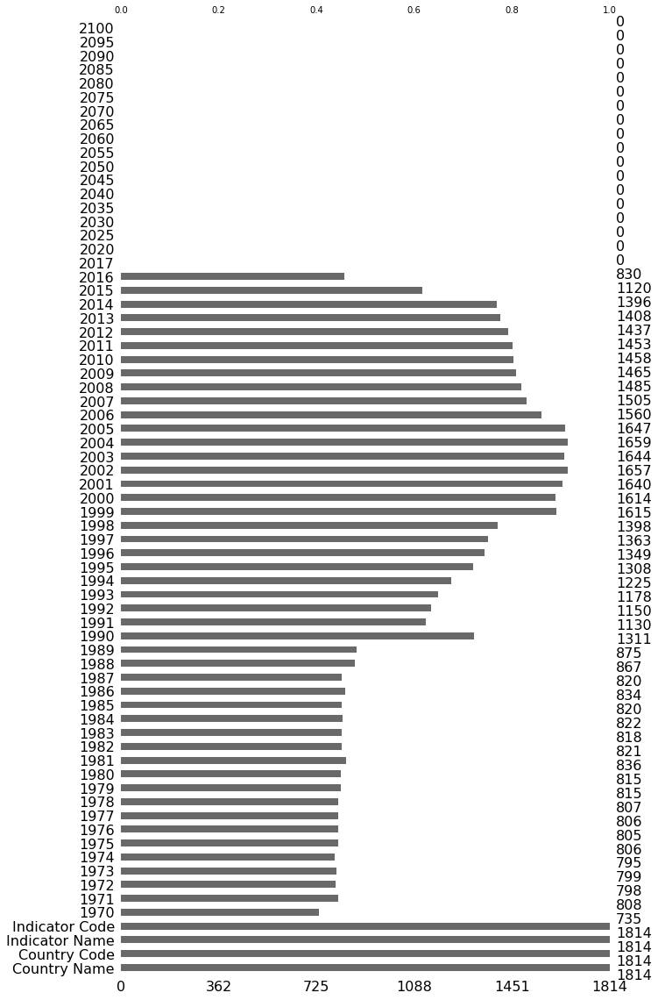

In [34]:
msno.bar(dft_r_ind, figsize=(10,20))
plt.savefig('msno_ind_select', dpi=200, bbox_inches='tight') 

-------------------------------------------------------------------------------------------------------------------------------

##### ------- Aucune valeur pour les annees 2017 ni dans la plage des annees prospectives de 2020 jusqu'au 2100
##### ------ La partie la plus renseignee est 1999-2015
##### ------ % fill rate (2015)=60%      %fill rate (2016)=45%

-------------------------------------------------------------------------------------------------------------------------------



## Reduire la dataframe pour la partie la plus renseignee a savoir de 1999 - 2015

In [210]:
#  Selectionner 

cols=['Country Name','Country Code','Indicator Name', 'Indicator Code'] 
dft_name=dft_r_ind .loc[:, cols]

dft_years=dft_r_ind .loc[:,'1999':'2016'] 

dft_r_red=pd.concat([dft_name,dft_years],axis=1)

#dft_r_red.reset_index(drop=True,inplace=True)

dft_r_red.head()

,Country Name,Country Code,Indicator Name,Indicator Code,1999,2000,2001,2002,2003,2004,...,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016
1204,Arab World,ARB,"Enrolment in tertiary education, all programmes, both sexes (number)",SE.TER.ENRL,4.875952e+06,5.089854e+06,5.400639e+06,5.798696e+06,5.955514e+06,6.465715e+06,...,7.588664e+06,8.006892e+06,8.382284e+06,8.715273e+06,8.594488e+06,9.147083e+06,9.688632e+06,9966484.0,NaN,NaN
1214,Arab World,ARB,"Enrolment in upper secondary education, both sexes (number)",UIS.E.3,8.190412e+06,8.554936e+06,9.096402e+06,9.393456e+06,1.018652e+07,1.074748e+07,...,1.037482e+07,1.030286e+07,1.017877e+07,1.064478e+07,1.162018e+07,1.202761e+07,1.202161e+07,11995984.0,NaN,NaN
1247,Arab World,ARB,"GDP per capita, PPP (current international $)",NY.GDP.PCAP.PP.CD,8.654207e+03,9.090647e+03,9.327194e+03,9.393421e+03,9.698660e+03,1.066980e+04,...,1.300436e+04,1.373891e+04,1.385056e+04,1.444467e+04,1.482591e+04,1.571614e+04,1.605255e+04,NaN,NaN,NaN
1375,Arab World,ARB,Internet users (per 100 people),IT.NET.USER.P2,5.985821e-01,1.139541e+00,1.561288e+00,2.693061e+00,3.645881e+00,7.006812e+00,...,1.420590e+01,1.859353e+01,2.297369e+01,2.674725e+01,2.970776e+01,3.401422e+01,3.686860e+01,NaN,NaN,NaN
2084,Arab World,ARB,Personal computers (per 100 people),IT.CMP.PCMP.P2,1.707795e+00,1.887733e+00,2.414015e+00,2.517600e+00,3.401317e+00,3.979838e+00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### Filtrage des lignes 100% vides

In [211]:
# chercher s'il y a des lignes vides

# selectionner colonnes numeric (les objets sont 100% remplis donc ca empeche de supprimer les lignes a taux de remplissage 0%)
dft_selec_num=dft_r_red.select_dtypes(include=['float64'])
dft_selec_num
dft_rnan_all = dft_selec_num[dft_selec_num.isnull().all(axis=1)]
dft_rnan_all

#print(dft_rnan_all.index)
#print(dft.index)
#dft_rnan_all
#dft_resh_region=dft_resh_n[~dft_resh_n['Code'].isin(df_country['3char country code'])]

# drop index dft if inedx is in dft_rnan_all.index : dft_filtered_row  fr

dft_red_fr=dft_r_red[~dft_r_red.index.isin(dft_rnan_all.index)]
dft_red_fr.shape

print("\n-----------------------------------------------------------------------------------------------------------------------\n")
print(f"Nombres de lignes restantes est {len(dft_red_fr)} de {len(dft_r_red)}")
print("\n-----------------------------------------------------------------------------------------------------------------------")


-----------------------------------------------------------------------------------------------------------------------

Nombres de lignes restantes est 1795 de 1814

-----------------------------------------------------------------------------------------------------------------------


### Filtrer les regions du dataframe pour classer les pays seulement (a partir du df_Country_Series)

In [37]:
# Recherche des codes pays des regroupements de pays

df_regions = dft_red_fr[~dft_red_fr['Country Code'].isin(df_Country_Series['CountryCode'])][['Country Name', 'Country Code']]

df_regions.drop_duplicates(inplace=True)
df_regions
regions_to_delet = df_regions['Country Name'].to_list()
print(regions_to_delet)
print("\n-----------------------------------------------------------------------------------------------------------------------")
print("Il y a 5 pays dans la liste des regions avec une tres faible population <25000 a supprimer (sauf pour le South Sudan avec 12millions a laisser)")
print("--------------------------------------------------------------------------------------------------------------------------")

regions_to_delet.remove('South Sudan')


dft_red_country=dft_red_fr[~dft_red_fr['Country Name'].isin(regions_to_delet)]
#df_leb= dft_red_country[dft_red_country['Country Name']=='Lebanon']
dft_red_country

['Arab World', 'East Asia & Pacific', 'East Asia & Pacific (excluding high income)', 'Euro area', 'Europe & Central Asia', 'Europe & Central Asia (excluding high income)', 'European Union', 'Heavily indebted poor countries (HIPC)', 'High income', 'Latin America & Caribbean', 'Latin America & Caribbean (excluding high income)', 'Least developed countries: UN classification', 'Low & middle income', 'Low income', 'Lower middle income', 'Middle East & North Africa', 'Middle East & North Africa (excluding high income)', 'Middle income', 'North America', 'OECD members', 'South Asia', 'Sub-Saharan Africa', 'Sub-Saharan Africa (excluding high income)', 'Upper middle income', 'World', 'British Virgin Islands', 'Curacao', 'Nauru', 'Sint Maarten (Dutch part)', 'South Sudan', 'St. Martin (French part)']

-----------------------------------------------------------------------------------------------------------------------
Il y a 5 pays dans la liste des regions avec une tres faible population <250

,Country Name,Country Code,Indicator Name,Indicator Code,1999,2000,2001,2002,2003,2004,...,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015
92829,Afghanistan,AFG,"Enrolment in tertiary education, all programmes, both sexes (number)",SE.TER.ENRL,NaN,NaN,NaN,NaN,2.621100e+04,2.764800e+04,...,NaN,NaN,NaN,9.518500e+04,NaN,9.750400e+04,NaN,NaN,2.628740e+05,NaN
92839,Afghanistan,AFG,"Enrolment in upper secondary education, both sexes (number)",UIS.E.3,NaN,NaN,1.599520e+05,NaN,1.155830e+05,1.733560e+05,...,2.711440e+05,2.852900e+05,3.611930e+05,4.430020e+05,5.673440e+05,7.434050e+05,8.814150e+05,9.692670e+05,9.687690e+05,NaN
92872,Afghanistan,AFG,"GDP per capita, PPP (current international $)",NY.GDP.PCAP.PP.CD,NaN,NaN,NaN,8.755176e+02,9.228294e+02,9.163345e+02,...,1.065620e+03,1.210479e+03,1.247066e+03,1.482099e+03,1.581601e+03,1.660740e+03,1.873154e+03,1.877412e+03,1.875447e+03,1.864974e+03
93000,Afghanistan,AFG,Internet users (per 100 people),IT.NET.USER.P2,NaN,NaN,4.722568e-03,4.561395e-03,8.789125e-02,1.058090e-01,...,2.107124e+00,1.900000e+00,1.840000e+00,3.550000e+00,4.000000e+00,5.000000e+00,5.454545e+00,5.900000e+00,7.000000e+00,8.260000e+00
93709,Afghanistan,AFG,Personal computers (per 100 people),IT.CMP.PCMP.P2,NaN,NaN,NaN,NaN,NaN,NaN,...,3.901483e-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
93951,Afghanistan,AFG,"Population of the official age for tertiary education, both sexes (number)",SP.TER.TOTL.IN,1.702356e+06,1.760125e+06,1.854199e+06,1.965626e+06,2.085468e+06,2.201216e+06,...,2.348976e+06,2.378682e+06,2.404018e+06,2.438519e+06,2.490352e+06,2.595965e+06,2.724642e+06,2.873526e+06,3.034517e+06,3.199607e+06
93957,Afghanistan,AFG,"Population of the official age for upper secondary education, both sexes (number)",SP.SEC.UTOT.IN,1.203174e+06,1.245988e+06,1.309228e+06,1.378528e+06,1.449172e+06,1.514752e+06,...,1.597963e+06,1.625093e+06,1.656586e+06,1.700525e+06,1.765556e+06,1.864912e+06,1.977811e+06,2.095149e+06,2.206482e+06,2.305137e+06
94158,Afghanistan,AFG,"Population, total",SP.POP.TOTL,1.940368e+07,2.009376e+07,2.096646e+07,2.197992e+07,2.306485e+07,2.411898e+07,...,2.589345e+07,2.661679e+07,2.729403e+07,2.800433e+07,2.880317e+07,2.970860e+07,3.069696e+07,3.173169e+07,3.275802e+07,3.373649e+07
96494,Albania,ALB,"Enrolment in tertiary education, all programmes, both sexes (number)",SE.TER.ENRL,3.850200e+04,4.012500e+04,4.085900e+04,4.216000e+04,4.360000e+04,5.301400e+04,...,7.474700e+04,8.686300e+04,9.060600e+04,9.313900e+04,1.223260e+05,1.348770e+05,1.608390e+05,1.730290e+05,1.738190e+05,1.605270e+05
96504,Albania,ALB,"Enrolment in upper secondary education, both sexes (number)",UIS.E.3,1.021610e+05,1.049460e+05,1.109960e+05,1.225550e+05,1.329320e+05,1.424490e+05,...,1.645720e+05,1.732690e+05,1.775720e+05,1.328030e+05,1.406570e+05,1.501340e+05,1.521820e+05,1.544250e+05,1.519370e+05,NaN


------------------------------------------------------------------------------------------------------------------------------

##### Pour les statistiques sur les regions, ajouter des variables Région et Groupe de revenus au dataset Data a partir du dataset EdStatsCountry 

-------------------------------------------------------------------------------------------------------------------------------

In [38]:
#df_countries
countries_income = pd.DataFrame({'Country_Code': df_countries['Country Code'].unique(),
                                 'Region': df_countries['Region'],
                                 'Income Group': df_countries['Income Group']})


dft_red_country_income = pd.merge(dft_red_country, countries_income, left_on='Country Code', right_on='Country_Code', how='left')

# supprimer une des colonnes country code
dft_red_country_income.drop(columns=['Country_Code'], inplace=True)
#dft_red_country.columns
dft_red_country_income


,Country Name,Country Code,Indicator Name,Indicator Code,1999,2000,2001,2002,2003,2004,...,2008,2009,2010,2011,2012,2013,2014,2015,Region,Income Group
0,Afghanistan,AFG,"Enrolment in tertiary education, all programmes, both sexes (number)",SE.TER.ENRL,NaN,NaN,NaN,NaN,2.621100e+04,2.764800e+04,...,NaN,9.518500e+04,NaN,9.750400e+04,NaN,NaN,2.628740e+05,NaN,South Asia,Low income
1,Afghanistan,AFG,"Enrolment in upper secondary education, both sexes (number)",UIS.E.3,NaN,NaN,1.599520e+05,NaN,1.155830e+05,1.733560e+05,...,3.611930e+05,4.430020e+05,5.673440e+05,7.434050e+05,8.814150e+05,9.692670e+05,9.687690e+05,NaN,South Asia,Low income
2,Afghanistan,AFG,"GDP per capita, PPP (current international $)",NY.GDP.PCAP.PP.CD,NaN,NaN,NaN,8.755176e+02,9.228294e+02,9.163345e+02,...,1.247066e+03,1.482099e+03,1.581601e+03,1.660740e+03,1.873154e+03,1.877412e+03,1.875447e+03,1.864974e+03,South Asia,Low income
3,Afghanistan,AFG,Internet users (per 100 people),IT.NET.USER.P2,NaN,NaN,4.722568e-03,4.561395e-03,8.789125e-02,1.058090e-01,...,1.840000e+00,3.550000e+00,4.000000e+00,5.000000e+00,5.454545e+00,5.900000e+00,7.000000e+00,8.260000e+00,South Asia,Low income
4,Afghanistan,AFG,Personal computers (per 100 people),IT.CMP.PCMP.P2,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,South Asia,Low income
5,Afghanistan,AFG,"Population of the official age for tertiary education, both sexes (number)",SP.TER.TOTL.IN,1.702356e+06,1.760125e+06,1.854199e+06,1.965626e+06,2.085468e+06,2.201216e+06,...,2.404018e+06,2.438519e+06,2.490352e+06,2.595965e+06,2.724642e+06,2.873526e+06,3.034517e+06,3.199607e+06,South Asia,Low income
6,Afghanistan,AFG,"Population of the official age for upper secondary education, both sexes (number)",SP.SEC.UTOT.IN,1.203174e+06,1.245988e+06,1.309228e+06,1.378528e+06,1.449172e+06,1.514752e+06,...,1.656586e+06,1.700525e+06,1.765556e+06,1.864912e+06,1.977811e+06,2.095149e+06,2.206482e+06,2.305137e+06,South Asia,Low income
7,Afghanistan,AFG,"Population, total",SP.POP.TOTL,1.940368e+07,2.009376e+07,2.096646e+07,2.197992e+07,2.306485e+07,2.411898e+07,...,2.729403e+07,2.800433e+07,2.880317e+07,2.970860e+07,3.069696e+07,3.173169e+07,3.275802e+07,3.373649e+07,South Asia,Low income
8,Albania,ALB,"Enrolment in tertiary education, all programmes, both sexes (number)",SE.TER.ENRL,3.850200e+04,4.012500e+04,4.085900e+04,4.216000e+04,4.360000e+04,5.301400e+04,...,9.060600e+04,9.313900e+04,1.223260e+05,1.348770e+05,1.608390e+05,1.730290e+05,1.738190e+05,1.605270e+05,Europe & Central Asia,Upper middle income
9,Albania,ALB,"Enrolment in upper secondary education, both sexes (number)",UIS.E.3,1.021610e+05,1.049460e+05,1.109960e+05,1.225550e+05,1.329320e+05,1.424490e+05,...,1.775720e+05,1.328030e+05,1.406570e+05,1.501340e+05,1.521820e+05,1.544250e+05,1.519370e+05,NaN,Europe & Central Asia,Upper middle income


In [39]:
# selectionner les valeurs manquantes dans la colonne Region

print(dft_red_country_income[dft_red_country_income['Region'].isna()])
print("Gibraltor est un tout petit pays a supprimer (territoire britannique d'outre-mer )")


    Country Name Country Code  \
541    Gibraltar          GIB   
542    Gibraltar          GIB   
543    Gibraltar          GIB   
544    Gibraltar          GIB   
545    Gibraltar          GIB   
546    Gibraltar          GIB   

                                                                        Indicator Name  \
541                        Enrolment in upper secondary education, both sexes (number)   
542                                                    Internet users (per 100 people)   
543                                                Personal computers (per 100 people)   
544         Population of the official age for tertiary education, both sexes (number)   
545  Population of the official age for upper secondary education, both sexes (number)   
546                                                                  Population, total   

     Indicator Code          1999          2000          2001         2002  \
541         UIS.E.3    690.000000    730.000000    717.0000

In [40]:
#drop region NA

dft_red_country_income.drop(dft_red_country_income.loc[dft_red_country_income['Region'].isna()].index,inplace=True)
#dft_red_country_income

In [41]:
# NA income
dft_red_country_income[dft_red_country_income['Income Group'].isna()]



,Country Name,Country Code,Indicator Name,Indicator Code,1999,2000,2001,2002,2003,2004,...,2008,2009,2010,2011,2012,2013,2014,2015,Region,Income Group


In [42]:
dft_red_country_income.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1574 entries, 0 to 1579
Data columns (total 23 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Country Name    1574 non-null   object 
 1   Country Code    1574 non-null   object 
 2   Indicator Name  1574 non-null   object 
 3   Indicator Code  1574 non-null   object 
 4   1999            1404 non-null   float64
 5   2000            1403 non-null   float64
 6   2001            1429 non-null   float64
 7   2002            1444 non-null   float64
 8   2003            1435 non-null   float64
 9   2004            1448 non-null   float64
 10  2005            1437 non-null   float64
 11  2006            1357 non-null   float64
 12  2007            1318 non-null   float64
 13  2008            1299 non-null   float64
 14  2009            1278 non-null   float64
 15  2010            1273 non-null   float64
 16  2011            1268 non-null   float64
 17  2012            1249 non-null   f

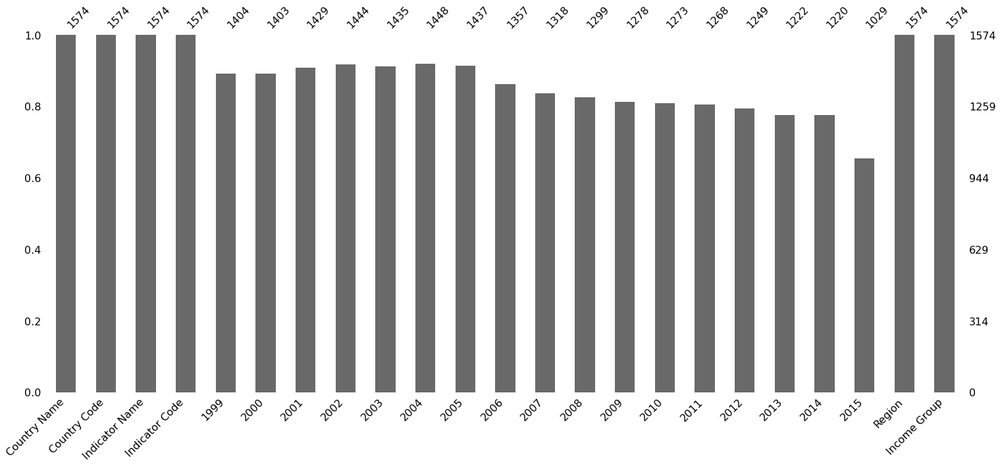

In [43]:
msno.bar(dft_red_country_income)
plt.savefig('msno_ind_99-15', dpi=200, bbox_inches='tight') 

# Etude des indicateurs selectionnes  

In [44]:
# Taux de remplissage de chaque indicateur:

nb_country = dft_red_country_income['Country Name'].nunique()
print(f'Nombre de pays : {nb_country}')
print("3 a 10% des valeurs manquantes sur les indicateurs")
dft_red_country_income['Indicator Name'].value_counts()


Nombre de pays : 211
3 a 10% des valeurs manquantes sur les indicateurs


Population, total                                                                    211
Internet users (per 100 people)                                                      204
Enrolment in upper secondary education, both sexes (number)                          196
Population of the official age for tertiary education, both sexes (number)           195
Population of the official age for upper secondary education, both sexes (number)    194
Enrolment in tertiary education, all programmes, both sexes (number)                 192
GDP per capita, PPP (current international $)                                        192
Personal computers (per 100 people)                                                  190
Name: Indicator Name, dtype: int64

### Déterminer des ordres de grandeurs des indicateurs statistiques (moyenne/médiane/écart-type par pays et par continent) 

In [45]:
list_ind_code=['IT.NET.USER.P2', 'IT.CMP.PCMP.P2', 'SP.SEC.UTOT.IN', 'SP.TER.TOTL.IN', 'UIS.E.3', 'NY.GDP.PCAP.PP.CD', 'SE.TER.ENRL',
 'SP.POP.TOTL']

In [46]:
# Indicateur communication : 

## internet

# par pays :

dft_net_sts=dft_red_country_income [dft_red_country_income ['Indicator Code'] == 'IT.NET.USER.P2']

mean_country_net=dft_net_sts.mean(axis=1,skipna=True,numeric_only=True)
dft_net_sts['Mean_net']=mean_country_net
med_country_net=dft_net_sts.median(axis=1,skipna=True,numeric_only=True)
dft_net_sts['Median_net']=med_country_net
std_country_net = dft_net_sts.std(ddof=0, axis=1,skipna=True,numeric_only=True)
dft_net_sts['Std_net']=std_country_net
dft_net_sts=dft_net_sts[['Country Name', 'Indicator Code' ,'Region', 'Income Group', 'Mean_net', 'Median_net', 'Std_net' ]]
dft_net_sts
# dft_net_sts.plot(x="Country Name", y=["Mean_net", "Median_net"], kind="bar", figsize=(40,10)) 
# plt.xlabel('')
# plt.show()

# par continent next


C:\Python\Python37\lib\site-packages\ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
C:\Python\Python37\lib\site-packages\ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if sys.path[0] == '':
C:\Python\Python37\lib\site-packages\ipykernel_launcher.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the 

,Country Name,Indicator Code,Region,Income Group,Mean_net,Median_net,Std_net
3,Afghanistan,IT.NET.USER.P2,South Asia,Low income,3.095920,2.601522,2.482936
11,Albania,IT.NET.USER.P2,Europe & Central Asia,Upper middle income,25.250741,19.448058,23.078292
19,Algeria,IT.NET.USER.P2,Middle East & North Africa,Upper middle income,11.155290,9.815595,9.917049
28,Andorra,IT.NET.USER.P2,Europe & Central Asia,High income: nonOECD,56.940400,70.040000,31.098469
33,Angola,IT.NET.USER.P2,Sub-Saharan Africa,Upper middle income,3.168368,1.800000,3.580921
41,Antigua and Barbuda,IT.NET.USER.P2,Latin America & Caribbean,High income: nonOECD,35.521023,34.760511,19.902208
49,Argentina,IT.NET.USER.P2,Latin America & Caribbean,Upper middle income,31.181564,27.029628,20.099807
57,Armenia,IT.NET.USER.P2,Europe & Central Asia,Lower middle income,17.875185,6.115627,18.366193
65,Aruba,IT.NET.USER.P2,Latin America & Caribbean,High income: nonOECD,44.134719,37.517360,25.579591
73,Australia,IT.NET.USER.P2,East Asia & Pacific,High income: OECD,69.364349,71.670000,12.686187


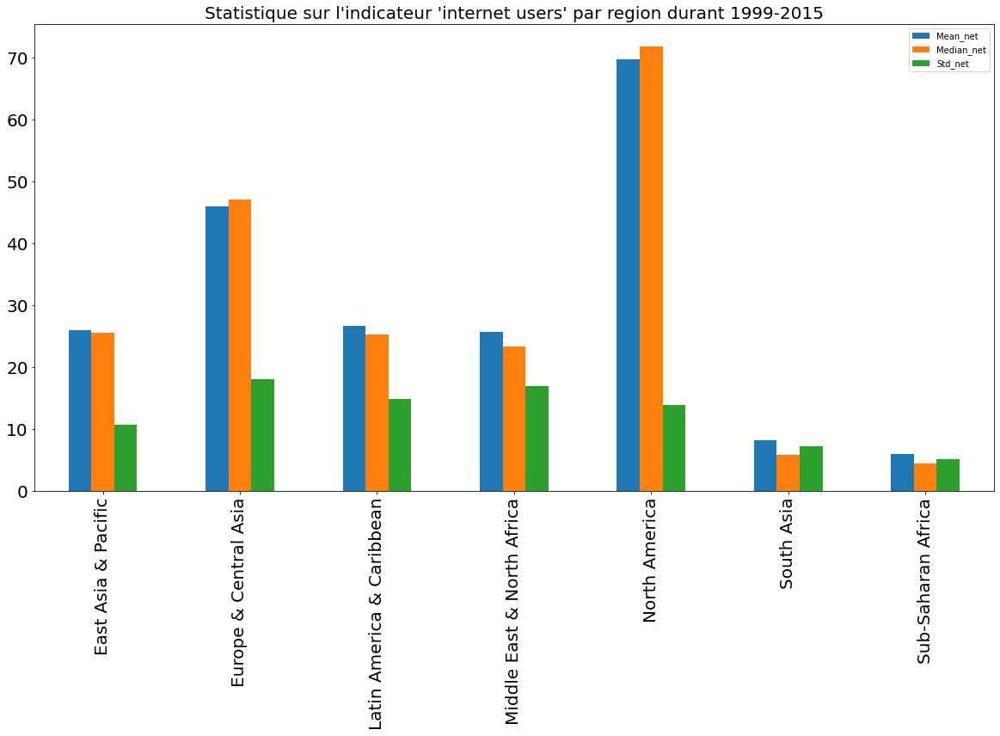

In [47]:
# sats net par region

dft_sats_cont_net=dft_net_sts[['Country Name', 'Region', 'Mean_net','Median_net', 'Std_net']]
stats_cont_net=dft_sats_cont_net.groupby('Region').mean()
# med_cont_net=dft_net_sts.groupby('Region')['Median_net'].mean()
# std_cont_net=dft_net_sts.groupby('Region')['Std_net'].mean()
# mean_cont_net=pd.DataFrame(mean_cont_net)
stats_cont_net.reset_index(inplace=True)
stats_cont_net
stats_cont_net.plot(x="Region", y=["Mean_net", "Median_net", "Std_net"], kind="bar", figsize=(20,10), fontsize=20, rot=90) 
plt.xlabel('')
#plt.show()
plt.title("Statistique sur l'indicateur 'internet users' par region durant 1999-2015",fontsize=20)
#plt.tight_layout()
plt.savefig('sats-net-region', dpi=200, bbox_inches='tight')        

In [48]:
# Indicateur communication : 

## PC

# par pays :

dft_pc_sts=dft_red_country_income [dft_red_country_income ['Indicator Code'] == 'IT.CMP.PCMP.P2']

mean_country_pc=dft_pc_sts.mean(axis=1,skipna=True,numeric_only=True)
dft_pc_sts['Mean_pc']=mean_country_pc
med_country_pc=dft_pc_sts.median(axis=1,skipna=True,numeric_only=True)
dft_pc_sts['Median_pc']=med_country_pc
std_country_pc = dft_pc_sts.std(ddof=0, axis=1,skipna=True,numeric_only=True)
dft_pc_sts['Std_pc']=std_country_pc
dft_pc_sts=dft_pc_sts[['Country Name', 'Indicator Code' ,'Region', 'Income Group', 'Mean_pc', 'Median_pc', 'Std_pc' ]]
dft_pc_sts
# dft_pc_sts.plot(x="Country Name", y=["Mean_pc", "Median_pc"], kind="bar", figsize=(40,10)) 
# plt.xlabel('')
# plt.show()

# par continent next


C:\Python\Python37\lib\site-packages\ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
C:\Python\Python37\lib\site-packages\ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if sys.path[0] == '':
C:\Python\Python37\lib\site-packages\ipykernel_launcher.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the 

,Country Name,Indicator Code,Region,Income Group,Mean_pc,Median_pc,Std_pc
4,Afghanistan,IT.CMP.PCMP.P2,South Asia,Low income,0.366026,0.366026,1.705729e-02
12,Albania,IT.CMP.PCMP.P2,Europe & Central Asia,Upper middle income,2.032724,1.492446,1.319689e+00
20,Algeria,IT.CMP.PCMP.P2,Middle East & North Africa,Upper middle income,0.761928,0.752437,1.261923e-01
34,Angola,IT.CMP.PCMP.P2,Sub-Saharan Africa,Upper middle income,0.284437,0.181371,2.019412e-01
42,Antigua and Barbuda,IT.CMP.PCMP.P2,Latin America & Caribbean,High income: nonOECD,13.803117,13.460927,3.048971e+00
50,Argentina,IT.CMP.PCMP.P2,Latin America & Caribbean,Upper middle income,7.716432,7.876619,8.795970e-01
58,Armenia,IT.CMP.PCMP.P2,Europe & Central Asia,Lower middle income,3.489410,2.680867,2.864722e+00
66,Aruba,IT.CMP.PCMP.P2,Latin America & Caribbean,High income: nonOECD,8.920613,8.920613,7.050348e-01
74,Australia,IT.CMP.PCMP.P2,East Asia & Pacific,High income: OECD,51.306992,51.311289,5.473839e+00
82,Austria,IT.CMP.PCMP.P2,Europe & Central Asia,High income: OECD,46.991882,47.594399,9.691772e+00


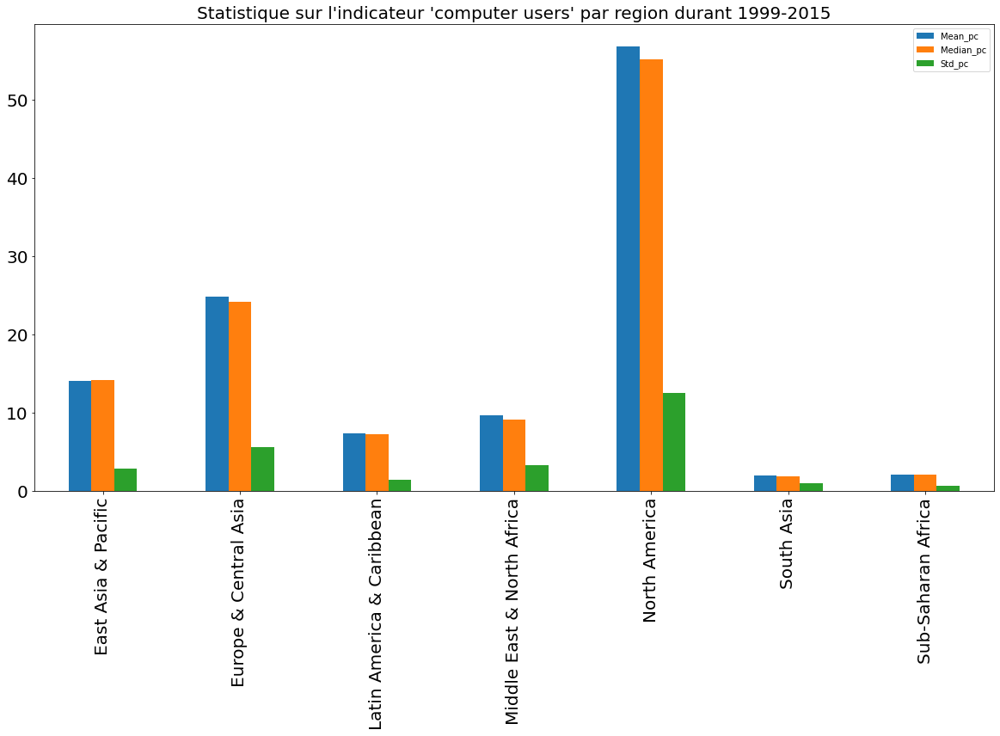

In [49]:
# sats pc par region

#dft_sats_cont_pc=dft_pc_sts[['Country Name', 'Region', 'Mean_net','Median_net', 'Std_net']]
stats_cont_pc=dft_pc_sts.groupby('Region').mean()
# med_cont_net=dft_net_sts.groupby('Region')['Median_net'].mean()
# std_cont_net=dft_net_sts.groupby('Region')['Std_net'].mean()
# mean_cont_net=pd.DataFrame(mean_cont_net)
stats_cont_pc.reset_index(inplace=True)
stats_cont_pc
stats_cont_pc.plot(x="Region", y=["Mean_pc", "Median_pc", "Std_pc"], kind="bar", figsize=(20,10), fontsize=20, rot=90) 
plt.xlabel('')
plt.title("Statistique sur l'indicateur 'computer users' par region durant 1999-2015", fontsize=20)
#plt.tight_layout()
plt.savefig('sats-pc-region', dpi=200, bbox_inches='tight')        

In [50]:
# Indicateur economique : NY.GDP.PCAP.PP.CD

# par pays :

dft_ec_sts=dft_red_country_income.loc[dft_red_country_income ['Indicator Code'] == 'NY.GDP.PCAP.PP.CD']
#dft_ec_sts
mean_country_ec=dft_ec_sts.mean(axis=1,skipna=True,numeric_only=True)
dft_ec_sts['Mean_ec']=mean_country_ec
med_country_ec=dft_ec_sts.median(axis=1,skipna=True,numeric_only=True)
dft_ec_sts['Median_ec']=med_country_ec
std_country_ec = dft_ec_sts.std(ddof=0, axis=1,skipna=True,numeric_only=True)
dft_ec_sts['Std_ec']=std_country_ec
dft_ec_sts=dft_ec_sts[['Country Name', 'Indicator Code' ,'Region', 'Income Group', 'Mean_ec', 'Median_ec', 'Std_ec']]
dft_ec_sts
                          
# dft_ec_sts.plot(x="Country Name", y=["Mean_ec", "Median_ec"], kind="bar", figsize=(50,25), fontsize=15) 
# plt.xlabel('')

# plt.savefig('sats-ec-country', dpi=200, bbox_inches='tight')     
                          

C:\Python\Python37\lib\site-packages\ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
C:\Python\Python37\lib\site-packages\ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
C:\Python\Python37\lib\site-packages\ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documen

,Country Name,Indicator Code,Region,Income Group,Mean_ec,Median_ec,Std_ec
2,Afghanistan,NY.GDP.PCAP.PP.CD,South Asia,Low income,1390.347758,1390.347758,358.741599
10,Albania,NY.GDP.PCAP.PP.CD,Europe & Central Asia,Upper middle income,7543.374169,7416.503268,2505.539518
18,Algeria,NY.GDP.PCAP.PP.CD,Middle East & North Africa,Upper middle income,11356.815691,11600.267450,2021.406327
32,Angola,NY.GDP.PCAP.PP.CD,Sub-Saharan Africa,Upper middle income,4615.503708,4871.932480,1467.364409
40,Antigua and Barbuda,NY.GDP.PCAP.PP.CD,Latin America & Caribbean,High income: nonOECD,18447.102446,18714.694950,2756.291291
48,Argentina,NY.GDP.PCAP.PP.CD,Latin America & Caribbean,Upper middle income,15705.211809,16161.666331,3371.775464
56,Armenia,NY.GDP.PCAP.PP.CD,Europe & Central Asia,Lower middle income,5563.981850,5965.612103,2063.062158
64,Aruba,NY.GDP.PCAP.PP.CD,Latin America & Caribbean,High income: nonOECD,35973.780510,35973.780510,0.000000
72,Australia,NY.GDP.PCAP.PP.CD,East Asia & Pacific,High income: OECD,36025.686962,36310.847686,6606.036071
80,Austria,NY.GDP.PCAP.PP.CD,Europe & Central Asia,High income: OECD,38713.801825,39045.422835,6755.876775


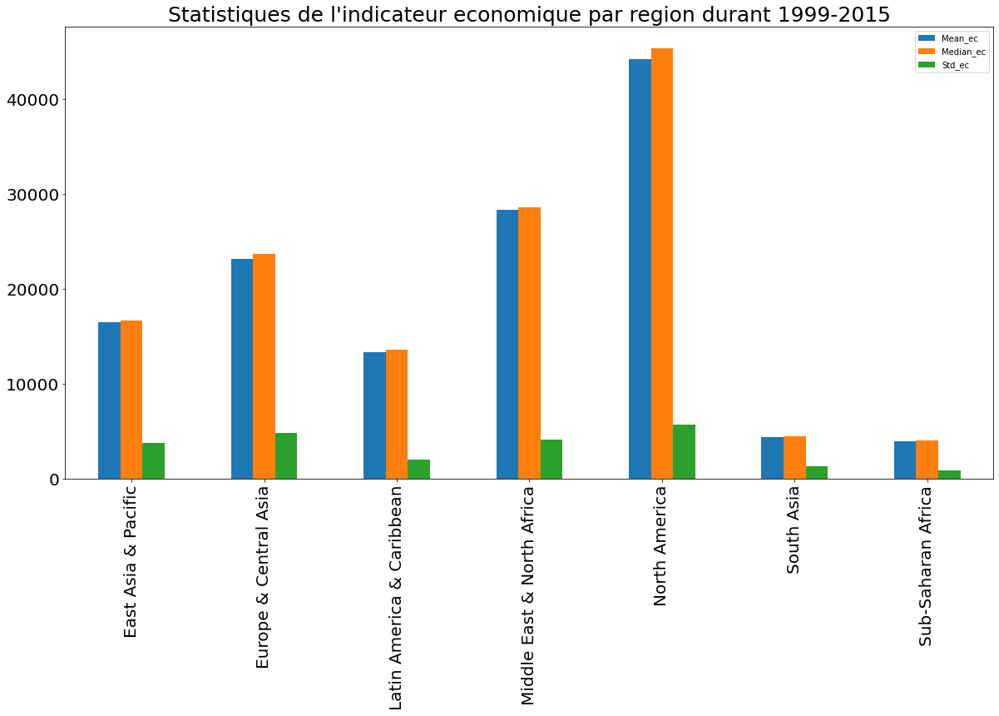

In [51]:
# sats ec par region


stats_cont_ec=dft_ec_sts.groupby('Region').mean()

stats_cont_ec.reset_index(inplace=True)
stats_cont_ec
stats_cont_ec.plot(x="Region", y=["Mean_ec", "Median_ec", "Std_ec"], kind="bar", figsize=(20,10), fontsize=20, rot=90) 
plt.xlabel('')
plt.title("Statistiques de l'indicateur economique par region durant 1999-2015", fontsize=25)
#plt.tight_layout()
plt.savefig('sats-ec-region', dpi=200, bbox_inches='tight')    

C:\Python\Python37\lib\site-packages\ipykernel_launcher.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # This is added back by InteractiveShellApp.init_path()
C:\Python\Python37\lib\site-packages\ipykernel_launcher.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  del sys.path[0]
C:\Python\Python37\lib\site-packages\ipykernel_launcher.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the ca

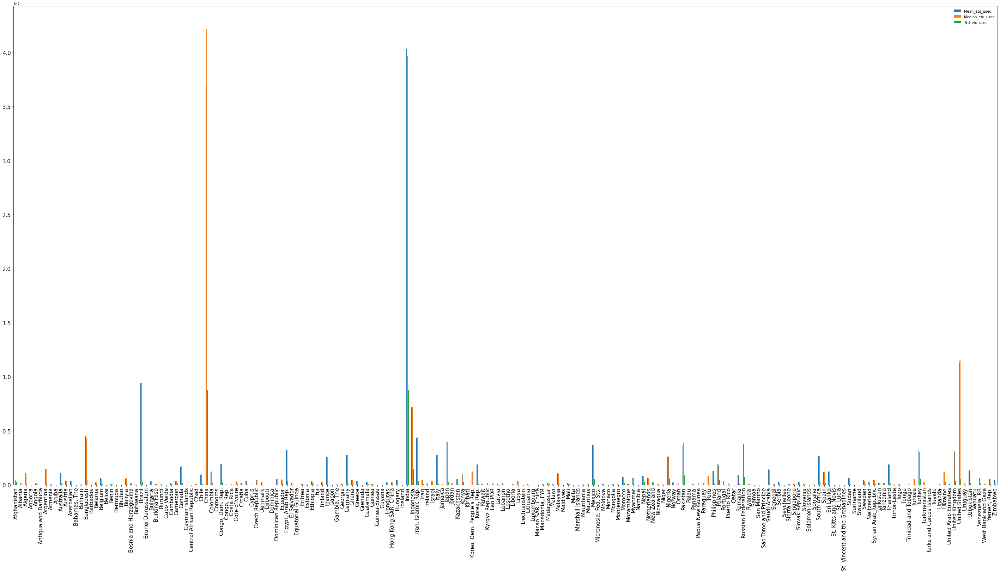

In [204]:
# Indicateur Etudiants :

## Indicateur Etudiants Up-Secondaire Lycee UIS.E.3


# par pays :

dft_etd_usec_sts=dft_red_country_income.loc[dft_red_country_income ['Indicator Code'] == 'UIS.E.3']

mean_country_etd_usec=dft_etd_usec_sts.mean(axis=1,skipna=True,numeric_only=True)
dft_etd_usec_sts['Mean_etd_usec']=mean_country_etd_usec
med_country_etd_usec=dft_etd_usec_sts.median(axis=1,skipna=True,numeric_only=True)
dft_etd_usec_sts['Median_etd_usec']=med_country_etd_usec
std_country_etd_usec = dft_etd_usec_sts.std(ddof=0, axis=1,skipna=True,numeric_only=True)
dft_etd_usec_sts['Std_etd_usec']=std_country_etd_usec
dft_etd_usec_sts=dft_etd_usec_sts[['Country Name', 'Indicator Code' ,'Region', 'Income Group', 'Mean_etd_usec', 'Median_etd_usec', 'Std_etd_usec']]
dft_etd_usec_sts
                          
dft_etd_usec_sts.plot(x="Country Name", y=['Mean_etd_usec', 'Median_etd_usec', 'Std_etd_usec'], kind="bar", figsize=(50,25), fontsize=15) 
plt.xlabel('')

plt.savefig('sats-etd_usec_country', dpi=200, bbox_inches='tight')     
                          


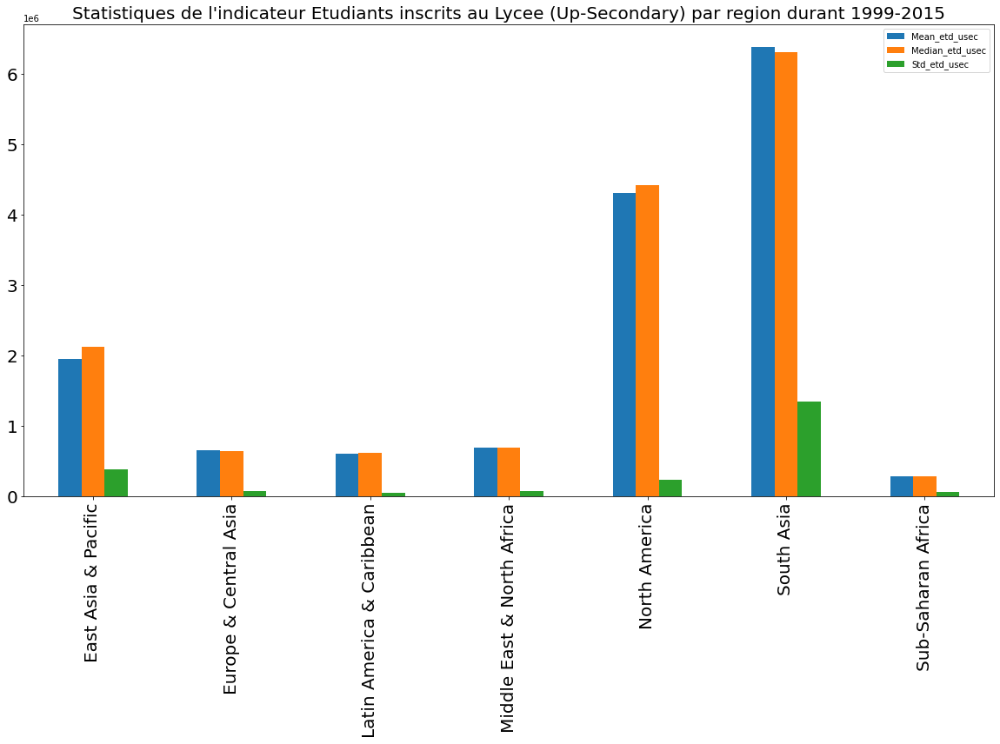

In [53]:
# sats Indicateur Etudiants Up-Secondaire Lycee UIS.E.3 par region


stats_cont_etd_usec=dft_etd_usec_sts.groupby('Region').mean()

stats_cont_etd_usec.reset_index(inplace=True)
stats_cont_etd_usec
stats_cont_etd_usec.plot(x="Region", y=['Mean_etd_usec', 'Median_etd_usec', 'Std_etd_usec'], kind="bar", figsize=(20,10), fontsize=20, rot=90) 
plt.xlabel('')
plt.title("Statistiques de l'indicateur Etudiants inscrits au Lycee (Up-Secondary) par region durant 1999-2015", fontsize=20)
#plt.tight_layout()
plt.savefig('sats-etudiants-lycee-region', dpi=200, bbox_inches='tight')    

In [60]:
## Indicateur Etudiants tertiary universitaire SE.TER.ENRL



# par pays :

dft_etd_univ_sts=dft_red_country_income.loc[dft_red_country_income ['Indicator Code'] == 'SE.TER.ENRL']

mean_country_etd_univ=dft_etd_univ_sts.mean(axis=1,skipna=True,numeric_only=True)
dft_etd_univ_sts['Mean_etd_univ']=mean_country_etd_univ
med_country_etd_univ=dft_etd_univ_sts.median(axis=1,skipna=True,numeric_only=True)
dft_etd_univ_sts['Median_etd_univ']=med_country_etd_univ
std_country_etd_univ = dft_etd_univ_sts.std(ddof=0, axis=1,skipna=True,numeric_only=True)
dft_etd_univ_sts['Std_etd_univ']=std_country_etd_univ
dft_etd_univ_sts=dft_etd_univ_sts[['Country Name', 'Indicator Code' ,'Region', 'Income Group', 'Mean_etd_univ', 'Median_etd_univ', 'Std_etd_univ']]
dft_etd_univ_sts

# dft_etd_univ_sts.plot(x="Country Name", y=['Mean_etd_univ', 'Median_etd_univ'], kind="bar", figsize=(50,25), fontsize=15) 
# plt.xlabel('')

C:\Python\Python37\lib\site-packages\ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
C:\Python\Python37\lib\site-packages\ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if sys.path[0] == '':
C:\Python\Python37\lib\site-packages\ipykernel_launcher.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the 

,Country Name,Indicator Code,Region,Income Group,Mean_etd_univ,Median_etd_univ,Std_etd_univ
0,Afghanistan,SE.TER.ENRL,South Asia,Low income,1.018844e+05,9.634450e+04,7.294375e+04
8,Albania,SE.TER.ENRL,Europe & Central Asia,Upper middle income,9.366406e+04,8.873450e+04,4.650821e+04
16,Algeria,SE.TER.ENRL,Middle East & North Africa,Upper middle income,9.347557e+05,9.181588e+05,2.627945e+05
24,American Samoa,SE.TER.ENRL,East Asia & Pacific,Upper middle income,1.607000e+03,1.607000e+03,0.000000e+00
26,Andorra,SE.TER.ENRL,Europe & Central Asia,High income: nonOECD,4.134000e+02,4.134000e+02,8.339984e+01
30,Angola,SE.TER.ENRL,Sub-Saharan Africa,Upper middle income,8.728156e+04,4.843900e+04,7.293946e+04
38,Antigua and Barbuda,SE.TER.ENRL,Latin America & Caribbean,High income: nonOECD,1.266750e+03,1.170000e+03,2.534217e+02
46,Argentina,SE.TER.ENRL,Latin America & Caribbean,Upper middle income,2.265319e+06,2.208291e+06,3.355782e+05
54,Armenia,SE.TER.ENRL,Europe & Central Asia,Lower middle income,1.174783e+05,1.153410e+05,1.784676e+04
62,Aruba,SE.TER.ENRL,Latin America & Caribbean,High income: nonOECD,1.854529e+03,1.779265e+03,4.292981e+02


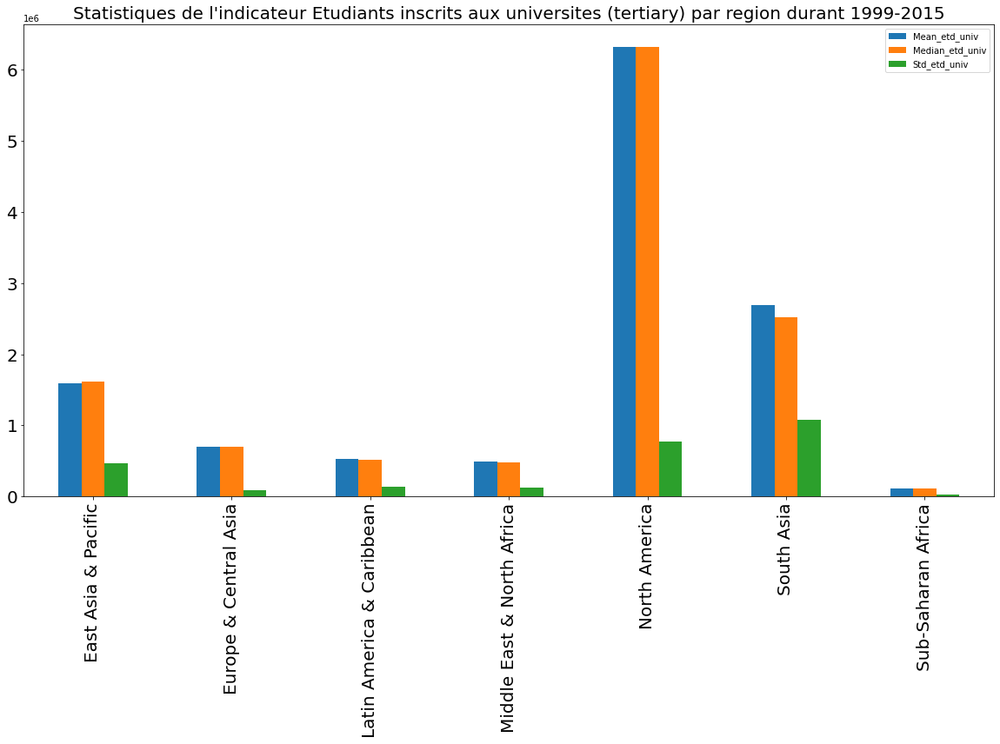

In [61]:
## Indicateur Etudiants tertiary universitaire SE.TER.ENRL


# par Region :

stats_cont_etd_univ=dft_etd_univ_sts.groupby('Region').mean()

stats_cont_etd_univ.reset_index(inplace=True)
stats_cont_etd_univ
stats_cont_etd_univ.plot(x="Region", y=['Mean_etd_univ', 'Median_etd_univ', 'Std_etd_univ'], kind="bar", figsize=(20,10), fontsize=20, rot=90) 
plt.xlabel('')
plt.title("Statistiques de l'indicateur Etudiants inscrits aux universites (tertiary) par region durant 1999-2015", fontsize=20)
#plt.tight_layout()
plt.savefig('sats-etudiants-unive-region', dpi=200, bbox_inches='tight')  

In [62]:
# Indicateur Population (up secondary and tertiary)

## pop up secondary SP.SEC.UTOT.IN


# par pays :

dft_pop_usec_sts=dft_red_country_income.loc[dft_red_country_income ['Indicator Code'] == 'SP.SEC.UTOT.IN']

mean_country_pop_usec=dft_pop_usec_sts.mean(axis=1,skipna=True,numeric_only=True)
dft_pop_usec_sts['Mean_pop_usec']=mean_country_pop_usec
med_country_pop_usec=dft_pop_usec_sts.median(axis=1,skipna=True,numeric_only=True)
dft_pop_usec_sts['Median_pop_usec']=med_country_pop_usec
std_country_pop_usec = dft_pop_usec_sts.std(ddof=0, axis=1,skipna=True,numeric_only=True)
dft_pop_usec_sts['Std_pop_usec']=std_country_pop_usec
dft_pop_usec_sts=dft_pop_usec_sts[['Country Name', 'Indicator Code' ,'Region', 'Income Group', 'Mean_pop_usec', 'Median_pop_usec', 'Std_pop_usec']]
dft_pop_usec_sts
                          
# dft_pop_usec_sts.plot(x="Country Name", y=['Mean_pop_usec', 'Median_pop_usec'], kind="bar", figsize=(50,25), fontsize=15) 
# plt.xlabel('')

C:\Python\Python37\lib\site-packages\ipykernel_launcher.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # This is added back by InteractiveShellApp.init_path()
C:\Python\Python37\lib\site-packages\ipykernel_launcher.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  del sys.path[0]
C:\Python\Python37\lib\site-packages\ipykernel_launcher.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the ca

,Country Name,Indicator Code,Region,Income Group,Mean_pop_usec,Median_pop_usec,Std_pop_usec
6,Afghanistan,SP.SEC.UTOT.IN,South Asia,Low income,1.674497e+06,1.640840e+06,3.007442e+05
14,Albania,SP.SEC.UTOT.IN,Europe & Central Asia,Upper middle income,2.189450e+05,2.388800e+05,4.004294e+04
22,Algeria,SP.SEC.UTOT.IN,Middle East & North Africa,Upper middle income,2.197015e+06,2.262588e+06,1.664519e+05
36,Angola,SP.SEC.UTOT.IN,Sub-Saharan Africa,Upper middle income,1.293024e+06,1.272619e+06,1.911337e+05
44,Antigua and Barbuda,SP.SEC.UTOT.IN,Latin America & Caribbean,High income: nonOECD,2.926471e+03,2.929735e+03,2.300163e+02
52,Argentina,SP.SEC.UTOT.IN,Latin America & Caribbean,Upper middle income,2.036935e+06,2.054444e+06,4.350346e+04
60,Armenia,SP.SEC.UTOT.IN,Europe & Central Asia,Lower middle income,1.188703e+05,1.209360e+05,1.061519e+04
68,Aruba,SP.SEC.UTOT.IN,Latin America & Caribbean,High income: nonOECD,4.314588e+03,4.482500e+03,2.915061e+02
76,Australia,SP.SEC.UTOT.IN,East Asia & Pacific,High income: OECD,5.697829e+05,5.796615e+05,2.444904e+04
84,Austria,SP.SEC.UTOT.IN,Europe & Central Asia,High income: OECD,3.855271e+05,3.851026e+05,1.036659e+04


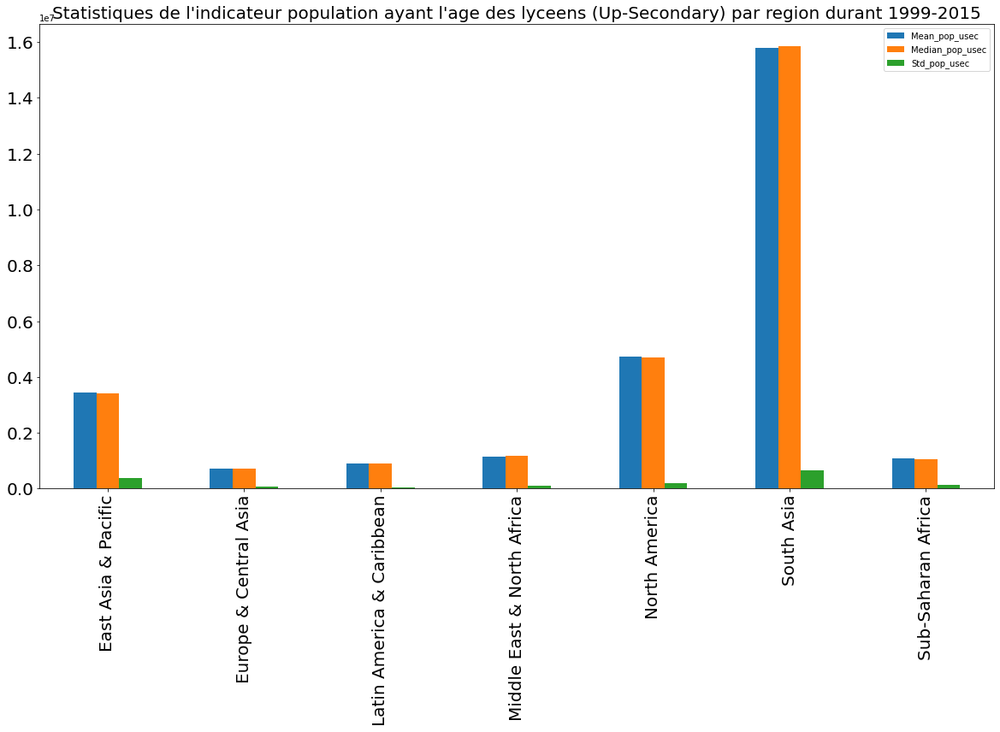

In [63]:
# sats Indicateur population up secondary Lycee par region


stats_cont_pop_usec=dft_pop_usec_sts.groupby('Region').mean()

stats_cont_pop_usec.reset_index(inplace=True)
stats_cont_pop_usec
stats_cont_pop_usec.plot(x="Region", y=['Mean_pop_usec', 'Median_pop_usec', 'Std_pop_usec'], kind="bar", figsize=(20,10), fontsize=20, rot=90) 
plt.xlabel('')
plt.title("Statistiques de l'indicateur population ayant l'age des lyceens (Up-Secondary) par region durant 1999-2015", fontsize=20)
#plt.tight_layout()
plt.savefig('sats-pop-lycee-region', dpi=200, bbox_inches='tight')    

In [65]:
## pop tertiary universitaire SP.TER.TOTL.IN

# par pays :

dft_pop_univ_sts=dft_red_country_income.loc[dft_red_country_income ['Indicator Code'] == 'SP.TER.TOTL.IN']

mean_country_pop_univ=dft_pop_univ_sts.mean(axis=1,skipna=True,numeric_only=True)
dft_pop_univ_sts['Mean_pop_univ']=mean_country_pop_univ
med_country_pop_univ=dft_pop_univ_sts.median(axis=1,skipna=True,numeric_only=True)
dft_pop_univ_sts['Median_pop_univ']=med_country_pop_univ
std_country_pop_univ = dft_pop_univ_sts.std(ddof=0, axis=1,skipna=True,numeric_only=True)
dft_pop_univ_sts['Std_pop_univ']=std_country_pop_univ
dft_pop_univ_sts=dft_pop_univ_sts[['Country Name', 'Indicator Code' ,'Region', 'Income Group', 'Mean_pop_univ', 'Median_pop_univ', 'Std_pop_univ']]
dft_pop_univ_sts

# dft_pop_univ_sts.plot(x="Country Name", y=['Mean_pop_univ', 'Median_pop_univ'], kind="bar", figsize=(50,25), fontsize=15) 
# plt.xlabel('')

C:\Python\Python37\lib\site-packages\ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
C:\Python\Python37\lib\site-packages\ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
C:\Python\Python37\lib\site-packages\ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documen

,Country Name,Indicator Code,Region,Income Group,Mean_pop_univ,Median_pop_univ,Std_pop_univ
5,Afghanistan,SP.TER.TOTL.IN,South Asia,Low income,2.374246e+06,2.376464e+06,3.934843e+05
13,Albania,SP.TER.TOTL.IN,Europe & Central Asia,Upper middle income,2.706498e+05,2.730875e+05,8.883351e+03
21,Algeria,SP.TER.TOTL.IN,Middle East & North Africa,Upper middle income,3.692783e+06,3.725506e+06,1.498164e+05
35,Angola,SP.TER.TOTL.IN,Sub-Saharan Africa,Upper middle income,1.833695e+06,1.808992e+06,2.593011e+05
43,Antigua and Barbuda,SP.TER.TOTL.IN,Latin America & Caribbean,High income: nonOECD,6.669059e+03,6.695029e+03,8.754370e+02
51,Argentina,SP.TER.TOTL.IN,Latin America & Caribbean,Upper middle income,3.352478e+06,3.344642e+06,7.388810e+04
59,Armenia,SP.TER.TOTL.IN,Europe & Central Asia,Lower middle income,2.816634e+05,2.823822e+05,1.758091e+04
67,Aruba,SP.TER.TOTL.IN,Latin America & Caribbean,High income: nonOECD,6.437471e+03,6.450735e+03,6.382669e+02
75,Australia,SP.TER.TOTL.IN,East Asia & Pacific,High income: OECD,1.468334e+06,1.481351e+06,1.181963e+05
83,Austria,SP.TER.TOTL.IN,Europe & Central Asia,High income: OECD,5.020672e+05,5.084775e+05,1.957943e+04


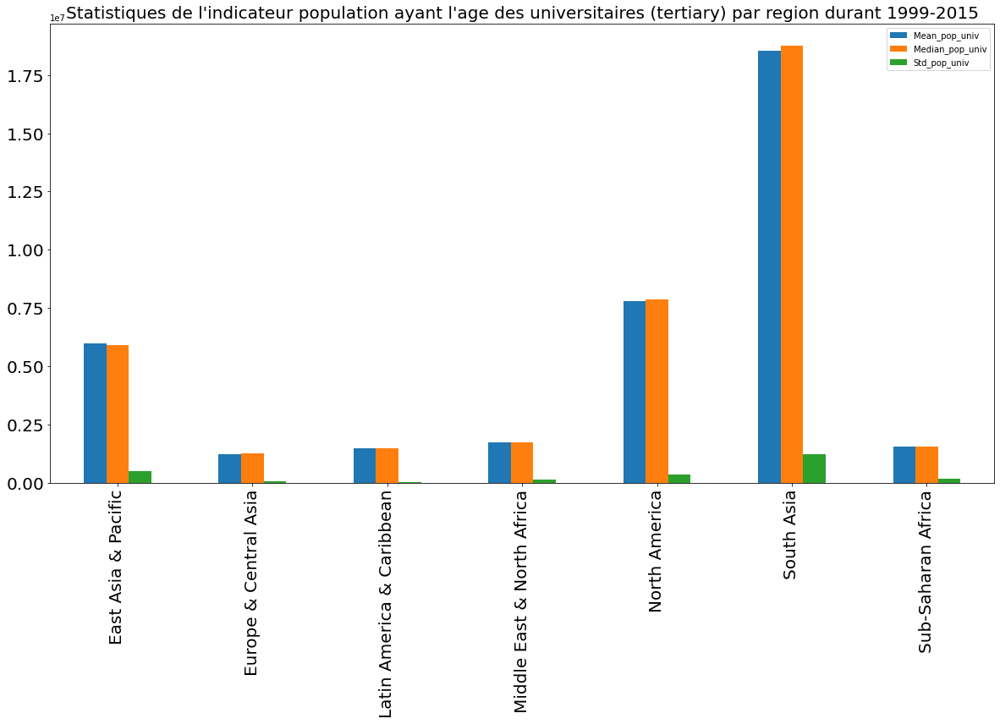

In [66]:
## pop tertiary unversitaire SP.TER.TOTL.IN

# par Region :

stats_cont_pop_univ=dft_pop_univ_sts.groupby('Region').mean()

stats_cont_pop_univ.reset_index(inplace=True)
stats_cont_pop_univ
stats_cont_pop_univ.plot(x="Region", y=['Mean_pop_univ', 'Median_pop_univ', 'Std_pop_univ'], kind="bar", figsize=(20,10), fontsize=20, rot=90) 
plt.xlabel('')
plt.title("Statistiques de l'indicateur population ayant l'age des universitaires (tertiary) par region durant 1999-2015", fontsize=20)
#plt.tight_layout()
plt.savefig('sats-pop-univ-region', dpi=200, bbox_inches='tight') 

### Retenir la derniere valeure non-nulle de chaque indicateur : on aura la valeure la plus recente renseignee

In [67]:
# Retenir la derniere valeur non nulle sur la plage 1990-2015 donc la plus recente renseignee

dft_filt_fillna = dft_red_country_income.copy()
cols_num = dft_filt_fillna.columns[4:-2].tolist()

df_num = dft_filt_fillna[cols_num]
#df_num

df_catg = dft_filt_fillna.loc[:, ['Country Name', 'Country Code','Indicator Name', 'Indicator Code', 'Region','Income Group']]

# fill na with ffill

df_num.fillna(method='ffill', axis=1, inplace=True)
#df_num['2015'].isna().sum()

dft_filt_fillna = pd.concat([df_catg, df_num], axis=1)
dft_filt_fillna.info()



<class 'pandas.core.frame.DataFrame'>
Int64Index: 1574 entries, 0 to 1579
Data columns (total 23 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Country Name    1574 non-null   object 
 1   Country Code    1574 non-null   object 
 2   Indicator Name  1574 non-null   object 
 3   Indicator Code  1574 non-null   object 
 4   Region          1574 non-null   object 
 5   Income Group    1574 non-null   object 
 6   1999            1404 non-null   float64
 7   2000            1438 non-null   float64
 8   2001            1482 non-null   float64
 9   2002            1500 non-null   float64
 10  2003            1517 non-null   float64
 11  2004            1526 non-null   float64
 12  2005            1535 non-null   float64
 13  2006            1540 non-null   float64
 14  2007            1547 non-null   float64
 15  2008            1553 non-null   float64
 16  2009            1561 non-null   float64
 17  2010            1566 non-null   f

C:\Python\Python37\lib\site-packages\pandas\core\frame.py:5182: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  downcast=downcast,


In [68]:
# On garde que la dernière année remplie qui est 2015

df_lyear = dft_filt_fillna[['Country Name', 'Country Code', 'Indicator Name', 'Indicator Code', 'Region','Region','Income Group','2015']]    

df_lyear 

# il dit type float et pourtant probleme ensuite il le prend pas comme float '2015'

# df_lyear  = df_lyear .astype({'2015': 'float64'})
# df_lyear 



,Country Name,Country Code,Indicator Name,Indicator Code,Region,Region,Income Group,2015
0,Afghanistan,AFG,"Enrolment in tertiary education, all programmes, both sexes (number)",SE.TER.ENRL,South Asia,South Asia,Low income,2.628740e+05
1,Afghanistan,AFG,"Enrolment in upper secondary education, both sexes (number)",UIS.E.3,South Asia,South Asia,Low income,9.687690e+05
2,Afghanistan,AFG,"GDP per capita, PPP (current international $)",NY.GDP.PCAP.PP.CD,South Asia,South Asia,Low income,1.864974e+03
3,Afghanistan,AFG,Internet users (per 100 people),IT.NET.USER.P2,South Asia,South Asia,Low income,8.260000e+00
4,Afghanistan,AFG,Personal computers (per 100 people),IT.CMP.PCMP.P2,South Asia,South Asia,Low income,3.901483e-01
5,Afghanistan,AFG,"Population of the official age for tertiary education, both sexes (number)",SP.TER.TOTL.IN,South Asia,South Asia,Low income,3.199607e+06
6,Afghanistan,AFG,"Population of the official age for upper secondary education, both sexes (number)",SP.SEC.UTOT.IN,South Asia,South Asia,Low income,2.305137e+06
7,Afghanistan,AFG,"Population, total",SP.POP.TOTL,South Asia,South Asia,Low income,3.373649e+07
8,Albania,ALB,"Enrolment in tertiary education, all programmes, both sexes (number)",SE.TER.ENRL,Europe & Central Asia,Europe & Central Asia,Upper middle income,1.605270e+05
9,Albania,ALB,"Enrolment in upper secondary education, both sexes (number)",UIS.E.3,Europe & Central Asia,Europe & Central Asia,Upper middle income,1.519370e+05


In [69]:
# Calcul de la moyenne pour les indicateurs selectionnes pour tous les pays, valeure plus recente/indicateur:

# Indicateur communication : voir correlation entre les 2 indicateurs (internet et PC)
# internet
mean_com_net = df_lyear [df_lyear ['Indicator Code'] == 'IT.NET.USER.P2']['2015'].mean() 
med_com_net = df_lyear [df_lyear ['Indicator Code'] == 'IT.NET.USER.P2']['2015'].median() 
std_com_net = df_lyear [df_lyear ['Indicator Code'] == 'IT.NET.USER.P2']['2015'].std(ddof=0)

#PC
mean_com_pc  = df_lyear [df_lyear ['Indicator Code'] == 'IT.CMP.PCMP.P2']['2015'].mean() 
med_com_pc  = df_lyear [df_lyear ['Indicator Code'] == 'IT.CMP.PCMP.P2']['2015'].median() 
std_com_pc  = df_lyear [df_lyear ['Indicator Code'] == 'IT.CMP.PCMP.P2']['2015'].std(ddof=0)
 
# Indicateur economique :

mean_ec = df_lyear [df_lyear ['Indicator Code'] == 'NY.GDP.PCAP.PP.CD']['2015'].mean() 
med_ec = df_lyear [df_lyear ['Indicator Code'] == 'NY.GDP.PCAP.PP.CD']['2015'].median() 
std_ec = df_lyear [df_lyear ['Indicator Code'] == 'NY.GDP.PCAP.PP.CD']['2015'].std(ddof=0)

# Indicateur Etudiants Up-Secondaire Lycee

mean_etud_usec = df_lyear [df_lyear ['Indicator Code'] == 'UIS.E.3']['2015'].mean() 
med_etud_usec = df_lyear [df_lyear ['Indicator Code'] == 'UIS.E.3']['2015'].median() 
std_etud_usec = df_lyear [df_lyear ['Indicator Code'] == 'UIS.E.3']['2015'].std(ddof=0)

#  Indicateur Etudiants tertiary universitaire

mean_etud_univ = df_lyear [df_lyear ['Indicator Code'] == 'SE.TER.ENRL']['2015'].mean()
med_etud_univ = df_lyear [df_lyear ['Indicator Code'] == 'SE.TER.ENRL']['2015'].median()
std_etud_univ = df_lyear [df_lyear ['Indicator Code'] == 'SE.TER.ENRL']['2015'].std(ddof=0)

# Indicateur Population (up secondary and tertiary)

# pop up secondary 

mean_pop_usec = df_lyear [df_lyear ['Indicator Code'] == 'SP.SEC.UTOT.IN']['2015'].mean()
med_pop_usec = df_lyear [df_lyear ['Indicator Code'] == 'SP.SEC.UTOT.IN']['2015'].median()
std_pop_usec = df_lyear [df_lyear ['Indicator Code'] == 'SP.SEC.UTOT.IN']['2015'].std(ddof=0)

# pop tertiary unversitaire

mean_pop_univ = df_lyear [df_lyear ['Indicator Code'] == 'SP.TER.TOTL.IN']['2015'].mean()
med_pop_univ = df_lyear [df_lyear ['Indicator Code'] == 'SP.TER.TOTL.IN']['2015'].median()
std_pop_univ = df_lyear [df_lyear ['Indicator Code'] == 'SP.TER.TOTL.IN']['2015'].std(ddof=0)

# pop totale
mean_pop_tot = df_lyear [df_lyear ['Indicator Code'] == 'SP.POP.TOTL']['2015'].mean()
med_pop_tot = df_lyear [df_lyear ['Indicator Code'] == 'SP.POP.TOTL']['2015'].median()
std_pop_tot = df_lyear [df_lyear ['Indicator Code'] == 'SP.POP.TOTL']['2015'].std(ddof=0)

## Tableau des resultats :

stats = [['mean', mean_com_net, mean_com_pc, mean_ec, mean_etud_usec, mean_etud_univ, mean_pop_usec, mean_pop_univ, mean_pop_tot],
         ['median', med_com_net, med_com_pc, med_ec, med_etud_usec, med_etud_univ, med_pop_usec, med_pop_univ, med_pop_tot],
         ['std', std_com_net, std_com_pc, std_ec, std_etud_usec, std_etud_univ, std_pop_usec, std_pop_univ, std_pop_tot]]

df_stats = pd.DataFrame(stats, columns=['Stats', 'Stat_com_int','Stat_com_pc','Stat_ec', 'Stat_etud_usec', 'Stat_etud_univ', 'Stat_pop_usec', 'Stat_pop_univ', 'Stat_pop_tot' ])
df_stats

,Stats,Stat_com_int,Stat_com_pc,Stat_ec,Stat_etud_usec,Stat_etud_univ,Stat_pop_usec,Stat_pop_univ,Stat_pop_tot
0,mean,48.443667,17.019329,19893.396149,1.259587e+06,1.104933e+06,1.957498e+06,3.052388e+06,3.474168e+07
1,median,49.869659,7.829152,12365.452478,1.793140e+05,1.770990e+05,3.548550e+05,5.949050e+05,6.639119e+06
2,std,28.505436,22.127762,21622.542869,5.182721e+06,4.214611e+06,8.077960e+06,1.147660e+07,1.347617e+08


### Graphique Indicateurs

In [ ]:
print(list_ind_code)

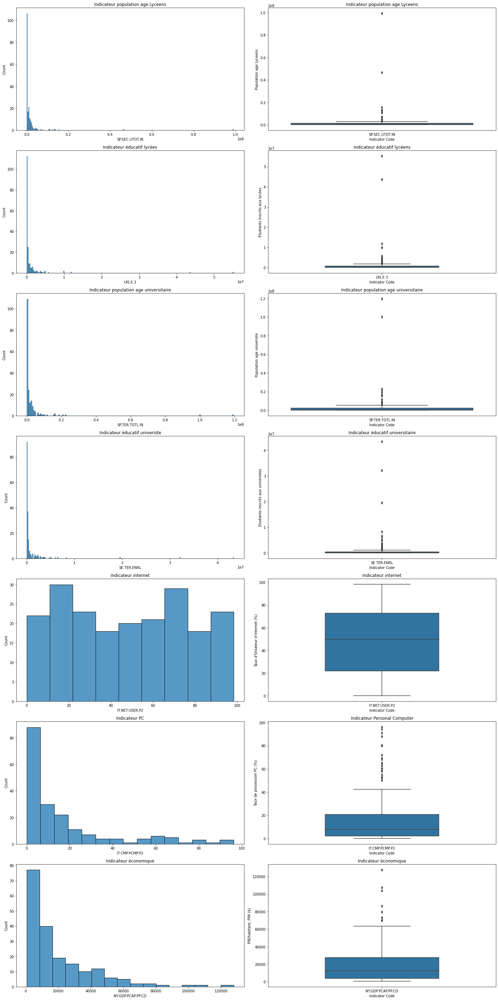

In [70]:
# Graphiques statistiques sur les 7 indicateurs
plt.figure(figsize=(20, 40))

# ------------------------------------------------------------------------------------
# Indicateur démographique : Population ayant age des lyceens SP.SEC.UTOT.IN
# ------------------------------------------------------------------------------------

#df_lyear [df_lyear ['Indicator Code'] == 'SP.SEC.UTOT.IN']['2015'].mean()
df_pop_usec = df_lyear [df_lyear ['Indicator Code'] == 'SP.SEC.UTOT.IN']


plt.subplot(7, 2, 1)
sns.histplot(df_pop_usec['2015'])
plt.title('Indicateur population age Lyceens')
plt.xlabel('SP.SEC.UTOT.IN')

plt.subplot(7, 2, 2)
sns.boxplot(x=df_pop_usec['Indicator Code'],
            y=df_pop_usec['2015'])  #, showfliers=False
plt.title('Indicateur population age Lyceens')
plt.ylabel('Population age Lyceens')

# ------------------------------------------------------------------------------------
# Indicateur éducatif : Etudiants inscrits aux lycees-UIS.E.3
# ------------------------------------------------------------------------------------

df_etud_usec = df_lyear[df_lyear ['Indicator Code'] == 'UIS.E.3']

plt.subplot(7, 2, 3)
sns.histplot(df_etud_usec['2015']) #, color='SteelBlue'
plt.title('Indicateur éducatif lycées')
plt.xlabel('UIS.E.3')


plt.subplot(7, 2, 4)

sns.boxplot(x=df_etud_usec['Indicator Code'],
            y=df_etud_usec['2015'], width=0.5) #, showfliers=False
plt.title('Indicateur éducatif lycéens')
plt.ylabel('Etudiants inscrits aux lycées')

# ------------------------------------------------------------------------------------
# Indicateur démographique : Population ayant age des univesitires SP.TER.TOTL.IN
# ------------------------------------------------------------------------------------
#df_lyear [df_lyear ['Indicator Code'] == 'SP.SEC.UTOT.IN']['2015'].mean()
df_pop_tert = df_lyear [df_lyear ['Indicator Code'] == 'SP.TER.TOTL.IN']


plt.subplot(7, 2, 5)
sns.histplot(df_pop_tert['2015'])
plt.title('Indicateur population age universitaire')
plt.xlabel('SP.TER.TOTL.IN')

plt.subplot(7, 2, 6)
sns.boxplot(x=df_pop_tert['Indicator Code'],
            y=df_pop_tert['2015'])
plt.title('Indicateur population age universitaire')
plt.ylabel('Population age universite')


# ------------------------------------------------------------------------------------
# Indicateur éducatif universite : Etudiants inscrits aux universites 'SE.TER.ENRL
# ------------------------------------------------------------------------------------

df_etud_univ = df_lyear[df_lyear ['Indicator Code'] == 'SE.TER.ENRL']

plt.subplot(7, 2, 7)
sns.histplot(df_etud_univ['2015'])
plt.title('Indicateur éducatif universite')
plt.xlabel('SE.TER.ENRL')


plt.subplot(7, 2, 8)

sns.boxplot(x=df_etud_univ['Indicator Code'],
            y=df_etud_univ['2015'], width=0.5)
plt.title('Indicateur éducatif universitaire')
plt.ylabel("Etudiants inscrits aux univeristes")
# ------------------------------------------------------------------------------------
# Indicateur numériquec internet : IT.NET.USER.P2
# ------------------------------------------------------------------------------------
df_int =  df_lyear[ df_lyear['Indicator Code'] == 'IT.NET.USER.P2']

plt.subplot(7, 2, 10)
sns.boxplot(x=df_int['Indicator Code'],
            y=df_int['2015'], width=0.5)
plt.title('Indicateur internet')
plt.ylabel("Taux d'tilisateur d'internet (%)")

plt.subplot(7, 2, 9)
sns.histplot(df_int['2015'])
plt.title('Indicateur internet')
plt.xlabel('IT.NET.USER.P2')

# ------------------------------------------------------------------------------------
# Indicateur numerique PC : IT.CMP.PCMP.P2
# ------------------------------------------------------------------------------------
df_pc =  df_lyear[ df_lyear['Indicator Code'] == 'IT.CMP.PCMP.P2']

plt.subplot(7, 2, 12)
sns.boxplot(x=df_pc['Indicator Code'],
            y=df_pc['2015'], width=0.5)
plt.title('Indicateur Personal Computer')
plt.ylabel('Taux de possession PC (%)')

plt.subplot(7, 2, 11)
sns.histplot(df_pc['2015'])
plt.title('Indicateur PC')
plt.xlabel('IT.CMP.PCMP.P2')
           
# ------------------------------------------------------------------------------------
# Indicateur économique : NY.GDP.PCAP.PP.CD
# ------------------------------------------------------------------------------------

df_eco =df_lyear[df_lyear['Indicator Code'] == 'NY.GDP.PCAP.PP.CD']

plt.subplot(7, 2, 14)
sns.boxplot(x=df_eco['Indicator Code'], y=df_eco['2015'], width=0.5)
plt.title('Indicateur économique')
plt.ylabel('PIB/habitant, PPA ($)')

plt.subplot(7, 2, 13)
sns.histplot(df_eco['2015'])
plt.title('Indicateur économique')
plt.xlabel('NY.GDP.PCAP.PP.CD')

          
plt.tight_layout() 

#plt.savefig('Indicateurs_pays_recent_value', dpi=200, bbox_inches='tight') 

# pour ajouter mean med : 

#df_tips['total_bill'].plot(kind='hist', figsize=(10, 8), linewidth=2, color='whitesmoke', edgecolor='gray')
#plt.xlabel("total bill [$]", labelpad=15)
#plt.ylabel("frequency", labelpad=15)
#plt.title("Distribution of Total Bill Amounts", y=1.012, fontsize=22)
# measurements = [mode_total_bill, median_total_bill, mean_total_bill]
#names = ["mode", "median", "mean"]
#colors = ['green', 'blue', 'orange']
#for measurement, name, color in zip(measurements, names, colors):
#    plt.axvline(x=measurement, linestyle='--', linewidth=2.5, label='{0} at {1}'.format(name, measurement), c=color)
#plt.legend();
    

### Graphique indicateurs avec Mean Med 

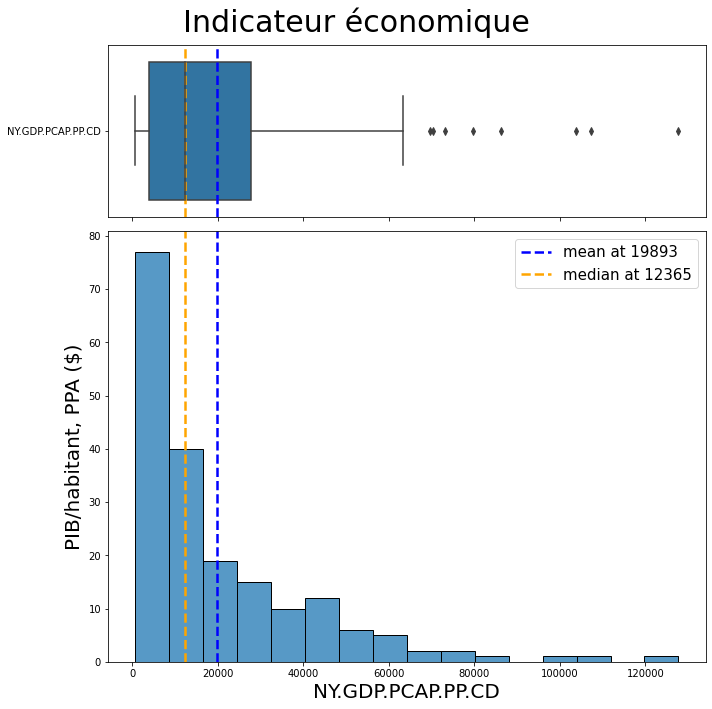

In [175]:
# Indicateur économique : NY.GDP.PCAP.PP.CD

df_eco =df_lyear[df_lyear['Indicator Code'] == 'NY.GDP.PCAP.PP.CD']

#f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw= {"height_ratios": (0.2, 1)})
f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw= {"height_ratios": (0.4, 1)}, figsize=(10,10))
#f, ax_box=plt
#plt.subplot(7, 2, 1)
g=sns.boxplot(x=df_eco['2015'], y=df_eco['Indicator Code'], ax=ax_box)
#g._legend.remove()
#plt.title('Indicateur économique')
ax_box.set_ylabel('')
ax_box.set_xlabel('')

#plt.legend([],[], frameon=False)

stats = [round(mean_ec), round( med_ec)]
names = ['mean', 'median']
colors = ['blue', 'orange']
for stat, color in zip(stats, colors):
    #plt.axvline(x=stats, linestyle='--', linewidth=2.5, label='{0} at {1}'.format(name, stat), c=color)
    ax_box.axvline(x=stat, linestyle='--', linewidth=2.5, c=color)   
        
# #plt.subplot(7, 2, 2)
sns.histplot(df_eco['2015'], ax=ax_hist)  #, xerr = "std_ec"
# #plt.title('Indicateur économique')
ax_hist.set_xlabel('NY.GDP.PCAP.PP.CD', fontsize=20)
ax_hist.set_ylabel('PIB/habitant, PPA ($)', fontsize=20)
# #for stat, name, color in zip(stats, names, colors):
for stat, color, legend in zip(stats, colors, names):
#     #plt.axvline(x=stats, linestyle='--', linewidth=2.5, label='{0} at {1}'.format(name, stat), c=color)
     ax_hist.axvline(x=stat, linestyle='--', linewidth=2.5, c=color,  label='{0} at {1}'.format(legend, stat))  
     ax_hist.legend(fontsize=15)
        
plt.suptitle('Indicateur économique',size=30)

#plt.savefig('Indicateurs_ec_recent_value', dpi=200, bbox_inches='tight') 



#plt.title('Indicateur économique')
#plt.legend(loc='best')        
plt.tight_layout() 


# Autre methode pour mean (std). ca fonctionne pas avec sns.hist
#qual = qual['insert'] 
#qual.plot(kind = "barh", y = "mean", legend = False,  
#          xerr = "std", title = "Quality", color='green')

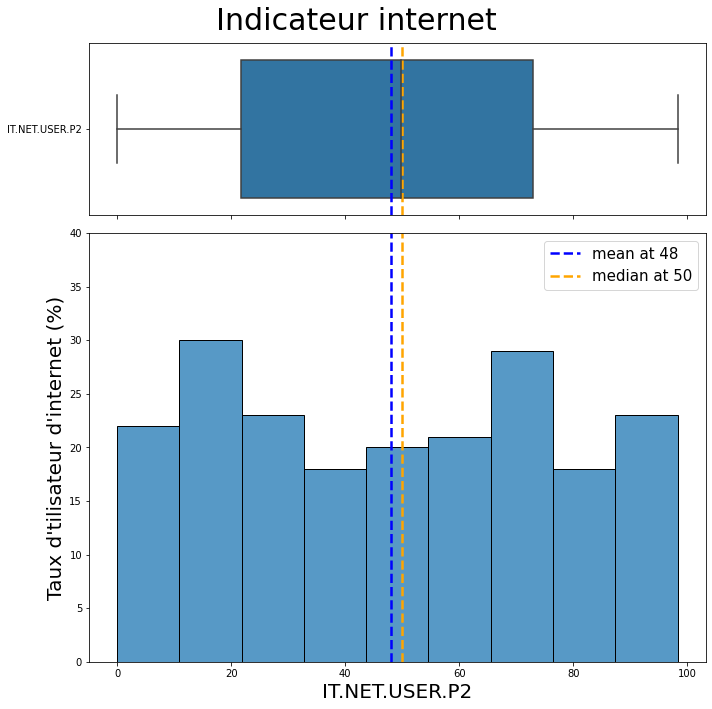

In [74]:
# Indicateur numériquec internet : IT.NET.USER.P2

df_net =df_lyear[df_lyear['Indicator Code'] == 'IT.NET.USER.P2']
#sns.set(font_scale=1.4)
#sns.set()
#f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw= {"height_ratios": (0.2, 1)})
f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw= {"height_ratios": (0.4, 1)}, figsize=(10,10))
#f, ax_box=plt
#plt.subplot(7, 2, 1)
g=sns.boxplot(x=df_net['2015'], y=df_net['Indicator Code'], ax=ax_box)#, width=0.5)
#g._legend.remove()
#plt.title('Indicateur économique')
ax_box.set_ylabel('')
ax_box.set_xlabel('')

#plt.legend([],[], frameon=False)

stats = [round(mean_com_net), round(med_com_net)]
names = ['mean', 'median']
colors = ['blue', 'orange']
for stat, color in zip(stats, colors):
    #plt.axvline(x=stats, linestyle='--', linewidth=2.5, label='{0} at {1}'.format(name, stat), c=color)
    ax_box.axvline(x=stat, linestyle='--', linewidth=2.5, c=color)   
        
# #plt.subplot(7, 2, 2)
sns.histplot(df_net['2015'], ax=ax_hist)  #, ax=ax_hist
# #plt.title('Indicateur économique')
ax_hist.set_ylim(0, 40)
ax_hist.set_xlabel('IT.NET.USER.P2', fontsize=20)
ax_hist.set_ylabel("Taux d'tilisateur d'internet (%)", fontsize=20)
# #for stat, name, color in zip(stats, names, colors):
for stat, color, legend in zip(stats, colors, names):
#     #plt.axvline(x=stats, linestyle='--', linewidth=2.5, label='{0} at {1}'.format(name, stat), c=color)
     ax_hist.axvline(x=stat, linestyle='--', linewidth=2.5, c=color,  label='{0} at {1}'.format(legend, stat))  
     ax_hist.legend(fontsize=15)
        
plt.suptitle('Indicateur internet',size=30)

plt.savefig('Indicateurs_net_recent_value', dpi=200, bbox_inches='tight') 

#plt.title('Indicateur économique')
#plt.legend(loc='best')        
plt.tight_layout() 

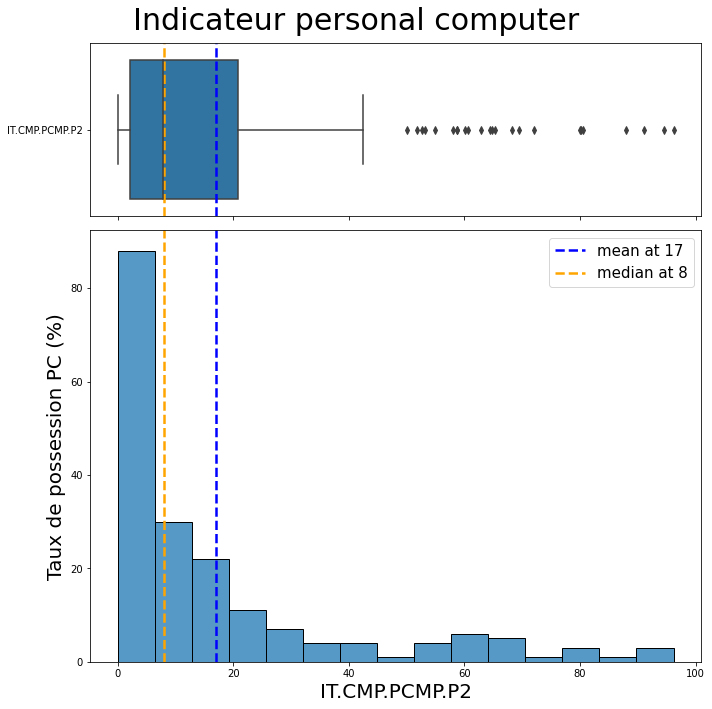

In [176]:
# Indicateur numériquec computer pc :  : IT.CMP.PCMP.P2

df_pc =df_lyear[df_lyear['Indicator Code'] == 'IT.CMP.PCMP.P2']

#f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw= {"height_ratios": (0.2, 1)})
f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw= {"height_ratios": (0.4, 1)}, figsize=(10,10))
#f, ax_box=plt
#plt.subplot(7, 2, 1)
g=sns.boxplot(x=df_pc['2015'], y=df_pc['Indicator Code'], ax=ax_box)#, width=0.5)
#g._legend.remove()
#plt.title('Indicateur économique')
ax_box.set_ylabel('')
ax_box.set_xlabel('')

#plt.legend([],[], frameon=False)

stats = [round(mean_com_pc), round(med_com_pc)]
names = ['mean', 'median']
colors = ['blue', 'orange']
for stat, color in zip(stats, colors):
    #plt.axvline(x=stats, linestyle='--', linewidth=2.5, label='{0} at {1}'.format(name, stat), c=color)
    ax_box.axvline(x=stat, linestyle='--', linewidth=2.5, c=color)   
        
# #plt.subplot(7, 2, 2)
sns.histplot(df_pc['2015'], ax=ax_hist)  #, ax=ax_hist
# #plt.title('Indicateur économique')
#ax_hist.set_ylim(0, 40)
ax_hist.set_xlabel('IT.CMP.PCMP.P2', fontsize=20)
ax_hist.set_ylabel("Taux de possession PC (%)", fontsize=20 )
# #for stat, name, color in zip(stats, names, colors):
for stat, color, legend in zip(stats, colors, names):
#     #plt.axvline(x=stats, linestyle='--', linewidth=2.5, label='{0} at {1}'.format(name, stat), c=color)
     ax_hist.axvline(x=stat, linestyle='--', linewidth=2.5, c=color,  label='{0} at {1}'.format(legend, stat))  
     ax_hist.legend(fontsize=15)
        
plt.suptitle('Indicateur personal computer',size=30)

plt.savefig('Indicateurs_pc_recent_value', dpi=200, bbox_inches='tight') 

#plt.title('Indicateur économique')
#plt.legend(loc='best')        
plt.tight_layout() 

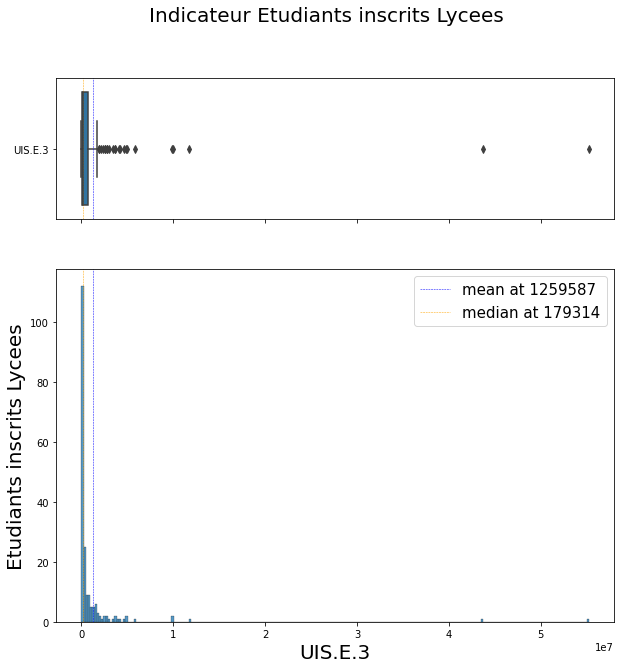

In [87]:
# Indicateur éducatifs : Etudiants inscrits aux Lycees UIS.E.3

df_etud_usec = df_lyear[df_lyear ['Indicator Code'] == 'UIS.E.3']

#f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw= {"height_ratios": (0.2, 1)})
f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw= {"height_ratios": (0.4, 1)}, figsize=(10,10))

g=sns.boxplot(x=df_etud_usec['2015'], y=df_etud_usec['Indicator Code'], ax=ax_box)#, width=0.5) , showfliers=False
#g._legend.remove()
#plt.title('Indicateur économique')
ax_box.set_ylabel('')
ax_box.set_xlabel('')

#plt.legend([],[], frameon=False)

stats = [round(mean_etud_usec), round( med_etud_usec)]
names = ['mean', 'median']
colors = ['blue', 'orange']
for stat, color in zip(stats, colors):
    #plt.axvline(x=stats, linestyle='--', linewidth=2.5, label='{0} at {1}'.format(name, stat), c=color)
    ax_box.axvline(x=stat, linestyle='--', linewidth=0.5, c=color)   
        

sns.histplot(df_etud_usec['2015'], ax=ax_hist)  #, ax=ax_hist

#ax_hist.xlim(0,3e7)

ax_hist.set_xlabel('UIS.E.3', fontsize=20)
ax_hist.set_ylabel('Etudiants inscrits Lycees', fontsize=20)

# #for stat, name, color in zip(stats, names, colors):
for stat, color, legend in zip(stats, colors, names):
#     #plt.axvline(x=stats, linestyle='--', linewidth=2.5, label='{0} at {1}'.format(name, stat), c=color)
     ax_hist.axvline(x=stat, linestyle='--', linewidth=0.5, c=color,  label='{0} at {1}'.format(legend, stat))  
     ax_hist.legend(fontsize=15)
        
plt.suptitle('Indicateur Etudiants inscrits Lycees',size=20)

plt.savefig('Indicateurs_stud_usec_recent_value', dpi=200, bbox_inches='tight') 
#plt.legend(loc='best')        
#plt.tight_layout() 

In [201]:
# df_lyear_cop=df_lyear.copy()
# df_lyear_cop.loc[df_lyear['Indicator Code'] == 'UIS.E.3']
# df_lyear_cop.loc[df_lyear_cop['Country Name']=='Albania']
# df_lyear_cop['Indicator Code'=='UIS.E.3']
# df_lyear_cop.loc[(df_lyear_cop['Indicator Code'] == 'UIS.E.3' & , df_lyear_cop['Indicator Code'] == 'SP.SEC.UTOT.IN',  'c2'] = -1

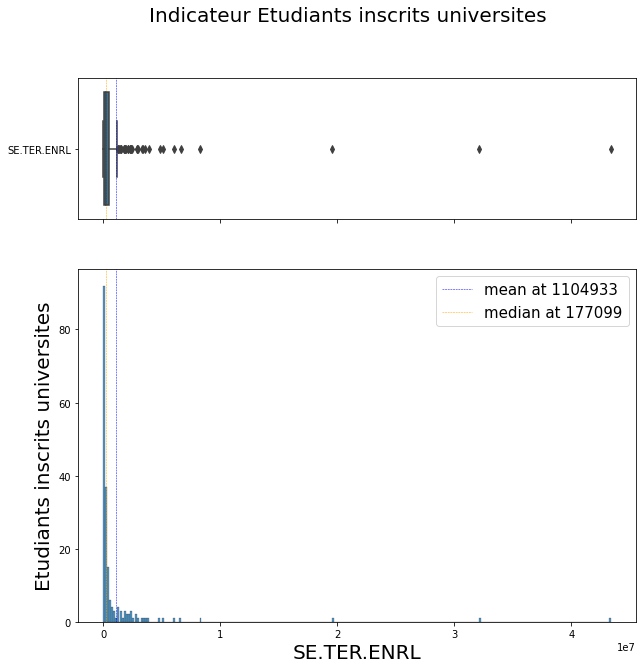

In [86]:
# Indicateur éducatifs : Etudiants inscrits aux universites

df_etud_univ = df_lyear[df_lyear ['Indicator Code'] == 'SE.TER.ENRL']

#f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw= {"height_ratios": (0.2, 1)})
f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw= {"height_ratios": (0.4, 1)}, figsize=(10,10))

g=sns.boxplot(x=df_etud_univ['2015'], y=df_etud_univ['Indicator Code'], ax=ax_box)#, width=0.5) , showfliers=False
#g._legend.remove()
#plt.title('Indicateur économique')
ax_box.set_ylabel('')
ax_box.set_xlabel('')

#plt.legend([],[], frameon=False)

stats = [round(mean_etud_univ), round( med_etud_univ)]
names = ['mean', 'median']
colors = ['blue', 'orange']
for stat, color in zip(stats, colors):
    #plt.axvline(x=stats, linestyle='--', linewidth=2.5, label='{0} at {1}'.format(name, stat), c=color)
    ax_box.axvline(x=stat, linestyle='--', linewidth=0.5, c=color)   
        

sns.histplot(df_etud_univ['2015'], ax=ax_hist)  #, ax=ax_hist

#ax_hist.xlim(0,3e7)

ax_hist.set_xlabel('SE.TER.ENRL',fontsize=20)
ax_hist.set_ylabel('Etudiants inscrits universites', fontsize=20)

# #for stat, name, color in zip(stats, names, colors):
for stat, color, legend in zip(stats, colors, names):
#     #plt.axvline(x=stats, linestyle='--', linewidth=2.5, label='{0} at {1}'.format(name, stat), c=color)
     ax_hist.axvline(x=stat, linestyle='--', linewidth=0.5, c=color,  label='{0} at {1}'.format(legend, stat))  
     ax_hist.legend(fontsize=15)
        
plt.suptitle('Indicateur Etudiants inscrits universites',size=20)

plt.savefig('Indicateurs_stud_univ_recent_value', dpi=200, bbox_inches='tight') 
#plt.legend(loc='best')        
#plt.tight_layout() 

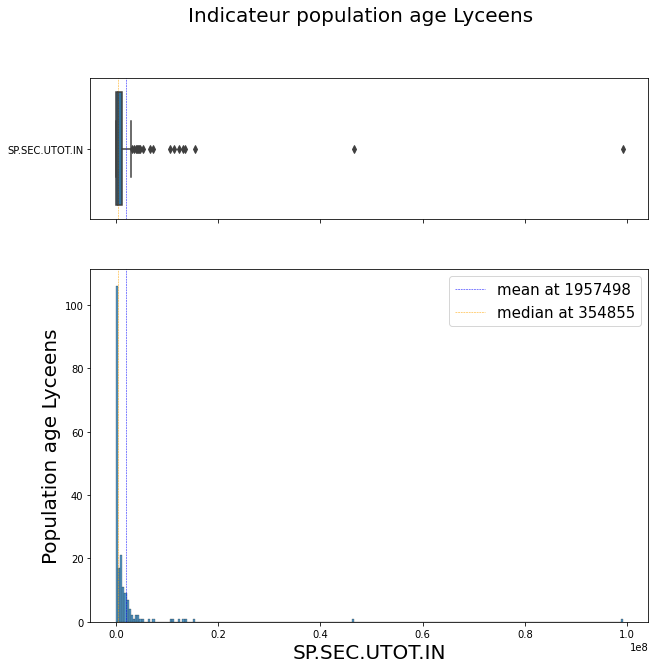

In [82]:
# Indicateur Population ayant age des lyceens SP.SEC.UTOT.IN

df_pop_usec = df_lyear[df_lyear ['Indicator Code'] == 'SP.SEC.UTOT.IN']

#f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw= {"height_ratios": (0.2, 1)})
f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw= {"height_ratios": (0.4, 1)}, figsize=(10,10))

g=sns.boxplot(x=df_pop_usec['2015'], y=df_pop_usec['Indicator Code'], ax=ax_box)#, width=0.5) , showfliers=False
#g._legend.remove()
#plt.title('Indicateur économique')
ax_box.set_ylabel('')
ax_box.set_xlabel('')

#plt.legend([],[], frameon=False)

stats = [round(mean_pop_usec), round( med_pop_usec)]
names = ['mean', 'median']
colors = ['blue', 'orange']
for stat, color in zip(stats, colors):
    #plt.axvline(x=stats, linestyle='--', linewidth=2.5, label='{0} at {1}'.format(name, stat), c=color)
    ax_box.axvline(x=stat, linestyle='--', linewidth=0.5, c=color)   
        

sns.histplot(df_pop_usec['2015'], ax=ax_hist)  #, ax=ax_hist

#ax_hist.xlim(0,3e7)

ax_hist.set_xlabel('SP.SEC.UTOT.IN', fontsize=20)
ax_hist.set_ylabel('Population age Lyceens', fontsize=20)

# #for stat, name, color in zip(stats, names, colors):
for stat, color, legend in zip(stats, colors, names):
#     #plt.axvline(x=stats, linestyle='--', linewidth=2.5, label='{0} at {1}'.format(name, stat), c=color)
     ax_hist.axvline(x=stat, linestyle='--', linewidth=0.5, c=color,  label='{0} at {1}'.format(legend, stat))  
     ax_hist.legend(fontsize=15)
        
plt.suptitle('Indicateur population age Lyceens',size=20)

plt.savefig('Indicateurs_pop_usec_recent_value', dpi=200, bbox_inches='tight') 
#plt.legend(loc='best')        
#plt.tight_layout() 

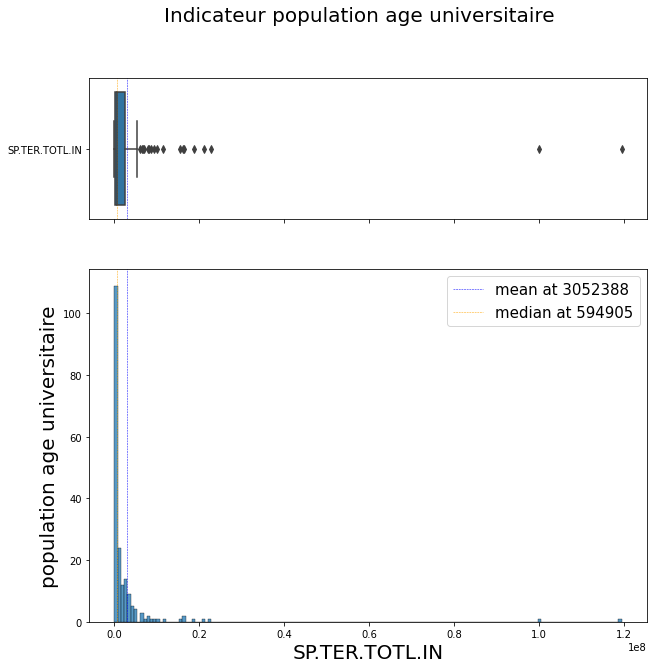

In [88]:
# Indicateur Population ayant age univesitires SP.TER.TOTL.IN

df_pop_univ = df_lyear[df_lyear ['Indicator Code'] == 'SP.TER.TOTL.IN']

#f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw= {"height_ratios": (0.2, 1)})
f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw= {"height_ratios": (0.4, 1)}, figsize=(10,10))

g=sns.boxplot(x=df_pop_univ['2015'], y=df_pop_univ['Indicator Code'], ax=ax_box)#, width=0.5) , showfliers=False
#g._legend.remove()
#plt.title('Indicateur économique')
ax_box.set_ylabel('')
ax_box.set_xlabel('')

#plt.legend([],[], frameon=False)

stats = [round(mean_pop_univ), round( med_pop_univ)]
names = ['mean', 'median']
colors = ['blue', 'orange']
for stat, color in zip(stats, colors):
    #plt.axvline(x=stats, linestyle='--', linewidth=2.5, label='{0} at {1}'.format(name, stat), c=color)
    ax_box.axvline(x=stat, linestyle='--', linewidth=0.5, c=color)   
        

sns.histplot(df_pop_univ['2015'], ax=ax_hist)  #, ax=ax_hist

#ax_hist.xlim(0,3e7)

ax_hist.set_xlabel('SP.TER.TOTL.IN',fontsize=20)
ax_hist.set_ylabel('population age universitaire',fontsize=20)

# #for stat, name, color in zip(stats, names, colors):
for stat, color, legend in zip(stats, colors, names):
#     #plt.axvline(x=stats, linestyle='--', linewidth=2.5, label='{0} at {1}'.format(name, stat), c=color)
     ax_hist.axvline(x=stat, linestyle='--', linewidth=0.5, c=color,  label='{0} at {1}'.format(legend, stat))  
     ax_hist.legend(fontsize=15)
        
plt.suptitle('Indicateur population age universitaire',size=20)

plt.savefig('Indicateurs_pop_univ_recent_value', dpi=200, bbox_inches='tight') 
#plt.legend(loc='best')        
#plt.tight_layout() 

In [ ]:
# Graphiques statistiques sur les 7 indicateurs Ensembel avec median et moyenne sur graphe to do later
#plt.figure(figsize=(20, 40))

#plt.subplot(7, 1, 1)



---------------------------------------------------------------------------------------------------------------------

### Pour les indicateurs population et educatif, la valeur des outliers des pays a tres forte population (Inde, chine) ecrase les autres

---------------------------------------------------------------------------------------------------------------------

## Score d'attractivite de tous les pays pour le classement

### Reshape dataframe pour creer des scores

In [89]:
dft_resh_n=df_lyear.pivot(index=["Country Name", "Country Code"],columns="Indicator Name", values="2015").reset_index()


## pourquoi il y a des valeurs manquantes!!!  ca vient de la suppression des lignes vides en filtrage 


In [90]:
dft_resh_n

Indicator Name,Country Name,Country Code,"Enrolment in tertiary education, all programmes, both sexes (number)","Enrolment in upper secondary education, both sexes (number)","GDP per capita, PPP (current international $)",Internet users (per 100 people),Personal computers (per 100 people),"Population of the official age for tertiary education, both sexes (number)","Population of the official age for upper secondary education, both sexes (number)","Population, total"
0,Afghanistan,AFG,2.628740e+05,9.687690e+05,1864.973641,8.260000,0.390148,3199607.0,2305137.0,3.373649e+07
1,Albania,ALB,1.605270e+05,1.519370e+05,11449.094589,63.252933,4.593538,276247.0,156541.0,2.880703e+06
2,Algeria,DZA,1.289474e+06,1.332584e+06,14643.343064,38.200000,1.030597,3492401.0,1796069.0,3.987153e+07
3,American Samoa,ASM,1.607000e+03,NaN,NaN,NaN,NaN,NaN,NaN,5.553700e+04
4,Andorra,AND,5.010000e+02,1.288000e+03,NaN,96.910000,NaN,NaN,NaN,7.801400e+04
5,Angola,AGO,2.210370e+05,3.035680e+05,6648.124016,12.400000,0.646019,2374694.0,1674971.0,2.785930e+07
6,Antigua and Barbuda,ATG,1.792000e+03,2.615000e+03,21503.952551,70.000000,20.966370,7935.0,3171.0,9.992300e+04
7,Argentina,ARG,2.869450e+06,1.722700e+06,20379.779854,68.043064,9.056130,3450626.0,2067256.0,4.341776e+07
8,Armenia,ARM,1.076650e+05,1.033850e+05,8744.501489,59.102378,9.851017,242984.0,107475.0,2.916950e+06
9,Aruba,ABW,1.166000e+03,4.841000e+03,35973.780510,88.661227,9.917683,7634.0,4492.0,1.043410e+05


### Renommer les colonnes 

In [91]:
#dft_resh_4ind=dft_resh[['Country Name','Enrolment in tertiary education, all programmes, both sexes (number)','Enrolment in upper secondary education, both sexes (number)','GDP, PPP (current international $)','Internet users (per 100 people)']]
dft_resh_n.columns=['Country', 'Code','Nb_studs_tert','Nb_studs_usec', 'Purch Power($)','Int_users(/100)', 'PC(/100)','pop_age_tert', 'pop_age_usec','Total_population']

dft_resh_n

# methode rename :
# df=df.rename({'oldcol': new, ...}, axis=1)
# 

,Country,Code,Nb_studs_tert,Nb_studs_usec,Purch Power($),Int_users(/100),PC(/100),pop_age_tert,pop_age_usec,Total_population
0,Afghanistan,AFG,2.628740e+05,9.687690e+05,1864.973641,8.260000,0.390148,3199607.0,2305137.0,3.373649e+07
1,Albania,ALB,1.605270e+05,1.519370e+05,11449.094589,63.252933,4.593538,276247.0,156541.0,2.880703e+06
2,Algeria,DZA,1.289474e+06,1.332584e+06,14643.343064,38.200000,1.030597,3492401.0,1796069.0,3.987153e+07
3,American Samoa,ASM,1.607000e+03,NaN,NaN,NaN,NaN,NaN,NaN,5.553700e+04
4,Andorra,AND,5.010000e+02,1.288000e+03,NaN,96.910000,NaN,NaN,NaN,7.801400e+04
5,Angola,AGO,2.210370e+05,3.035680e+05,6648.124016,12.400000,0.646019,2374694.0,1674971.0,2.785930e+07
6,Antigua and Barbuda,ATG,1.792000e+03,2.615000e+03,21503.952551,70.000000,20.966370,7935.0,3171.0,9.992300e+04
7,Argentina,ARG,2.869450e+06,1.722700e+06,20379.779854,68.043064,9.056130,3450626.0,2067256.0,4.341776e+07
8,Armenia,ARM,1.076650e+05,1.033850e+05,8744.501489,59.102378,9.851017,242984.0,107475.0,2.916950e+06
9,Aruba,ABW,1.166000e+03,4.841000e+03,35973.780510,88.661227,9.917683,7634.0,4492.0,1.043410e+05


In [92]:
# rearanging colonne
dft_resh_n=dft_resh_n[['Country', 'Code','Int_users(/100)','PC(/100)','Purch Power($)','pop_age_usec', 'Nb_studs_usec','pop_age_tert','Nb_studs_tert','Total_population']]
dft_resh_n
                  

,Country,Code,Int_users(/100),PC(/100),Purch Power($),pop_age_usec,Nb_studs_usec,pop_age_tert,Nb_studs_tert,Total_population
0,Afghanistan,AFG,8.260000,0.390148,1864.973641,2305137.0,9.687690e+05,3199607.0,2.628740e+05,3.373649e+07
1,Albania,ALB,63.252933,4.593538,11449.094589,156541.0,1.519370e+05,276247.0,1.605270e+05,2.880703e+06
2,Algeria,DZA,38.200000,1.030597,14643.343064,1796069.0,1.332584e+06,3492401.0,1.289474e+06,3.987153e+07
3,American Samoa,ASM,NaN,NaN,NaN,NaN,NaN,NaN,1.607000e+03,5.553700e+04
4,Andorra,AND,96.910000,NaN,NaN,NaN,1.288000e+03,NaN,5.010000e+02,7.801400e+04
5,Angola,AGO,12.400000,0.646019,6648.124016,1674971.0,3.035680e+05,2374694.0,2.210370e+05,2.785930e+07
6,Antigua and Barbuda,ATG,70.000000,20.966370,21503.952551,3171.0,2.615000e+03,7935.0,1.792000e+03,9.992300e+04
7,Argentina,ARG,68.043064,9.056130,20379.779854,2067256.0,1.722700e+06,3450626.0,2.869450e+06,4.341776e+07
8,Armenia,ARM,59.102378,9.851017,8744.501489,107475.0,1.033850e+05,242984.0,1.076650e+05,2.916950e+06
9,Aruba,ABW,88.661227,9.917683,35973.780510,4492.0,4.841000e+03,7634.0,1.166000e+03,1.043410e+05


### Valeurs manquantes 

In [93]:
# valeurs manquantes 

# Liste des pays avec au moins un indicateur manquant

indc_na = dft_resh_n.notnull().sum(axis=1)
indc_na

index_indc_na = indc_na[indc_na < 10].index
print("-------------------------------------------------\n")
print(f"nombre de pays à retirer : {len(index_indc_na)} \n")
print("-------------------------------------------------\n")
df_count_rem = dft_resh_n.loc[index_indc_na, :].sort_values(by='Total_population', ascending=False)
df_count_rem


-------------------------------------------------

nombre de pays à retirer : 39 

-------------------------------------------------



,Country,Code,Int_users(/100),PC(/100),Purch Power($),pop_age_usec,Nb_studs_usec,pop_age_tert,Nb_studs_tert,Total_population
205,Vietnam,VNM,43.500000,9.467318,6046.738259,4120025.0,NaN,8554144.0,2466643.0,91713300.0
99,"Korea, Dem. People’s Rep.",PRK,0.000000,NaN,NaN,1161259.0,1245086.0,2014830.0,565350.0,25243917.0
183,Syrian Arab Republic,SYR,29.979797,9.201759,NaN,1313969.0,411295.0,1754600.0,772877.0,18734987.0
96,Kazakhstan,KAZ,72.900000,NaN,25096.677605,454909.0,469946.0,1430092.0,658413.0,17544126.0
209,Zambia,ZMB,21.000000,1.142108,3869.976869,1052490.0,NaN,1497656.0,56680.0,16100587.0
170,Somalia,SOM,1.760000,0.885798,NaN,990469.0,47015.0,966359.0,NaN,13908129.0
48,Cuba,CUB,37.305097,5.577020,NaN,417410.0,416591.0,720535.0,261413.0,11461432.0
172,South Sudan,SSD,NaN,NaN,2029.745312,1124926.0,NaN,1138509.0,NaN,11296173.0
80,Haiti,HTI,12.197700,5.255571,1761.747986,897618.0,NaN,1051206.0,NaN,10711061.0
165,Sierra Leone,SLE,6.344422,NaN,1404.053890,567690.0,140455.0,584527.0,9041.0,7237025.0


-------------------------------------------------------------------------------------------------------------------------------

##### Il y a 31 pays avec au moins une valeur manquante d'indicateur. la plupart sont des petits pays avec faible population. A l'exception de : "Vietnam, Korea nord, Syria"  mais avec faible PIB ou valeur aussi manquante. Par contre, Singapore pays interessant avec son PIB, comm mais faible populatio est ecarte aussi. On les supprime

-------------------------------------------------------------------------------------------------------------------------------

In [94]:
#dft_resh.dropna(thresh=10, inplace=True)
dft_resh=dft_resh_n.dropna(thresh=10)
print(f'Nombre de pays restant : {dft_resh.shape[0]}')
dft_resh.info()
#dft_resh_clean=

Nombre de pays restant : 172
<class 'pandas.core.frame.DataFrame'>
Int64Index: 172 entries, 0 to 210
Data columns (total 10 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Country           172 non-null    object 
 1   Code              172 non-null    object 
 2   Int_users(/100)   172 non-null    float64
 3   PC(/100)          172 non-null    float64
 4   Purch Power($)    172 non-null    float64
 5   pop_age_usec      172 non-null    float64
 6   Nb_studs_usec     172 non-null    float64
 7   pop_age_tert      172 non-null    float64
 8   Nb_studs_tert     172 non-null    float64
 9   Total_population  172 non-null    float64
dtypes: float64(8), object(2)
memory usage: 14.8+ KB


In [95]:
#dft_resh_n.sort_values(by=['Purchasing Power($)'], ascending=False)
dft_resh

,Country,Code,Int_users(/100),PC(/100),Purch Power($),pop_age_usec,Nb_studs_usec,pop_age_tert,Nb_studs_tert,Total_population
0,Afghanistan,AFG,8.260000,0.390148,1864.973641,2305137.0,9.687690e+05,3199607.0,2.628740e+05,3.373649e+07
1,Albania,ALB,63.252933,4.593538,11449.094589,156541.0,1.519370e+05,276247.0,1.605270e+05,2.880703e+06
2,Algeria,DZA,38.200000,1.030597,14643.343064,1796069.0,1.332584e+06,3492401.0,1.289474e+06,3.987153e+07
5,Angola,AGO,12.400000,0.646019,6648.124016,1674971.0,3.035680e+05,2374694.0,2.210370e+05,2.785930e+07
6,Antigua and Barbuda,ATG,70.000000,20.966370,21503.952551,3171.0,2.615000e+03,7935.0,1.792000e+03,9.992300e+04
7,Argentina,ARG,68.043064,9.056130,20379.779854,2067256.0,1.722700e+06,3450626.0,2.869450e+06,4.341776e+07
8,Armenia,ARM,59.102378,9.851017,8744.501489,107475.0,1.033850e+05,242984.0,1.076650e+05,2.916950e+06
9,Aruba,ABW,88.661227,9.917683,35973.780510,4492.0,4.841000e+03,7634.0,1.166000e+03,1.043410e+05
10,Australia,AUS,84.560519,60.140967,46475.927752,586024.0,1.104162e+06,1602152.0,1.453521e+06,2.378934e+07
11,Austria,AUT,83.940142,60.641342,50087.731743,358901.0,3.631876e+05,522405.0,4.259717e+05,8.633169e+06


# matrice correlation entre variables

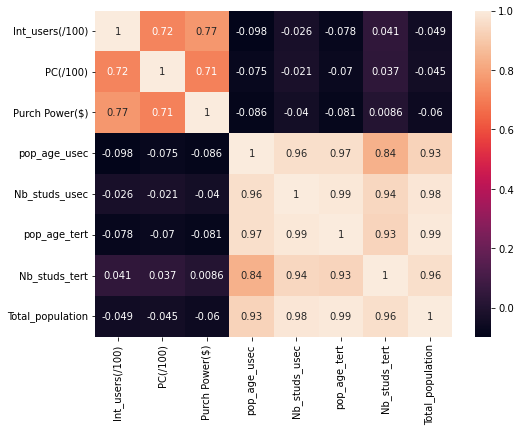

In [96]:
# matrice de correlation: pour voir si tous les indicateurs sont utiles
# by seaborn

corr_df = dft_resh.corr(method='pearson')

plt.figure(figsize=(8, 6))
sns.heatmap(corr_df, annot=True)
plt.show()

In [97]:
print("il y a une forte correlation entre la population qui a l'age theorique d'etre a la fac et au lycee et celles inscrites donc pas la peine de mettre les 2??")

il y a une forte correlation entre la population qui a l'age theorique d'etre a la fac et au lycee et celles inscrites donc pas la peine de mettre les 2??


### Normalisation des indicateurs

In [98]:
# creation d'une copie de df
dft_resh_c = dft_resh.copy()

In [99]:
# score internet users
# normaliser par rapport a la valeur max

dft_resh_c['SCORE_INT']= dft_resh_c['Int_users(/100)'] / dft_resh_c['Int_users(/100)'].max()
dft_resh_c

,Country,Code,Int_users(/100),PC(/100),Purch Power($),pop_age_usec,Nb_studs_usec,pop_age_tert,Nb_studs_tert,Total_population,SCORE_INT
0,Afghanistan,AFG,8.260000,0.390148,1864.973641,2305137.0,9.687690e+05,3199607.0,2.628740e+05,3.373649e+07,0.084008
1,Albania,ALB,63.252933,4.593538,11449.094589,156541.0,1.519370e+05,276247.0,1.605270e+05,2.880703e+06,0.643314
2,Algeria,DZA,38.200000,1.030597,14643.343064,1796069.0,1.332584e+06,3492401.0,1.289474e+06,3.987153e+07,0.388513
5,Angola,AGO,12.400000,0.646019,6648.124016,1674971.0,3.035680e+05,2374694.0,2.210370e+05,2.785930e+07,0.126114
6,Antigua and Barbuda,ATG,70.000000,20.966370,21503.952551,3171.0,2.615000e+03,7935.0,1.792000e+03,9.992300e+04,0.711935
7,Argentina,ARG,68.043064,9.056130,20379.779854,2067256.0,1.722700e+06,3450626.0,2.869450e+06,4.341776e+07,0.692032
8,Armenia,ARM,59.102378,9.851017,8744.501489,107475.0,1.033850e+05,242984.0,1.076650e+05,2.916950e+06,0.601101
9,Aruba,ABW,88.661227,9.917683,35973.780510,4492.0,4.841000e+03,7634.0,1.166000e+03,1.043410e+05,0.901729
10,Australia,AUS,84.560519,60.140967,46475.927752,586024.0,1.104162e+06,1602152.0,1.453521e+06,2.378934e+07,0.860023
11,Austria,AUT,83.940142,60.641342,50087.731743,358901.0,3.631876e+05,522405.0,4.259717e+05,8.633169e+06,0.853713


In [100]:
# Socre personal computer PC
# normaliser par rapport a la valeur max (tous les pays)

dft_resh_c['SCORE_PC']= dft_resh_c['PC(/100)'] / dft_resh_c['PC(/100)'].max()
dft_resh_c

,Country,Code,Int_users(/100),PC(/100),Purch Power($),pop_age_usec,Nb_studs_usec,pop_age_tert,Nb_studs_tert,Total_population,SCORE_INT,SCORE_PC
0,Afghanistan,AFG,8.260000,0.390148,1864.973641,2305137.0,9.687690e+05,3199607.0,2.628740e+05,3.373649e+07,0.084008,0.004057
1,Albania,ALB,63.252933,4.593538,11449.094589,156541.0,1.519370e+05,276247.0,1.605270e+05,2.880703e+06,0.643314,0.047764
2,Algeria,DZA,38.200000,1.030597,14643.343064,1796069.0,1.332584e+06,3492401.0,1.289474e+06,3.987153e+07,0.388513,0.010716
5,Angola,AGO,12.400000,0.646019,6648.124016,1674971.0,3.035680e+05,2374694.0,2.210370e+05,2.785930e+07,0.126114,0.006717
6,Antigua and Barbuda,ATG,70.000000,20.966370,21503.952551,3171.0,2.615000e+03,7935.0,1.792000e+03,9.992300e+04,0.711935,0.218012
7,Argentina,ARG,68.043064,9.056130,20379.779854,2067256.0,1.722700e+06,3450626.0,2.869450e+06,4.341776e+07,0.692032,0.094167
8,Armenia,ARM,59.102378,9.851017,8744.501489,107475.0,1.033850e+05,242984.0,1.076650e+05,2.916950e+06,0.601101,0.102433
9,Aruba,ABW,88.661227,9.917683,35973.780510,4492.0,4.841000e+03,7634.0,1.166000e+03,1.043410e+05,0.901729,0.103126
10,Australia,AUS,84.560519,60.140967,46475.927752,586024.0,1.104162e+06,1602152.0,1.453521e+06,2.378934e+07,0.860023,0.625357
11,Austria,AUT,83.940142,60.641342,50087.731743,358901.0,3.631876e+05,522405.0,4.259717e+05,8.633169e+06,0.853713,0.630560


In [101]:
# score pouvoir d'achat 
# normaliser par rapport a la valeur max

dft_resh_c['SCORE_ECON']= dft_resh_c['Purch Power($)'] / dft_resh_c['Purch Power($)'].max()

dft_resh_c.sort_values(by=['Purch Power($)'],ascending=False)
#dft_resh_country['Purchasing Power($)'].sort_values(ascending=False)
#dft_resh_c['Purch Power($)'].max()
#dft_resh_c['Purch Power($)']

# Quatar>macao china>luxembourg ppA>100000!  min central africain rep avec 668

,Country,Code,Int_users(/100),PC(/100),Purch Power($),pop_age_usec,Nb_studs_usec,pop_age_tert,Nb_studs_tert,Total_population,SCORE_INT,SCORE_PC,SCORE_ECON
154,Qatar,QAT,92.884826,16.225680,127764.462337,53032.0,4.099100e+04,191940.0,2.786600e+04,2.481539e+06,0.944685,0.168718,1.000000
113,"Macao SAR, China",MAC,77.600132,40.016006,107245.639439,17721.0,1.665500e+04,40703.0,3.077100e+04,6.009420e+05,0.789232,0.416094,0.839401
112,Luxembourg,LUX,97.334100,68.209751,103732.639291,26920.0,2.440900e+04,34114.0,6.085000e+03,5.696040e+05,0.989936,0.709257,0.811905
27,Brunei Darussalam,BRN,71.200000,8.971902,79593.280721,35499.0,3.409100e+04,35228.0,1.086600e+04,4.175420e+05,0.724139,0.093291,0.622969
102,Kuwait,KWT,77.523269,26.128831,73059.562442,131810.0,1.086810e+05,267631.0,7.178600e+04,3.935794e+06,0.788450,0.271692,0.571830
198,United Arab Emirates,ARE,90.500000,28.714185,70391.220127,244592.0,1.578210e+05,394858.0,1.566130e+05,9.154302e+06,0.920430,0.298575,0.550945
89,Ireland,IRL,80.122400,58.682891,69627.540930,106850.0,1.509050e+05,256192.0,2.146320e+05,4.676835e+06,0.814885,0.610195,0.544968
182,Switzerland,CHE,87.479056,96.170657,63291.538276,360619.0,3.509270e+05,510558.0,2.944500e+05,8.282396e+06,0.889705,1.000000,0.495377
142,Norway,NOR,96.810300,62.775903,62066.808188,198378.0,2.498820e+05,349731.0,2.682310e+05,5.188607e+06,0.984609,0.652755,0.485791
159,San Marino,SMR,49.600000,80.554367,60145.460932,1628.0,1.458000e+03,1481.0,8.720000e+02,3.296000e+04,0.504457,0.837619,0.470753


### Pour la population et le nombre des etudiants : 
- Normalisation par rapport a la population maximale mondiale. On appellera la score d'attractivite SCORE_SYNT_PMAX
- Normalisation par rapport a la popultion totale de chaque pays (plus pertinent vue l'ecart entre les differents pays). On appellera la score d'attractivite SCORE_SYNT_PTOT




In [102]:
# Scoring population etudiant sec et univ  

# normaliser par rapport a la poulation maximale mondiale :

dft_resh_c['SCORE_POP_MAX_SEC'] = dft_resh_c['pop_age_usec'] / dft_resh_c['pop_age_usec'].max()
dft_resh_c['SCORE_POP_MAX_UNIV'] = dft_resh_c['pop_age_tert'] / dft_resh_c['pop_age_tert'].max()


# Normaliser par rapport a la population totale de chaque pays:


dft_resh_c['SCORE_POP_SEC'] = dft_resh_c['pop_age_usec'] / dft_resh_c['Total_population']

dft_resh_c['SCORE_POP_UNIV'] = dft_resh_c['pop_age_tert'] / dft_resh_c['Total_population']


#dft_resh['Pop']=dft_resh_country['SCORE_POP_SEC'] + dft_resh_country['SCORE_POP_UNIV']

#dft_resh['SCORE_POP']=dft_resh_country['Pop']/dft_resh_country['Pop'].max()
dft_resh_c 
#dft_resh.sort_values(by=['SCORE_POP'], ascending=False)

,Country,Code,Int_users(/100),PC(/100),Purch Power($),pop_age_usec,Nb_studs_usec,pop_age_tert,Nb_studs_tert,Total_population,SCORE_INT,SCORE_PC,SCORE_ECON,SCORE_POP_MAX_SEC,SCORE_POP_MAX_UNIV,SCORE_POP_SEC,SCORE_POP_UNIV
0,Afghanistan,AFG,8.260000,0.390148,1864.973641,2305137.0,9.687690e+05,3199607.0,2.628740e+05,3.373649e+07,0.084008,0.004057,0.014597,0.023238,0.026782,0.068328,0.094841
1,Albania,ALB,63.252933,4.593538,11449.094589,156541.0,1.519370e+05,276247.0,1.605270e+05,2.880703e+06,0.643314,0.047764,0.089611,0.001578,0.002312,0.054341,0.095896
2,Algeria,DZA,38.200000,1.030597,14643.343064,1796069.0,1.332584e+06,3492401.0,1.289474e+06,3.987153e+07,0.388513,0.010716,0.114612,0.018106,0.029232,0.045046,0.087591
5,Angola,AGO,12.400000,0.646019,6648.124016,1674971.0,3.035680e+05,2374694.0,2.210370e+05,2.785930e+07,0.126114,0.006717,0.052034,0.016885,0.019877,0.060122,0.085239
6,Antigua and Barbuda,ATG,70.000000,20.966370,21503.952551,3171.0,2.615000e+03,7935.0,1.792000e+03,9.992300e+04,0.711935,0.218012,0.168309,0.000032,0.000066,0.031734,0.079411
7,Argentina,ARG,68.043064,9.056130,20379.779854,2067256.0,1.722700e+06,3450626.0,2.869450e+06,4.341776e+07,0.692032,0.094167,0.159511,0.020840,0.028883,0.047613,0.079475
8,Armenia,ARM,59.102378,9.851017,8744.501489,107475.0,1.033850e+05,242984.0,1.076650e+05,2.916950e+06,0.601101,0.102433,0.068442,0.001083,0.002034,0.036845,0.083301
9,Aruba,ABW,88.661227,9.917683,35973.780510,4492.0,4.841000e+03,7634.0,1.166000e+03,1.043410e+05,0.901729,0.103126,0.281563,0.000045,0.000064,0.043051,0.073164
10,Australia,AUS,84.560519,60.140967,46475.927752,586024.0,1.104162e+06,1602152.0,1.453521e+06,2.378934e+07,0.860023,0.625357,0.363763,0.005908,0.013410,0.024634,0.067347
11,Austria,AUT,83.940142,60.641342,50087.731743,358901.0,3.631876e+05,522405.0,4.259717e+05,8.633169e+06,0.853713,0.630560,0.392032,0.003618,0.004373,0.041572,0.060511


In [103]:
# score nb d'etudiants inscrits lycee et universite

# normaliser par rapport au max de la population des lyceens universitaires mondiales

dft_resh_c['SCORE_STUD_USEC_MAX']= dft_resh_c['Nb_studs_usec'] / dft_resh_c['Nb_studs_usec'].max()
dft_resh_c['SCORE_STUD_UNIV_MAX']= dft_resh_c['Nb_studs_tert'] / dft_resh_c['Nb_studs_tert'].max()

#normaliser par rapport a la population totale de chaque pays (pas convaincant Lux first)

dft_resh_c['SCORE_STUD_USEC']= dft_resh_c['Nb_studs_usec'] / dft_resh_c['Total_population']
dft_resh_c['SCORE_STUD_UNIV']= dft_resh_c['Nb_studs_tert'] / dft_resh_c['Total_population']


# normaliser par rapport a la population des lyceens universitaires de chaque pays

# dft_resh_c['SCORE_STUD_USEC']= dft_resh_c['Nb_studs_usec'] / dft_resh_c['pop_age_usec']
# dft_resh_c['SCORE_STUD_UNIV']= dft_resh_c['Nb_studs_tert'] / dft_resh_c['pop_age_tert']

# dft_resh_c['SCORE_STUD_USEC']= dft_resh_c['Nb_studs_usec'] / dft_resh_c['Nb_studs_usec'].max()
# dft_resh_c['SCORE_STUD_UNIV']= dft_resh_c['Nb_studs_tert'] / dft_resh_c['Nb_studs_tert'].max()

dft_resh_c


,Country,Code,Int_users(/100),PC(/100),Purch Power($),pop_age_usec,Nb_studs_usec,pop_age_tert,Nb_studs_tert,Total_population,...,SCORE_PC,SCORE_ECON,SCORE_POP_MAX_SEC,SCORE_POP_MAX_UNIV,SCORE_POP_SEC,SCORE_POP_UNIV,SCORE_STUD_USEC_MAX,SCORE_STUD_UNIV_MAX,SCORE_STUD_USEC,SCORE_STUD_UNIV
0,Afghanistan,AFG,8.260000,0.390148,1864.973641,2305137.0,9.687690e+05,3199607.0,2.628740e+05,3.373649e+07,...,0.004057,0.014597,0.023238,0.026782,0.068328,0.094841,0.017541,0.006062,0.028716,0.007792
1,Albania,ALB,63.252933,4.593538,11449.094589,156541.0,1.519370e+05,276247.0,1.605270e+05,2.880703e+06,...,0.047764,0.089611,0.001578,0.002312,0.054341,0.095896,0.002751,0.003702,0.052743,0.055725
2,Algeria,DZA,38.200000,1.030597,14643.343064,1796069.0,1.332584e+06,3492401.0,1.289474e+06,3.987153e+07,...,0.010716,0.114612,0.018106,0.029232,0.045046,0.087591,0.024128,0.029734,0.033422,0.032341
5,Angola,AGO,12.400000,0.646019,6648.124016,1674971.0,3.035680e+05,2374694.0,2.210370e+05,2.785930e+07,...,0.006717,0.052034,0.016885,0.019877,0.060122,0.085239,0.005497,0.005097,0.010896,0.007934
6,Antigua and Barbuda,ATG,70.000000,20.966370,21503.952551,3171.0,2.615000e+03,7935.0,1.792000e+03,9.992300e+04,...,0.218012,0.168309,0.000032,0.000066,0.031734,0.079411,0.000047,0.000041,0.026170,0.017934
7,Argentina,ARG,68.043064,9.056130,20379.779854,2067256.0,1.722700e+06,3450626.0,2.869450e+06,4.341776e+07,...,0.094167,0.159511,0.020840,0.028883,0.047613,0.079475,0.031192,0.066166,0.039677,0.066089
8,Armenia,ARM,59.102378,9.851017,8744.501489,107475.0,1.033850e+05,242984.0,1.076650e+05,2.916950e+06,...,0.102433,0.068442,0.001083,0.002034,0.036845,0.083301,0.001872,0.002483,0.035443,0.036910
9,Aruba,ABW,88.661227,9.917683,35973.780510,4492.0,4.841000e+03,7634.0,1.166000e+03,1.043410e+05,...,0.103126,0.281563,0.000045,0.000064,0.043051,0.073164,0.000088,0.000027,0.046396,0.011175
10,Australia,AUS,84.560519,60.140967,46475.927752,586024.0,1.104162e+06,1602152.0,1.453521e+06,2.378934e+07,...,0.625357,0.363763,0.005908,0.013410,0.024634,0.067347,0.019993,0.033516,0.046414,0.061100
11,Austria,AUT,83.940142,60.641342,50087.731743,358901.0,3.631876e+05,522405.0,4.259717e+05,8.633169e+06,...,0.630560,0.392032,0.003618,0.004373,0.041572,0.060511,0.006576,0.009822,0.042069,0.049341


In [104]:
# score synthese (attractivite)

#dft_resh_c['SCORE_SYNT'] = (dft_resh_country['SCORE_ECON'] + dft_resh_country['SCORE_INT'] +  dft_resh_country['SCORE_POP']+(1 - dft_resh_country['SCORE_STUDENTS'])) /4

dft_resh_c['SCORE_SYNT_PMAX']=(dft_resh_c['SCORE_ECON']+ dft_resh_c['SCORE_INT']+dft_resh_c['SCORE_PC'] +dft_resh_c['SCORE_STUD_USEC_MAX']+dft_resh_c['SCORE_STUD_UNIV_MAX']+dft_resh_c['SCORE_POP_MAX_SEC']+dft_resh_c['SCORE_POP_MAX_UNIV'])/7 
                               
                               
                               
#dft_resh_c.sort_values(by=['SCORE_SYNT'], ascending=False).head(10).drop('SCORE_SYNT_neg_stud', axis=1)

dft_resh_c['SCORE_SYNT_PTOT']=(dft_resh_c['SCORE_ECON']+ dft_resh_c['SCORE_INT'] +dft_resh_c['SCORE_PC'] +(dft_resh_c['SCORE_STUD_USEC'])+(dft_resh_c['SCORE_STUD_UNIV'])+dft_resh_c['SCORE_POP_SEC']+dft_resh_c['SCORE_POP_UNIV'])/7
#dft_resh_c.sort_values(by=['SCORE_SYNT_neg_stud'], ascending=False).head(10)

In [105]:
#drop colonnes
#dft_resh_country.drop(['SCORE_POP_SEC','SCORE_POP_UNIV'], axis=1, inplace=True)
df_pop_max=dft_resh_c[['Country', 'SCORE_ECON','SCORE_INT','SCORE_PC','SCORE_STUD_USEC','SCORE_STUD_UNIV','SCORE_POP_SEC',
                     'SCORE_POP_UNIV','SCORE_POP_MAX_SEC','SCORE_POP_MAX_UNIV','SCORE_STUD_USEC_MAX','SCORE_STUD_UNIV_MAX','SCORE_SYNT_PMAX','SCORE_SYNT_PTOT']]
#df_pop_max['test']=2*dft_resh_c['SCORE_STUD_USEC_MAX']+3*dft_resh_c['SCORE_STUD_UNIV_MAX']+4*dft_resh_c['SCORE_POP_MAX_SEC']+4*dft_resh_c['SCORE_POP_MAX_UNIV']+4* dft_resh_c['SCORE_INT'] +4*dft_resh_c['SCORE_PC']+ dft_resh_c['SCORE_ECON']
df_pop_max['test']=(dft_resh_c['SCORE_STUD_USEC_MAX'])+(dft_resh_c['SCORE_STUD_UNIV_MAX'])+dft_resh_c['SCORE_POP_MAX_SEC']+dft_resh_c['SCORE_POP_MAX_UNIV']+dft_resh_c['SCORE_INT'] +dft_resh_c['SCORE_PC']+ dft_resh_c['SCORE_ECON']
#df_pop_max['test']=(dft_resh_c['SCORE_ECON']+ dft_resh_c['SCORE_INT'] +dft_resh_c['SCORE_PC'] +(dft_resh_c['SCORE_STUD_USEC'])+(dft_resh_c['SCORE_STUD_UNIV'])+dft_resh_c['SCORE_POP_SEC']+dft_resh_c['SCORE_POP_UNIV'])/7
df_pop_max.sort_values(by='test', ascending=False).head(10)
#dft_resh_c


C:\Python\Python37\lib\site-packages\ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,Country,SCORE_ECON,SCORE_INT,SCORE_PC,SCORE_STUD_USEC,SCORE_STUD_UNIV,SCORE_POP_SEC,SCORE_POP_UNIV,SCORE_POP_MAX_SEC,SCORE_POP_MAX_UNIV,SCORE_STUD_USEC_MAX,SCORE_STUD_UNIV_MAX,SCORE_SYNT_PMAX,SCORE_SYNT_PTOT,test
85,India,0.048051,0.264433,0.033193,0.042190,0.024527,0.075779,0.091264,1.000000,1.000000,1.000000,0.740359,0.583719,0.082777,4.086035
40,China,0.113319,0.511576,0.058109,0.031876,0.031627,0.033934,0.072887,0.469076,0.836560,0.791423,1.000000,0.540009,0.121904,3.780063
200,United States,0.441977,0.758253,0.830976,0.036574,0.060866,0.038397,0.070943,0.124209,0.190553,0.212504,0.450378,0.429836,0.319712,3.008851
112,Luxembourg,0.811905,0.989936,0.709257,0.042853,0.010683,0.047261,0.059891,0.000271,0.000286,0.000442,0.000140,0.358891,0.381684,2.512238
182,Switzerland,0.495377,0.889705,1.000000,0.042370,0.035551,0.043540,0.061644,0.003635,0.004274,0.006354,0.006790,0.343734,0.366884,2.406135
135,Netherlands,0.391769,0.932880,0.946108,0.044062,0.049741,0.034992,0.060001,0.005976,0.008508,0.013515,0.019429,0.331169,0.351365,2.318185
34,Canada,0.345988,0.899784,0.982074,0.042718,0.033813,0.034688,0.066659,0.012536,0.020002,0.027728,0.027951,0.330866,0.343675,2.316062
199,United Kingdom,0.329706,0.935689,0.833626,0.064412,0.036127,0.045713,0.063969,0.030013,0.034872,0.075958,0.054256,0.327731,0.329892,2.294120
181,Sweden,0.375987,0.921551,0.915164,0.051232,0.043734,0.031830,0.070198,0.003144,0.005758,0.009090,0.009882,0.320082,0.344242,2.240577
142,Norway,0.485791,0.984609,0.652755,0.048160,0.051696,0.038233,0.067404,0.002000,0.002927,0.004524,0.006185,0.305542,0.332664,2.138792


In [ ]:
#dft_resh_c.drop(['SCORE_SYNT_PTOT_pond'],axis=1,inplace=True)


In [106]:
#Donnez la liste des10 pays les mieux classés pour SCORE_SYNT_PMAX ou les populations sont normalisees par rapport au max mondiale

Top_countries_PMAX=dft_resh_c.sort_values('SCORE_SYNT_PMAX', ascending=False).iloc[:10]
Top_countries_PMAX.reset_index(drop=True)

,Country,Code,Int_users(/100),PC(/100),Purch Power($),pop_age_usec,Nb_studs_usec,pop_age_tert,Nb_studs_tert,Total_population,...,SCORE_POP_MAX_SEC,SCORE_POP_MAX_UNIV,SCORE_POP_SEC,SCORE_POP_UNIV,SCORE_STUD_USEC_MAX,SCORE_STUD_UNIV_MAX,SCORE_STUD_USEC,SCORE_STUD_UNIV,SCORE_SYNT_PMAX,SCORE_SYNT_PTOT
0,India,IND,26.000000,3.192145,6139.193969,99198160.0,55228676.0,119469984.0,32107420.00,1.309054e+09,...,1.000000,1.000000,0.075779,0.091264,1.000000,0.740359,0.042190,0.024527,0.583719,0.082777
1,China,CHN,50.300000,5.588372,14478.147546,46531520.0,43709224.0,99943816.0,43367392.00,1.371220e+09,...,0.469076,0.836560,0.033934,0.072887,0.791423,1.000000,0.031876,0.031627,0.540009,0.121904
2,United States,USA,74.554202,79.915488,56469.008969,12321350.0,11736315.0,22765372.0,19531728.00,3.208966e+08,...,0.124209,0.190553,0.038397,0.070943,0.212504,0.450378,0.036574,0.060866,0.429836,0.319712
3,Luxembourg,LUX,97.334100,68.209751,103732.639291,26920.0,24409.0,34114.0,6085.00,5.696040e+05,...,0.000271,0.000286,0.047261,0.059891,0.000442,0.000140,0.042853,0.010683,0.358891,0.381684
4,Switzerland,CHE,87.479056,96.170657,63291.538276,360619.0,350927.0,510558.0,294450.00,8.282396e+06,...,0.003635,0.004274,0.043540,0.061644,0.006354,0.006790,0.042370,0.035551,0.343734,0.366884
5,Netherlands,NLD,91.724138,90.987849,50054.194363,592764.0,746415.0,1016406.0,842601.00,1.693992e+07,...,0.005976,0.008508,0.034992,0.060001,0.013515,0.019429,0.044062,0.049741,0.331169,0.351365
6,Canada,CAN,88.470000,94.446705,44204.946582,1243512.0,1531393.0,2389616.0,1212161.00,3.584861e+07,...,0.012536,0.020002,0.034688,0.066659,0.027728,0.027951,0.042718,0.033813,0.330866,0.343675
7,United Kingdom,GBR,92.000300,80.170361,42124.651892,2977214.0,4195081.5,4166196.0,2352932.75,6.512886e+07,...,0.030013,0.034872,0.045713,0.063969,0.075958,0.054256,0.064412,0.036127,0.327731,0.329892
8,Sweden,SWE,90.610200,88.011928,48037.839831,311910.0,502035.0,687884.0,428557.00,9.799186e+06,...,0.003144,0.005758,0.031830,0.070198,0.009090,0.009882,0.051232,0.043734,0.320082,0.344242
9,Norway,NOR,96.810300,62.775903,62066.808188,198378.0,249882.0,349731.0,268231.00,5.188607e+06,...,0.002000,0.002927,0.038233,0.067404,0.004524,0.006185,0.048160,0.051696,0.305542,0.332664


### Graphique top 10 pays avec la score d'attractivite la plus elevee (SCORE_SYNT_PMAX)

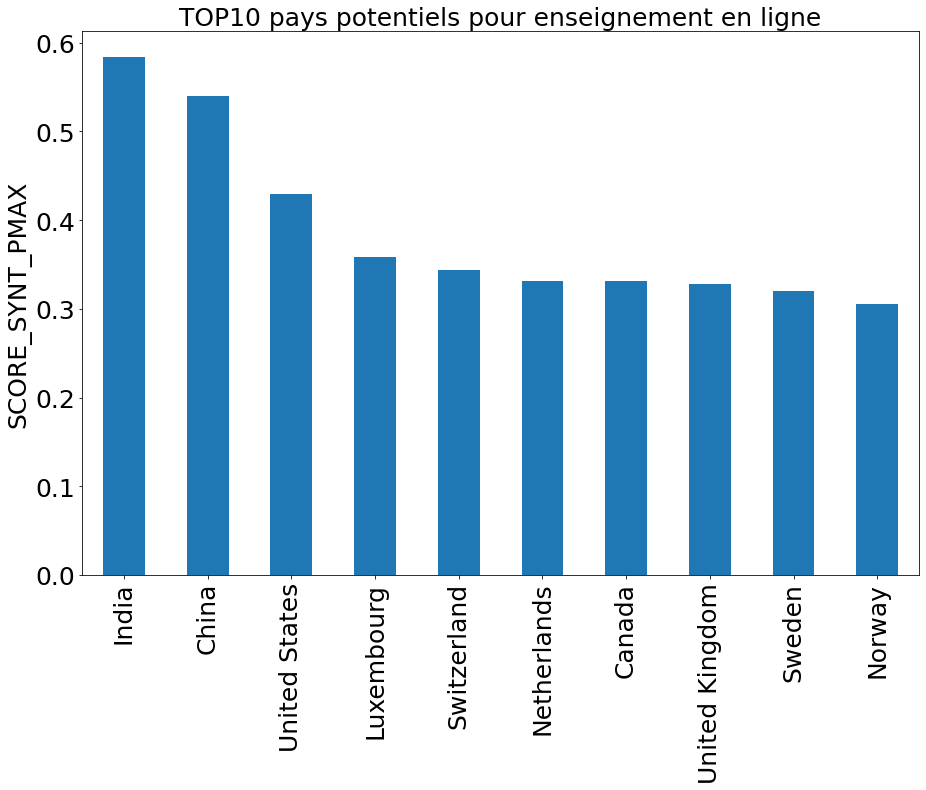

In [107]:
# plot bar 

Top_countries_PMAX.plot(x ='Country', y='SCORE_SYNT_PMAX', kind='bar', figsize=(15, 10),legend=False, rot=90, fontsize=25 )


#plt.ylim([0, 0.75])
plt.xlabel('')
plt.ylabel('SCORE_SYNT_PMAX', fontsize=25 )
plt.title('TOP10 pays potentiels pour enseignement en ligne', fontsize=25)
 
#tick_params(bottom=False, left=True)
#plt.show()
plt.savefig('Top10-popmax', dpi=200, bbox_inches='tight') 

-------------------------------------------------------------------------------------------------------------------------------

### On note que :

### - Le score d'attractivite est dominee par la population tres elevee de certains pays (les outliers Inde et Chine).
### - Il y a aussi une forte contribution du score economique. Ce qui met des petits pays (population tres faible) tel que le Luxembourg en avance. 

### - L'utilisation d'un modele avec un poids caracterisant chaque score (ponderation) est necessaire pour eviter des resultats pas tres pertinents comme ceux cites en haut. 

-------------------------------------------------------------------------------------------------------------------------------




# Classement par region

In [154]:
# Ajouter ls regions
df_lyear
df_reg_inc = pd.DataFrame({'Country_Name': dft_red_country_income['Country Name'],
                               'Region': dft_red_country_income['Region'],
                               'Income Group': dft_red_country_income['Income Group']})
dft_resh_c
df_score_region = pd.merge(dft_resh_c, df_reg_inc, left_on='Country', right_on='Country_Name', how='inner')
df_score_region.drop(columns=['Country_Name'], inplace=True)
df_score_region.drop_duplicates(inplace=True)
df_score_region.sort_values(by='SCORE_SYNT_PMAX', ascending=False).head(10)
df_score_region.drop_duplicates(inplace=True)

# Regroupement par region

df_score_region['SCORE_SYNT_SUM']=df_score_region['SCORE_SYNT_PMAX']*7
df_score_region_g = df_score_region.groupby('Region').mean()

df_score_region_g = df_score_region_g.sort_values(by='SCORE_SYNT_SUM', ascending=False)
df_score_region_g

# #df_score_region_fin = df_score_region[["SCORE_POP_SEC", "SCORE_POP_UNIV", "SCORE_INT", "SCORE_STUD_USEC","SCORE_STUD_UNIV", "SCORE_ECON", "SCORE_PC", "SCORE_SYNT_SUM"]]
df_score_region_fin = df_score_region_g[["SCORE_POP_MAX_SEC", "SCORE_POP_MAX_UNIV", "SCORE_INT", "SCORE_STUD_USEC_MAX","SCORE_STUD_UNIV_MAX", "SCORE_ECON", "SCORE_PC", "SCORE_SYNT_SUM"]]
df_score_region_fin



,SCORE_POP_MAX_SEC,SCORE_POP_MAX_UNIV,SCORE_INT,SCORE_STUD_USEC_MAX,SCORE_STUD_UNIV_MAX,SCORE_ECON,SCORE_PC,SCORE_SYNT_SUM
Region,,,,,,,,
North America,0.045592,0.070196,0.886012,0.080091,0.159451,0.399459,0.681631,2.322433
Europe & Central Asia,0.006916,0.009979,0.715619,0.013790,0.018508,0.248764,0.357158,1.370735
East Asia & Pacific,0.034165,0.057877,0.482678,0.053216,0.065643,0.184157,0.199779,1.077516
Middle East & North Africa,0.011083,0.015215,0.576499,0.013952,0.017112,0.249740,0.171282,1.054883
South Asia,0.168965,0.169041,0.259974,0.157148,0.106872,0.052677,0.042135,0.956812
Latin America & Caribbean,0.010204,0.014561,0.538520,0.014905,0.019003,0.126313,0.107013,0.830520
Sub-Saharan Africa,0.013722,0.016881,0.193898,0.007936,0.004094,0.042573,0.037265,0.316369


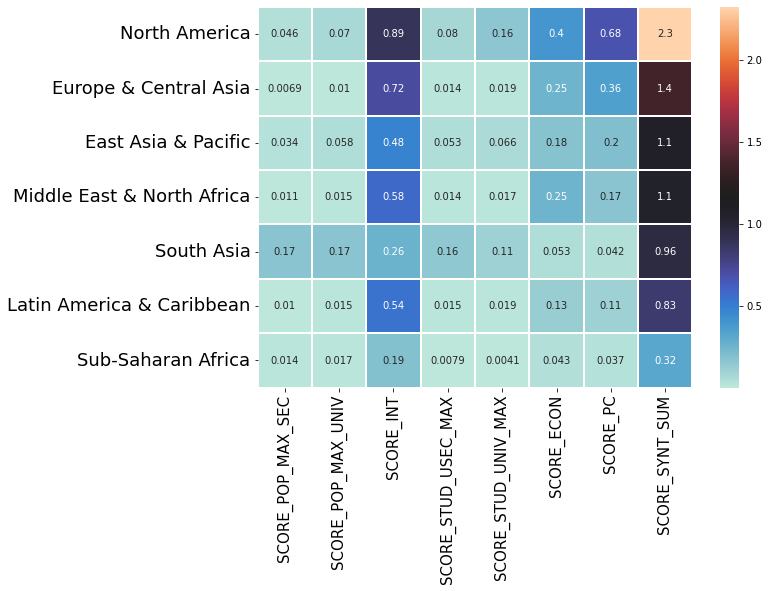

In [155]:
# plot heat map
fig = plt.figure(1, figsize=(10, 7))
res = sns.heatmap(df_score_region_fin, square=True, annot=True,
                  linewidths=0.1, cmap="icefire")
res.set_yticklabels(res.get_ymajorticklabels(), fontsize=18)
res.set_xticklabels(res.get_xmajorticklabels(), fontsize=15)
#plt.xlabel('', fontsize = 15) 
plt.ylabel('', fontsize = 15) 
#plt.title('Classement par region', fontsize=25)

plt.savefig('HM_classemnt-regions_score', dpi=200, bbox_inches='tight')   

In [114]:
##### liste des 10 pays les mieux classés pour SCORE_SYNT_PTOT ou les populations sont normalisees par rapport au pop totale de chaque pays et etudiants normalise par rapport a la population age de chaque categorie

dft_resh_norm_stds=dft_resh_c.copy()

# normaliser par rapport a la population des lyceens universitaires de chaque pays

dft_resh_norm_stds['SCORE_STUD_USEC']= dft_resh_c['Nb_studs_usec'] / dft_resh_c['pop_age_usec']
dft_resh_norm_stds['SCORE_STUD_UNIV']= dft_resh_c['Nb_studs_tert'] / dft_resh_c['pop_age_tert']

#normalisation stud/max students

dft_resh_norm_stds['SCORE_STUD_USEC_1']= dft_resh_c['Nb_studs_usec'] / dft_resh_c['Nb_studs_usec'].max()
dft_resh_norm_stds['SCORE_STUD_UNIV_1']= dft_resh_c['Nb_studs_tert'] / dft_resh_c['Nb_studs_tert'].max()

dft_resh_norm_stds['SCORE_SYNT_PTOT']=(dft_resh_c['SCORE_ECON']+ dft_resh_c['SCORE_INT'] +dft_resh_c['SCORE_PC'] +(dft_resh_norm_stds['SCORE_STUD_USEC'])+(dft_resh_norm_stds['SCORE_STUD_UNIV'])+dft_resh_c['SCORE_POP_SEC']+dft_resh_c['SCORE_POP_UNIV'])/7
print("--------------------------------------------------------------------------------------------------------------\n")

print("liste des top15 pays : normalisation population totale/pays et nombre etudiants/population age correspondant de chaque pays\n")
print("--------------------------------------------------------------------------------------------------------------\n")
Top_countries_PTOT_norm=dft_resh_norm_stds.sort_values('SCORE_SYNT_PTOT', ascending=False).iloc[:15]
Top_countries_PTOT_norm.reset_index(drop=True)

--------------------------------------------------------------------------------------------------------------

liste des top15 pays : normalisation population totale/pays et nombre etudiants/population age correspondant de chaque pays

--------------------------------------------------------------------------------------------------------------



,Country,Code,Int_users(/100),PC(/100),Purch Power($),pop_age_usec,Nb_studs_usec,pop_age_tert,Nb_studs_tert,Total_population,...,SCORE_POP_SEC,SCORE_POP_UNIV,SCORE_STUD_USEC_MAX,SCORE_STUD_UNIV_MAX,SCORE_STUD_USEC,SCORE_STUD_UNIV,SCORE_SYNT_PMAX,SCORE_SYNT_PTOT,SCORE_STUD_USEC_1,SCORE_STUD_UNIV_1
0,Australia,AUS,84.560519,60.140967,46475.927752,586024.0,1.104162e+06,1602152.0,1.453521e+06,23789338.0,...,0.024634,0.067347,0.019993,0.033516,1.884158,0.907230,0.274567,0.676073,0.019993,0.033516
1,Finland,FIN,86.422133,50.034614,42289.364567,186334.0,3.575500e+05,346522.0,3.024780e+05,5479531.0,...,0.034005,0.063239,0.006474,0.006975,1.918866,0.872897,0.249778,0.659890,0.006474,0.006975
2,Sweden,SWE,90.610200,88.011928,48037.839831,311910.0,5.020350e+05,687884.0,4.285570e+05,9799186.0,...,0.031830,0.070198,0.009090,0.009882,1.609551,0.623008,0.320082,0.649613,0.009090,0.009882
3,Netherlands,NLD,91.724138,90.987849,50054.194363,592764.0,7.464150e+05,1016406.0,8.426010e+05,16939923.0,...,0.034992,0.060001,0.013515,0.019429,1.259211,0.829000,0.331169,0.636280,0.013515,0.019429
4,Denmark,DNK,96.330500,54.869173,48979.269518,217126.0,3.113590e+05,378992.0,3.137560e+05,5683483.0,...,0.038203,0.066683,0.005638,0.007235,1.434001,0.827870,0.278837,0.614340,0.005638,0.007235
5,Ireland,IRL,80.122400,58.682891,69627.540930,106850.0,1.509050e+05,256192.0,2.146320e+05,4676835.0,...,0.022847,0.054779,0.002732,0.004949,1.412307,0.837778,0.282993,0.613965,0.002732,0.004949
6,Norway,NOR,96.810300,62.775903,62066.808188,198378.0,2.498820e+05,349731.0,2.682310e+05,5188607.0,...,0.038233,0.067404,0.004524,0.006185,1.259626,0.766964,0.305542,0.607912,0.004524,0.006185
7,United Kingdom,GBR,92.000300,80.170361,42124.651892,2977214.0,4.195082e+06,4166196.0,2.352933e+06,65128861.0,...,0.045713,0.063969,0.075958,0.054256,1.409063,0.564768,0.327731,0.597505,0.075958,0.054256
8,Iceland,ISL,98.200000,53.210417,47690.381576,18348.0,2.314900e+04,24132.0,1.909700e+04,330815.0,...,0.055463,0.072947,0.000419,0.000440,1.261663,0.791356,0.275221,0.586676,0.000419,0.000440
9,Canada,CAN,88.470000,94.446705,44204.946582,1243512.0,1.531393e+06,2389616.0,1.212161e+06,35848610.0,...,0.034688,0.066659,0.027728,0.027951,1.231506,0.507262,0.330866,0.581137,0.027728,0.027951


In [118]:
#normalisation stud/max students

dft_resh_norm_stds['SCORE_STUD_USEC_1']= dft_resh_c['Nb_studs_usec'] / dft_resh_c['Nb_studs_usec'].max()
dft_resh_norm_stds['SCORE_STUD_UNIV_1']= dft_resh_c['Nb_studs_tert'] / dft_resh_c['Nb_studs_tert'].max()

dft_resh_norm_stds['SCORE_SYNT_PTOT_norm_stds_max']=(dft_resh_c['SCORE_ECON']+ dft_resh_c['SCORE_INT'] +dft_resh_c['SCORE_PC'] +(dft_resh_norm_stds['SCORE_STUD_USEC_1'])+(dft_resh_norm_stds['SCORE_STUD_UNIV_1'])+dft_resh_c['SCORE_POP_SEC']+dft_resh_c['SCORE_POP_UNIV'])/7

print("--------------------------------------------------------------------------------------------------------------\n")

print("liste des top10 pays : normalisation population totale/pays et nombre etudiants/maximal de tous les pays. Pas tres different de norm max pour la liste des pays mais c'est le calssement qui change\n")
print("--------------------------------------------------------------------------------------------------------------\n")

dft_resh_norm_stds.sort_values('SCORE_SYNT_PTOT_norm_stds_max', ascending=False).iloc[:10].reset_index(drop=True)


--------------------------------------------------------------------------------------------------------------

liste des top10 pays : normalisation population totale/pays et nombre etudiants/maximal de tous les pays. Pas tres different de norm max pour la liste des pays mais c'est le calssement qui change

--------------------------------------------------------------------------------------------------------------



,Country,Code,Int_users(/100),PC(/100),Purch Power($),pop_age_usec,Nb_studs_usec,pop_age_tert,Nb_studs_tert,Total_population,...,SCORE_POP_UNIV,SCORE_STUD_USEC_MAX,SCORE_STUD_UNIV_MAX,SCORE_STUD_USEC,SCORE_STUD_UNIV,SCORE_SYNT_PMAX,SCORE_SYNT_PTOT,SCORE_STUD_USEC_1,SCORE_STUD_UNIV_1,SCORE_SYNT_PTOT_norm_stds_max
0,United States,USA,74.554202,79.915488,56469.008969,12321350.0,11736315.0,22765372.0,19531728.00,3.208966e+08,...,0.070943,0.212504,0.450378,0.952519,0.857958,0.429836,0.564432,0.212504,0.450378,0.400490
1,Luxembourg,LUX,97.334100,68.209751,103732.639291,26920.0,24409.0,34114.0,6085.00,5.696040e+05,...,0.059891,0.000442,0.000140,0.906724,0.178373,0.358891,0.529050,0.000442,0.000140,0.374119
2,China,CHN,50.300000,5.588372,14478.147546,46531520.0,43709224.0,99943816.0,43367392.00,1.371220e+09,...,0.072887,0.791423,1.000000,0.939347,0.433918,0.540009,0.309013,0.791423,1.000000,0.368750
3,Switzerland,CHE,87.479056,96.170657,63291.538276,360619.0,350927.0,510558.0,294450.00,8.282396e+06,...,0.061644,0.006354,0.006790,0.973124,0.576722,0.343734,0.577159,0.006354,0.006790,0.357630
4,Netherlands,NLD,91.724138,90.987849,50054.194363,592764.0,746415.0,1016406.0,842601.00,1.693992e+07,...,0.060001,0.013515,0.019429,1.259211,0.829000,0.331169,0.636280,0.013515,0.019429,0.342671
5,Canada,CAN,88.470000,94.446705,44204.946582,1243512.0,1531393.0,2389616.0,1212161.00,3.584861e+07,...,0.066659,0.027728,0.027951,1.231506,0.507262,0.330866,0.581137,0.027728,0.027951,0.340696
6,United Kingdom,GBR,92.000300,80.170361,42124.651892,2977214.0,4195081.5,4166196.0,2352932.75,6.512886e+07,...,0.063969,0.075958,0.054256,1.409063,0.564768,0.327731,0.597505,0.075958,0.054256,0.334131
7,Sweden,SWE,90.610200,88.011928,48037.839831,311910.0,502035.0,687884.0,428557.00,9.799186e+06,...,0.070198,0.009090,0.009882,1.609551,0.623008,0.320082,0.649613,0.009090,0.009882,0.333386
8,India,IND,26.000000,3.192145,6139.193969,99198160.0,55228676.0,119469984.0,32107420.00,1.309054e+09,...,0.091264,1.000000,0.740359,0.556751,0.268749,0.583719,0.191174,1.000000,0.740359,0.321868
9,Norway,NOR,96.810300,62.775903,62066.808188,198378.0,249882.0,349731.0,268231.00,5.188607e+06,...,0.067404,0.004524,0.006185,1.259626,0.766964,0.305542,0.607912,0.004524,0.006185,0.319929


## Graphique top 15 pays avec le score d'attractivite le plus eleve (SCORE_SYNT_PTOT)

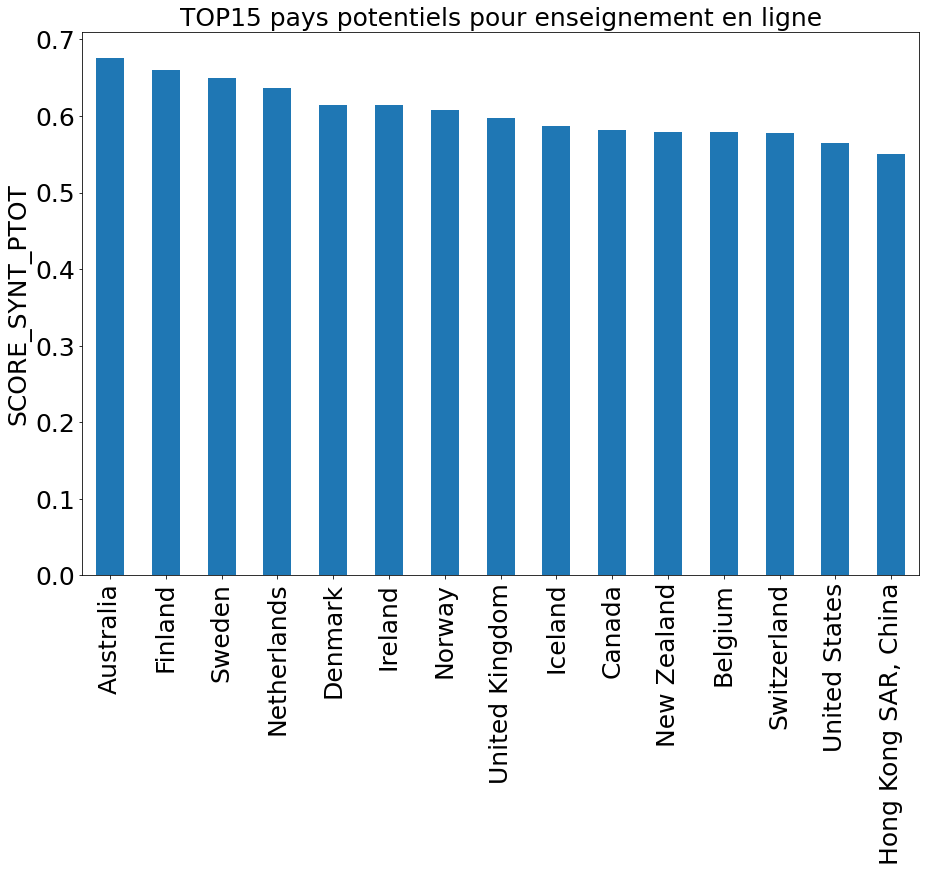

In [151]:
# plot bar 

Top_countries_PTOT_norm.plot(x ='Country', y='SCORE_SYNT_PTOT', kind='bar', figsize=(15, 10),legend=False, rot=90, fontsize=25 )


#plt.ylim([0, 0.75])
plt.xlabel('')
plt.ylabel('SCORE_SYNT_PTOT', fontsize=25 )
plt.title('TOP15 pays potentiels pour enseignement en ligne', fontsize=25)
 
#tick_params(bottom=False, left=True)

plt.savefig('classement-score_PTOT', dpi=200, bbox_inches='tight')   
plt.show()

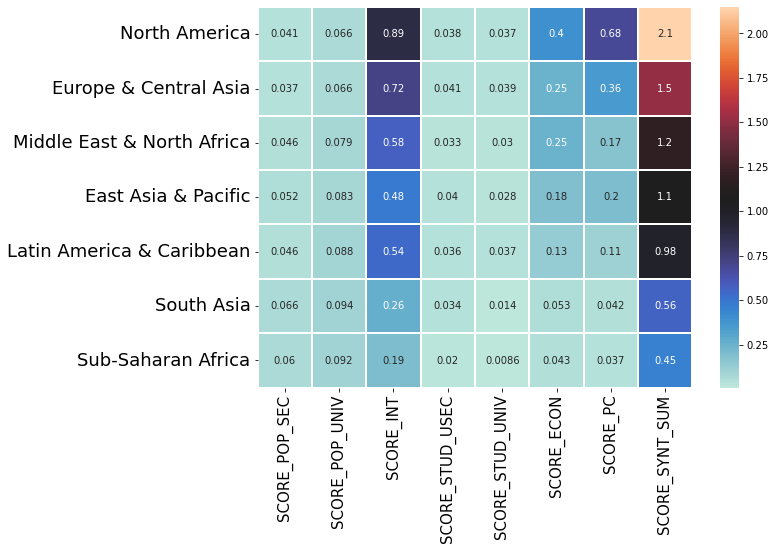

In [120]:
#Donnez la liste des 10 pays les mieux classés pour SCORE_SYNT_PTOT ou les populations (et etudiants) sont normalisees par rapport au pop totale de chaque pays

# Top_countries_PTOT=dft_resh_c.sort_values('SCORE_SYNT_PTOT', ascending=False).iloc[:10]
# Top_countries_PTOT.reset_index(drop=True)

# Regroupement par region

df_score_region['SCORE_SYNT_SUM']=df_score_region['SCORE_SYNT_PTOT']*7
df_score_region_g = df_score_region.groupby('Region').mean()

df_score_region_g = df_score_region_g.sort_values(by='SCORE_SYNT_SUM', ascending=False)
df_score_region_g

# #df_score_region_fin = df_score_region[["SCORE_POP_SEC", "SCORE_POP_UNIV", "SCORE_INT", "SCORE_STUD_USEC","SCORE_STUD_UNIV", "SCORE_ECON", "SCORE_PC", "SCORE_SYNT_SUM"]]
df_score_region_fin = df_score_region_g[["SCORE_POP_SEC", "SCORE_POP_UNIV", "SCORE_INT", "SCORE_STUD_USEC","SCORE_STUD_UNIV", "SCORE_ECON", "SCORE_PC", "SCORE_SYNT_SUM"]]
df_score_region_fin

# plot heat map
fig = plt.figure(1, figsize=(10, 7))
res = sns.heatmap(df_score_region_fin, square=True, annot=True,
                  linewidths=0.1, cmap="icefire")
res.set_yticklabels(res.get_ymajorticklabels(), fontsize=18)
res.set_xticklabels(res.get_xmajorticklabels(), fontsize=15)
#plt.xlabel('', fontsize = 15) 
plt.ylabel('', fontsize = 15) 
#plt.title('Classement par region', fontsize=25)


plt.savefig('HM_classement-regions_score_PTOT', dpi=200, bbox_inches='tight')   

-------------------------------------------------------------------------------------------------------------------------------

### A noter:

### - Avec la normalisation par rapport a la population totale de chaque pays, le resultat n'est plus domine par les outliers de la population (plus pertinent) 
### - L'influence de l'indicateur economique est toujours tres important d'ou les pays a faible population dans la liste (Finland, Iceland).
### - L'utilisation des poids (weights) de ponderation pour reduire l'influence de l'indicateur economique. J'espere apprendre a le faire dans les prochains projets
### Pour le moment, je garde la liste avec normalisation par rapport a la population mondiale maximale (SCORE_SYNT_PMAX) pour repondre a la question d'evolution de chaque pays de la liste

-------------------------------------------------------------------------------------------------------------------------------

## Evolution du potentiel de chaque pays de la liste top10

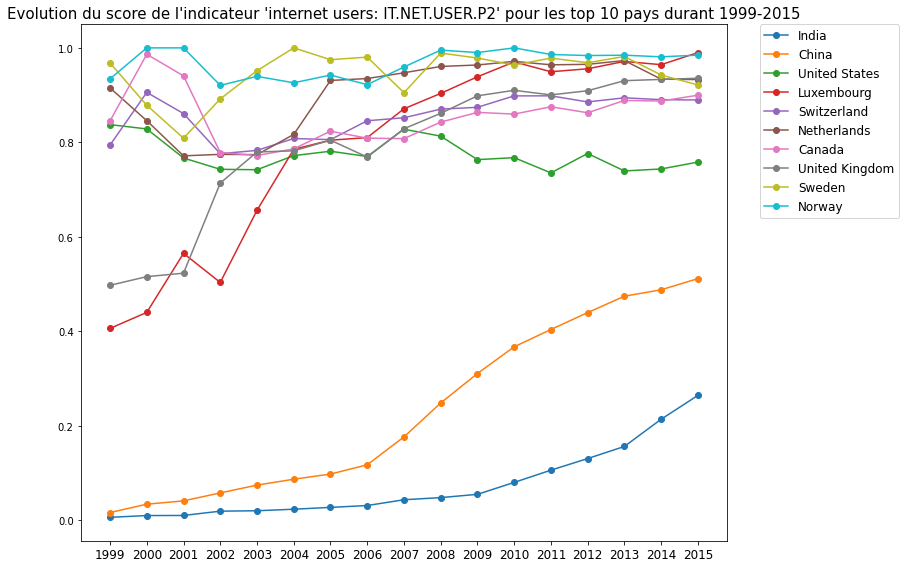

In [126]:
# evolution prediction!
# ['IT.NET.USER.P2', 'IT.CMP.PCMP.P2', 'SP.SEC.UTOT.IN', 'SP.TER.TOTL.IN', 'UIS.E.3', 'NY.GDP.PCAP.PP.CD', 'SE.TER.ENRL', 'SP.POP.TOTL']
# df avec la liste des 10 top pays selectionnes:
# avant calculer les scores pour chaque indicateurs/an
# tracer pour chaque indicateur score ou score synthese pour les top10 

col_num=dft_red_country_income .select_dtypes(include=['float64']).columns

# score internet 

dft_net=dft_red_country_income [dft_red_country_income ['Indicator Code'] == 'IT.NET.USER.P2']

score_net_top10={}
for country in Top_countries_PMAX['Country']: 
     score_net_top10[country]=list()
     for j in col_num:
          x=(dft_net.loc[dft_net['Country Name']==country, j]/dft_net[j].max()).values#.tolist()
          score_net_top10[country].append(x[0]) 

            
# print(score_net_top10.keys())
# print(score_net_top10.values())




# Visualisation de l'evolution net
plt.figure(figsize=(12, 8))
ax = plt.axes()

for country in score_net_top10.keys():
    #for j in len(score_net_top10):
    plt.plot(score_net_top10[country], marker='o', label=country)
   
x_tick_label = []
x_tick_list = []
for k in range(1999,2016): 
    x_tick_label.append(k)
    x_tick_list.append(x_tick_label.index(k))
# print(len(x_tick_label))    
# print(len(x_tick_list))

plt.xticks(ticks=x_tick_list,labels=x_tick_label, rotation=0,fontsize=12)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize=12 )
plt.title("Evolution du score de l'indicateur 'internet users: IT.NET.USER.P2' pour les top 10 pays durant 1999-2015", fontsize=15)
plt.tight_layout()
# plt.xlabel ("K")
# plt.ylabel ("B")

plt.savefig('score_net', dpi=200, bbox_inches='tight')
#plt.show()

#print(type(score_net_us))



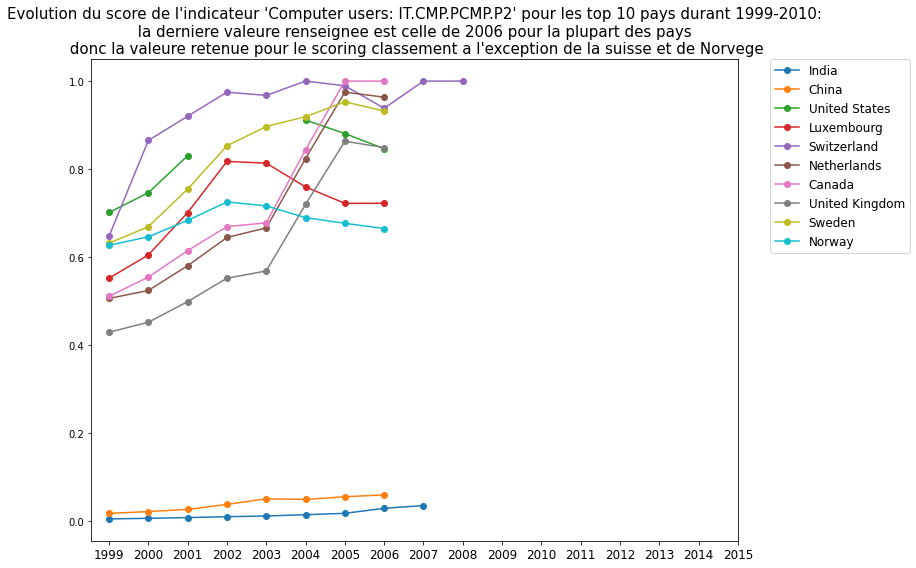

In [207]:
# score pc 
col_num=dft_red_country_income .select_dtypes(include=['float64']).columns
dft_pc=dft_red_country_income [dft_red_country_income ['Indicator Code'] == 'IT.CMP.PCMP.P2']
score_pc_top10={}
for country in Top_countries_PMAX['Country']: 
    #print(country)
    score_pc_top10[country]=list()
    for j in col_num:
        x=(dft_pc.loc[dft_pc['Country Name']==country, j]/dft_pc[j].max()).values#.tolist()
        score_pc_top10[country].append(x[0]) 


# Visualisation de l'evolution pc

plt.figure(figsize=(12, 8))
ax = plt.axes()

for country in score_pc_top10.keys():
    plt.plot(score_pc_top10[country], marker='o', label=country)
   
x_tick_label = []
x_tick_list = []
for k in range(1999,2016): 
    x_tick_label.append(k)
    x_tick_list.append(x_tick_label.index(k))
# print(len(x_tick_label))    
# print(len(x_tick_list))

plt.xticks(ticks=x_tick_list,labels=x_tick_label, rotation=0,fontsize=12)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.,fontsize=12)
plt.title("Evolution du score de l'indicateur 'Computer users: IT.CMP.PCMP.P2' pour les top 10 pays durant 1999-2010:\n la derniere valeure renseignee est celle de 2006 pour la plupart des pays \n donc la valeure retenue pour le scoring classement a l'exception de la suisse et de Norvege", 
          fontsize=15)
plt.tight_layout()
# plt.xlabel ("K")
# plt.ylabel ("B")

#plt.savefig('score_pc', dpi=200, bbox_inches='tight')





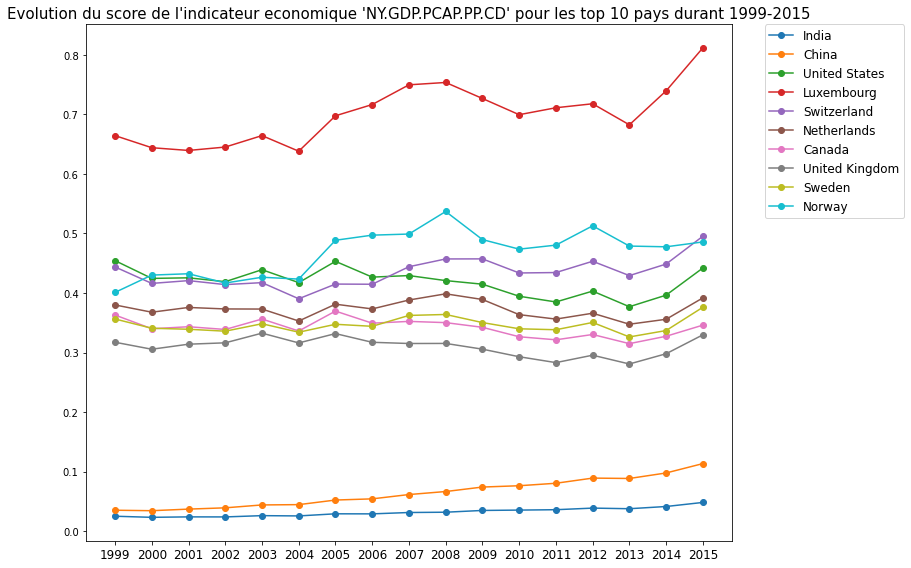

In [132]:
# score economique

dft_ec=dft_red_country_income [dft_red_country_income ['Indicator Code'] == 'NY.GDP.PCAP.PP.CD']

score_ec_top10={}
for country in Top_countries_PMAX['Country']: 
     score_ec_top10[country]=list()
     for j in col_num:
          x=(dft_ec.loc[dft_ec['Country Name']==country, j]/dft_ec[j].max()).values#.tolist()
          score_ec_top10[country].append(x[0]) 
        
        

# Visualisation de l'evolution du score economique 

plt.figure(figsize=(12, 8))
ax = plt.axes()

for country in score_ec_top10.keys():
    plt.plot(score_ec_top10[country], marker='o', label=country)
   
x_tick_label = []
x_tick_list = []
for k in range(1999,2016): 
    x_tick_label.append(k)
    x_tick_list.append(x_tick_label.index(k))
# print(len(x_tick_label))    
# print(len(x_tick_list))

plt.xticks(ticks=x_tick_list,labels=x_tick_label, rotation=0,fontsize=12)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize=12)
plt.title("Evolution du score de l'indicateur economique 'NY.GDP.PCAP.PP.CD' pour les top 10 pays durant 1999-2015", fontsize=15)
plt.tight_layout()
# plt.xlabel ("K")
# plt.ylabel ("B")

plt.savefig('score_econ', dpi=200, bbox_inches='tight')        

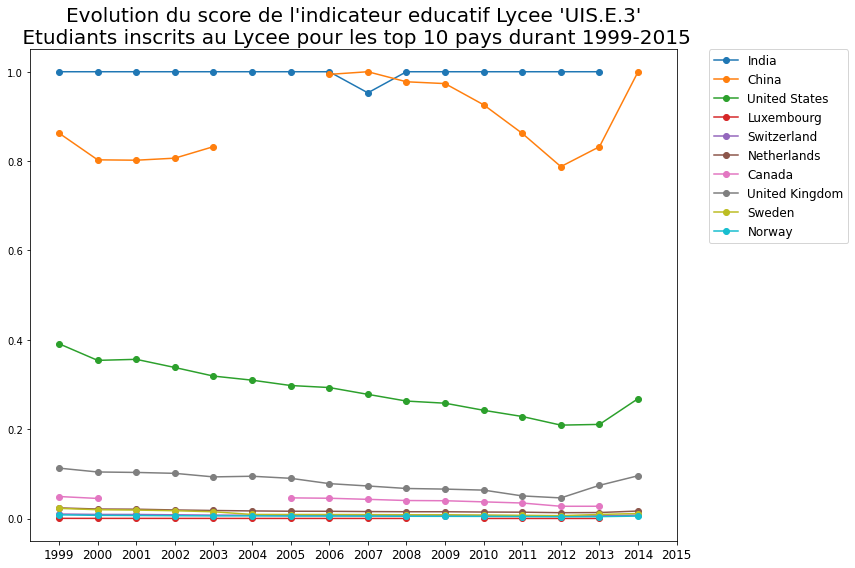

In [139]:
# score etudiants inscrits up secondary (Lycee)

dft_std_lycee=dft_red_country_income [dft_red_country_income ['Indicator Code'] == 'UIS.E.3']

score_std_lycee_top10={}
for country in Top_countries_PMAX['Country']: 
     score_std_lycee_top10[country]=list()
     for j in col_num:
          x=(dft_std_lycee.loc[dft_std_lycee['Country Name']==country, j]/dft_std_lycee[j].max()).values#.tolist()
          score_std_lycee_top10[country].append(x[0]) 
        
        

# Visualisation de l'evolution du score economique 

plt.figure(figsize=(12, 8))
ax = plt.axes()

for country in score_std_lycee_top10.keys():
    plt.plot(score_std_lycee_top10[country], marker='o', label=country)
   
x_tick_label = []
x_tick_list = []
for k in range(1999,2016): 
    x_tick_label.append(k)
    x_tick_list.append(x_tick_label.index(k))
# print(len(x_tick_label))    
# print(len(x_tick_list))

plt.xticks(ticks=x_tick_list,labels=x_tick_label, rotation=0,fontsize=12)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.,fontsize=12)
plt.title("Evolution du score de l'indicateur educatif Lycee 'UIS.E.3'\n Etudiants inscrits au Lycee pour les top 10 pays durant 1999-2015",fontsize=20)
plt.tight_layout()
# plt.xlabel ("K")
# plt.ylabel ("B")

plt.savefig('score_std_usec', dpi=200, bbox_inches='tight')        

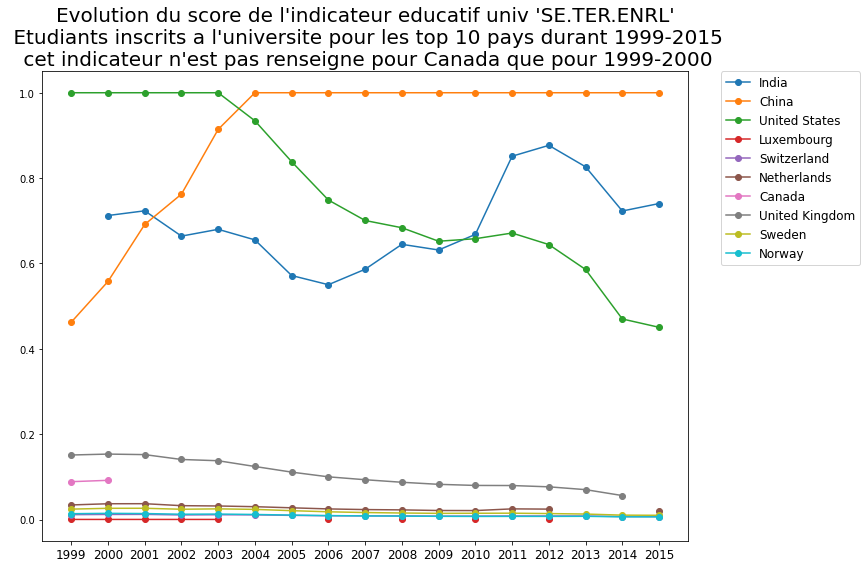

In [136]:
# score etudiants inscrits universite (tertiary)

dft_std_univ=dft_red_country_income [dft_red_country_income ['Indicator Code'] == 'SE.TER.ENRL']

score_std_univ_top10={}
for country in Top_countries_PMAX['Country']: 
     score_std_univ_top10[country]=list()
     for j in col_num:
          x=(dft_std_univ.loc[dft_std_univ['Country Name']==country, j]/dft_std_univ[j].max()).values#.tolist()
          score_std_univ_top10[country].append(x[0]) 
        
        

# Visualisation de l'evolution du score economique 

plt.figure(figsize=(12, 8))
ax = plt.axes()

for country in score_std_univ_top10.keys():
    plt.plot(score_std_univ_top10[country], marker='o', label=country)
   
x_tick_label = []
x_tick_list = []
for k in range(1999,2016): 
    x_tick_label.append(k)
    x_tick_list.append(x_tick_label.index(k))
# print(len(x_tick_label))    
# print(len(x_tick_list))

plt.xticks(ticks=x_tick_list,labels=x_tick_label, rotation=0,fontsize=12)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize=12)
plt.title("Evolution du score de l'indicateur educatif univ 'SE.TER.ENRL'\n Etudiants inscrits a l'universite pour les top 10 pays durant 1999-2015\n cet indicateur n'est pas renseigne pour Canada que pour 1999-2000", fontsize=20)
plt.tight_layout()
# plt.xlabel ("K")
# plt.ylabel ("B")

plt.savefig('score_std_tert', dpi=200, bbox_inches='tight')        

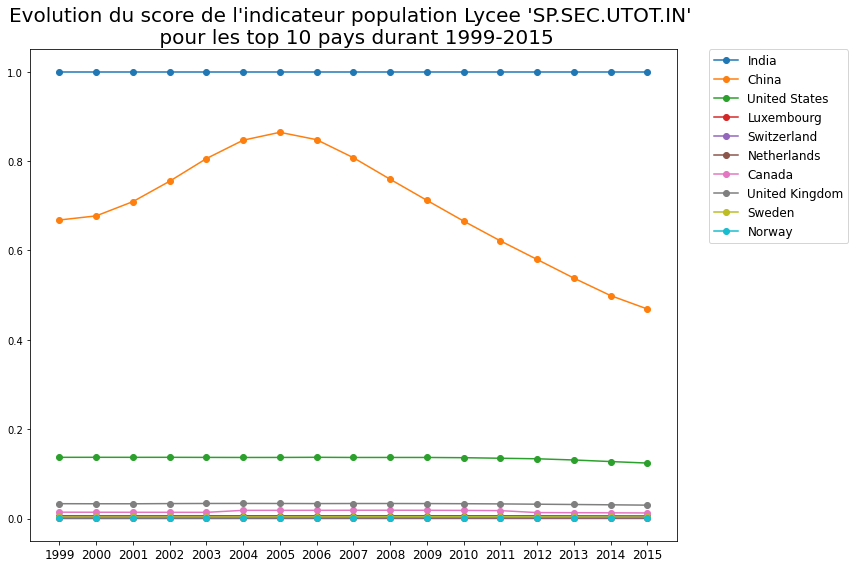

In [138]:
# score population age up secondary (Lycee) SP.SEC.UTOT.IN

dft_pop_lycee=dft_red_country_income [dft_red_country_income ['Indicator Code'] == 'SP.SEC.UTOT.IN']

score_pop_lycee_top10={}
for country in Top_countries_PMAX['Country']: 
     score_pop_lycee_top10[country]=list()
     for j in col_num:
          x=(dft_pop_lycee.loc[dft_pop_lycee['Country Name']==country, j]/dft_pop_lycee[j].max()).values#.tolist()
          score_pop_lycee_top10[country].append(x[0]) 
        
        

# Visualisation de l'evolution du score economique 

plt.figure(figsize=(12, 8))
ax = plt.axes()

for country in score_pop_lycee_top10.keys():
    plt.plot(score_pop_lycee_top10[country], marker='o', label=country)
   
x_tick_label = []
x_tick_list = []
for k in range(1999,2016): 
    x_tick_label.append(k)
    x_tick_list.append(x_tick_label.index(k))
# print(len(x_tick_label))    
# print(len(x_tick_list))

plt.xticks(ticks=x_tick_list,labels=x_tick_label, rotation=0,fontsize=12)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize=12)
plt.title("Evolution du score de l'indicateur population Lycee 'SP.SEC.UTOT.IN' \n pour les top 10 pays durant 1999-2015", fontsize=20)
plt.tight_layout()
# plt.xlabel ("K")
# plt.ylabel ("B")

plt.savefig('score_pop_usec', dpi=200, bbox_inches='tight')        

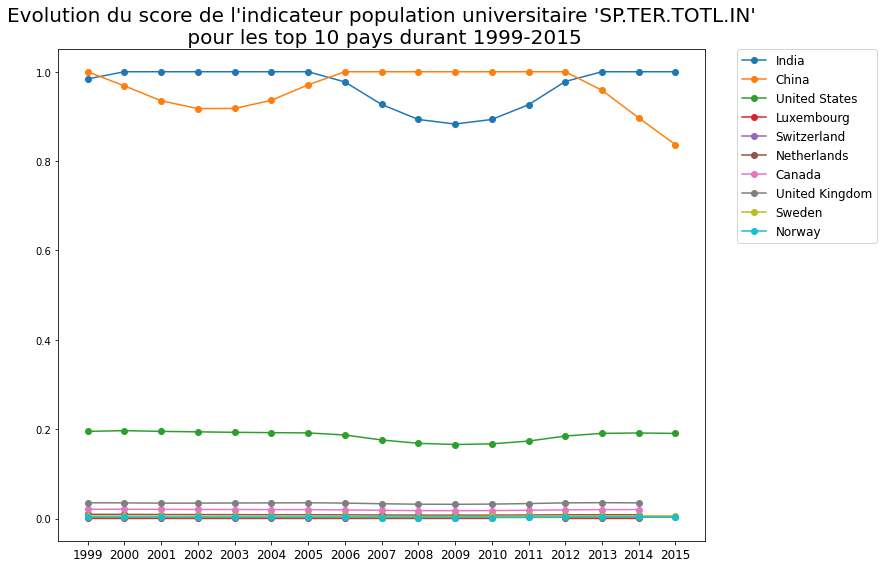

In [141]:
# score population age universite (tertiary) SP.TER.TOTL.IN

dft_pop_univ=dft_red_country_income [dft_red_country_income ['Indicator Code'] == 'SP.TER.TOTL.IN']

score_pop_univ_top10={}
for country in Top_countries_PMAX['Country']: 
     score_pop_univ_top10[country]=list()
     for j in col_num:
          x=(dft_pop_univ.loc[dft_pop_univ['Country Name']==country, j]/dft_pop_univ[j].max()).values#.tolist()
          #print(x)
          score_pop_univ_top10[country].append(x[0]) 
        
        

# Visualisation de l'evolution du score population age universite (tertiary)

plt.figure(figsize=(12, 8))
ax = plt.axes()

for country in score_pop_univ_top10.keys():
    plt.plot(score_pop_univ_top10[country], marker='o', label=country)
   
x_tick_label = []
x_tick_list = []
for k in range(1999,2016): 
    x_tick_label.append(k)
    x_tick_list.append(x_tick_label.index(k))
# print(len(x_tick_label))    
# print(len(x_tick_list))

plt.xticks(ticks=x_tick_list,labels=x_tick_label, rotation=0,fontsize=12)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.,fontsize=12)
plt.title("Evolution du score de l'indicateur population universitaire 'SP.TER.TOTL.IN'\n pour les top 10 pays durant 1999-2015",fontsize=20)
plt.tight_layout()
# plt.xlabel ("K")
# plt.ylabel ("B")

plt.savefig('score_pop_univ', dpi=200, bbox_inches='tight')        

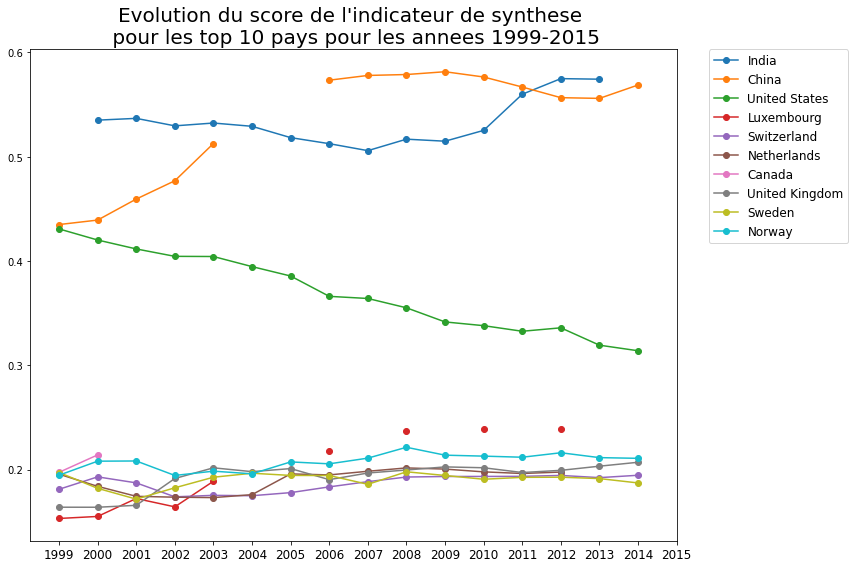

In [143]:
# score de synthese pour les 7 indicateurs pour les top 10 [1999-2015]
#score_pop_univ_top10
#[L1[i]+L2[i] for i in range(min(len(L1),len(L2)))]+max(L1,L2,key=len)[min(len(L1),len(L2)):]

score_synthese_all={}
for country in Top_countries_PMAX['Country']:
     score_synthese_all[country]=list()
     for j in range(17):
         x=score_net_top10[country][j]+score_pc_top10[country][j]+score_ec_top10[country][j]+score_std_lycee_top10[country][j]+score_std_univ_top10[country][j]+score_pop_lycee_top10[country][j]+score_pop_univ_top10[country][j]
         #print(type(x)) 
         #print(x) 
         score_synthese_all[country].append(x) 
#print(score_synthese_all)
# without indic pc car absents a partir de 2006
score_synthese_all_wo_pc={}
for country in Top_countries_PMAX['Country']:
     score_synthese_all_wo_pc[country]=list()
     for j in range(17):
         y=(score_net_top10[country][j]+score_ec_top10[country][j]+score_std_lycee_top10[country][j]+score_std_univ_top10[country][j]+score_pop_lycee_top10[country][j]+score_pop_univ_top10[country][j])/7
         #print(type(x)) 
         #print(x) 
         score_synthese_all_wo_pc[country].append(y) 
# score_synthese_all_wo_pc
# Visualisation de l'evolution du score de synthese totale pour top 10 countries du classement

plt.figure(figsize=(12, 8))
ax = plt.axes()
#countries=['United States', 'Luxembourg', 'Switzerland', 'Netherlands', 'Canada', 'United Kingdom', 'Sweden', 'Norway']
for country in score_synthese_all.keys():
    #plt.plot(score_synthese_all_wo_pc[country], marker='o', label=country)
     plt.plot(score_synthese_all_wo_pc[country], marker='o', label=country)
        
x_tick_label = []
x_tick_list = []
for k in range(1999,2016): 
    x_tick_label.append(k)
    x_tick_list.append(x_tick_label.index(k))
# print(len(x_tick_label))    
# print(len(x_tick_list))

plt.xticks(ticks=x_tick_list,labels=x_tick_label, rotation=0,fontsize=12)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.,fontsize=12)
plt.title("Evolution du score de l'indicateur de synthese \n pour les top 10 pays pour les annees 1999-2015",fontsize=20)
plt.tight_layout()
# plt.xlabel ("K")
# plt.ylabel ("B")
# x_tick_label = [2015]
# x_tick_list = [1]


plt.savefig('score_synthese_all_wo_pc', dpi=200, bbox_inches='tight')      
#score_synthese_all['country']=score_net_top10+score_pc_top10+score_ec_top10+score_std_lycee_top10+score_std_univ_top10+score_pop_lycee_top10+score_pop_univ_top10

#score_std_univ_top10['Canada']
#score_synthese_all

#score_net_top10['India'][0]+score_pc_top10['India'][0]

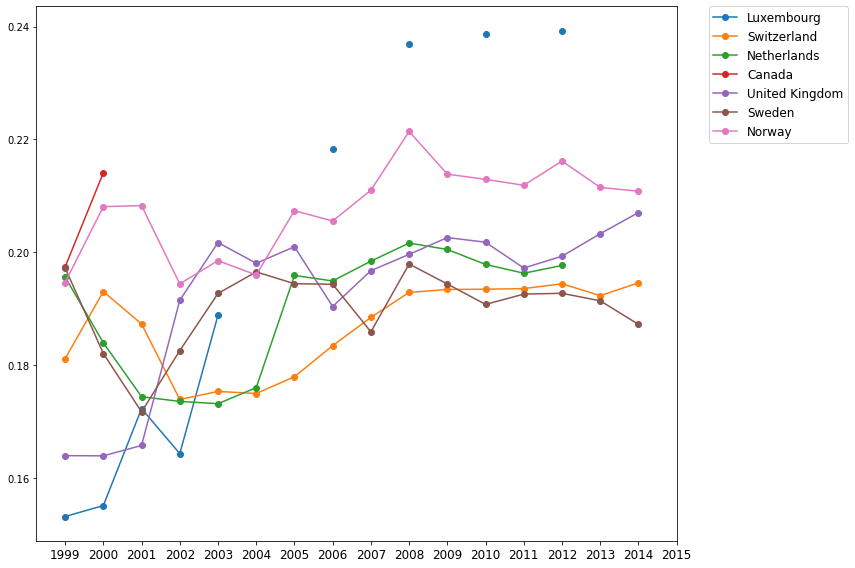

In [209]:
plt.figure(figsize=(12, 8))
ax = plt.axes()
countries=['Luxembourg', 'Switzerland', 'Netherlands', 'Canada', 'United Kingdom', 'Sweden', 'Norway']
for country in countries:
    #plt.plot(score_synthese_all_wo_pc[country], marker='o', label=country)
     plt.plot(score_synthese_all_wo_pc[country], marker='o', label=country)
        
x_tick_label = []
x_tick_list = []
for k in range(1999,2016): 
    x_tick_label.append(k)
    x_tick_list.append(x_tick_label.index(k))
# print(len(x_tick_label))    
# print(len(x_tick_list))

plt.xticks(ticks=x_tick_list,labels=x_tick_label, rotation=0,fontsize=12)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize=12)
#plt.title("Evolution du score l'indicateur de synthese pour les top10 pays pour les annees 1999-2015 a l'exception de l'Inde et de Chine")
plt.tight_layout()
# plt.xlabel ("K")
# plt.ylabel ("B")
# x_tick_label = [2015]
# x_tick_list = [1]


plt.savefig('score_synthese_all_wo_pc_w_indochine', dpi=200, bbox_inches='tight')      


## On se contente de decrire  l'evolution du potentiel des 10 pays de la liste en se basant sur les courbes d'evolution dans l'attente d'apprendre a integrer un modele convenable (a commencer par une regression lineaire)


### On constate : 


#### - Vue leur forte population, l'Inde et la chine reste a la tete de classement avec une echange de premiere place de temps a autre entre les 2 pays. Une etude supplementaire sur les formations en anglais dans ces 2 pays permettra de dire s'ils sont pas prioritaires ou pas pour une expansion commerciale. 

#### -  Les etats unis prend la 3eme place mais on constate que la pente d'evolution est negative et elle reculera bien en classement lors de 5 prochains annees selon cette evolution. Pour le moment il prend la tete des pays priorites pour l'expansion vue sa population importante en etudiants et la langue parlais anglais.

#### - Le Canada est penalise par l'absence d'informations sur le nombre d'etudiants a l'universite depuis 2000. Donc il est malheureusement a ecarter 

#### - Luxemburg est a la place 4 depuis 2005 mais a ecarter vue sa tres faible population


#### - La norvege prend la 5eme place depuis 2005 mais la tendance est croissante pour  UK. Le Royaume-Uni sera prvilégié et se place en 2eme pour les pays priorite pour l'expansion

####  - La tendance de Suede est decroissante. l'evolution de Suisse et Netherlands est tres proche. Netherlands est privilige vue sa population plus elevee (2x)











# Conclusion


#### D'apres les  premieres analyses descriptives pour la prediction, les pays prioritaires pour une expansion commerciale sont :
#### 1- Le Royaume-unis 
#### 2- Les Etats-unis
#### 3- Netherlands



In [149]:
## Evolution du potentiel des pays de liste 2 (SCORE_SYNT_PTOT)